In [202]:
%matplotlib inline 

In [290]:
from __future__ import division
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn_pandas import DataFrameMapper
import datetime
from sklearn import linear_model as lm
import sklearn
from scipy.stats import linregress
from scipy import interpolate
import csv
import os
from sunpy.time import parse_time
from scipy import interpolate




In [182]:
fl = pd.read_csv('full_dataset4_EF_friendly.csv', header=0, delimiter=',')
bcomplexity = [0 for i in range(fl.shape[0])]
i = 0
for elem in fl['ar_mtwilsoncls']:
    if elem =='ALPHA' or elem=='BETA' or elem=='BETAA':
        bcomplexity[i] = 1
    elif elem=='ALPHAGAMMA' or elem=='BETA-GAMMA' or elem=='BETAAGAMMA':
        bcomplexity[i]=2
    elif (elem=='ALPHADELTA' or elem=='ALPHAGAMMA-DELTA' or elem=='BETA-GAMMA-DELTA' or elem=='BETAADELTA' or 
          elem=='BETA-DELTA' or elem=='BETAAGAMMA-DELTA'):
        bcomplexity[i]=3
    elif elem=='BETA-DELTA-DELTA':
        bcomplexity[i]=4
    i+=1
    
fl.loc[:,'bcomplexity']=bcomplexity

fl.to_csv('full_dataset4_EF_friendly.csv', index=False)

In [39]:
fl = pd.read_csv('full_dataset4_EF_friendly.csv', header=0, delimiter=',')
fl = fl.ix[fl['is_ef']==1]
fl.to_csv('EF100_4.csv', index=False)

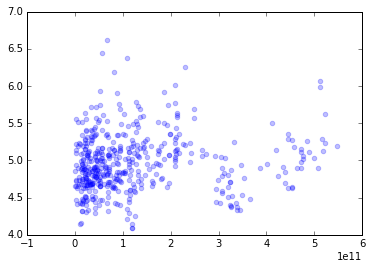

In [69]:
fl = pd.read_csv('full_dataset4_EF_friendly.csv', header=0, delimiter=',')
ar = fl.ix[fl['is_ar']==1]
ar1 = ar.ix[ar['bcomplexity']==1]
ar2 = ar.ix[ar['bcomplexity']==2]
ar3 = ar.ix[ar['bcomplexity']==3]
ar4 = ar.ix[ar['bcomplexity']==4]


plt.ylim(4,7)
plt.scatter(ar1['highsheararea'], np.log10(ar1['adjusted_peak']), alpha=0.25, color='b')
# plt.scatter(ar2['highsheararea'], np.log10(ar2['adjusted_peak']), alpha=0.25, color='r')
# plt.scatter(ar3['highsheararea'], np.log10(ar3['adjusted_peak']), alpha=0.25, color='y')
# plt.scatter(ar4['highsheararea'], np.log10(ar4['adjusted_peak']), alpha=0.25, color='black')


In [356]:
ef = pd.read_csv('EF_7_times2.csv', delimiter = ',', header=0)
noef = pd.read_csv('noEF_7_times2_EF_friendly.csv', delimiter = ',', header=0)
ef = pd.read_csv('full_dataset7.csv', delimiter = ',', header=0)
ar = ef.ix[ef['is_ar']==1]
noar = ef.ix[ef['is_ar']==0]
# noef = noef.ix[noef['is_ar']==1]
# ef = ef.ix[ef['adjusted_goesclass']=='C']
# noef = noef.ix[noef['adjusted_goesclass']=='C']

In [83]:
p = [10, 25, 33, 50, 66, 75, 90, 95, 99, 99.9]
meanar = ef['unsignedflux'].mean()
meanef = ef['sum_abs_signedflux'].mean()
quot = ef['sum_abs_signedflux']/ef['unsignedflux']
percentilesar = np.percentile(ef['unsignedflux'], p)
percentilesef = np.percentile(ef['sum_abs_signedflux'], p)
percentilequot = np.percentile(quot, p)
print meanar
print meanef
for i, pct in enumerate(p):
    print pct, percentilequot[i]
    

31770.8962844
5771.40528227
10 0.00459816215023
25 0.00887195636373
33 0.0109938340809
50 0.018304935818
66 0.0299679679178
75 0.0403016213388
90 0.124922373104
95 0.471553126008
99 8.47418530049
99.9 10.260839234


In [357]:
from scipy.stats import ks_2samp
ks_2samp(noar['adjusted_peak'], ar['adjusted_peak'])

Ks_2sampResult(statistic=0.07238254967786528, pvalue=4.4897384083764346e-05)

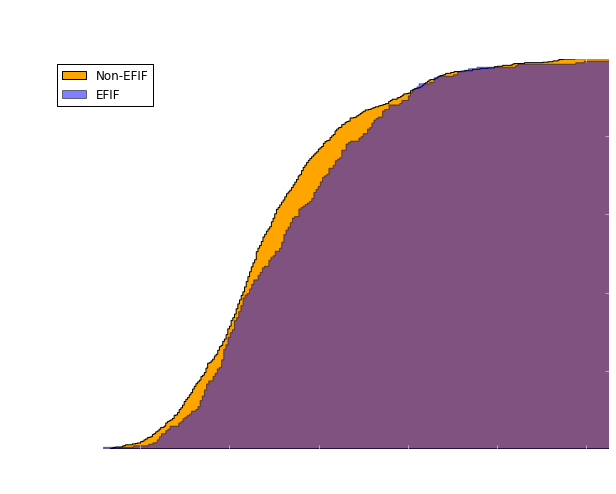

In [295]:
plt.figure(figsize = (10, 7))
ax = plt.subplot(111)
plt.hist(np.log10(noef['adjusted_peak']), normed=True, cumulative=True, bins=300, color='orange', 
         label = 'Non-EFIF', histtype = 'stepfilled')
_=plt.hist(np.log10(ef['adjusted_peak']), normed=True, cumulative=True, bins=250, alpha = 0.5, 
           label = 'EFIF', histtype = 'stepfilled', color='b')
plt.xlabel('log(Peak Flux)', color='white', size=20)
plt.ylabel('Normalized Cumulative Frequency', color='w', size=20)
plt.title('GOES Flares outside AR:\nCumulative Distribution of log(Peak Flux)', color='w', size = 25)
# plt.legend(bbox_to_anchor=(1.05, .65), loc=2, borderaxespad=0.)
plt.xlim(4.0,7.13)
plt.legend(loc=2)
plt.ylim(0,1)
ax.tick_params(color='white', labelcolor='white')
for spine in ax.spines.values():
    spine.set_edgecolor('white')
fNameSave = 'logpeakfluxdistributioncumulative_noAR.png' 
plt.savefig(fNameSave, bbox_inches = 'tight', pad_inches = 0.1, transparent=True)


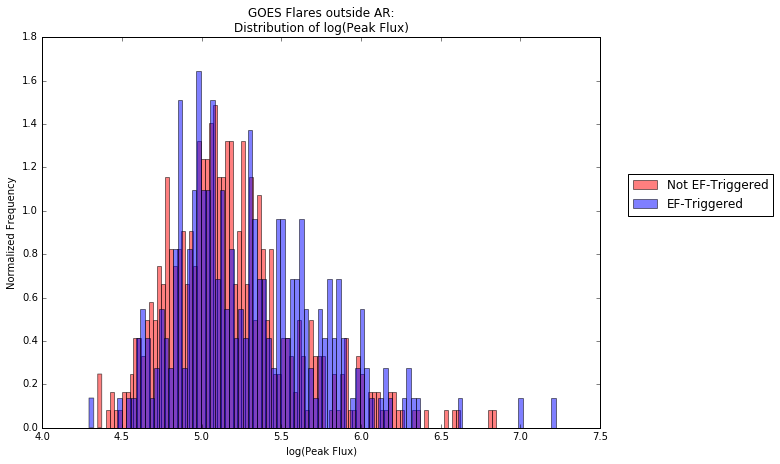

In [75]:
plt.figure(figsize = (10, 7))
plt.hist(np.log10(noef['adjusted_peak']), normed=True, bins=100, color='r', alpha=0.5, label = 'Not EF-Triggered')
_=plt.hist(np.log10(ef['adjusted_peak']), normed=True, bins=100, alpha=0.5, label = 'EF-Triggered')
plt.xlabel('log(Peak Flux)')
plt.ylabel('Normalized Frequency')
plt.title('GOES Flares outside AR:\nDistribution of log(Peak Flux)')
plt.legend(bbox_to_anchor=(1.05, .65), loc=2, borderaxespad=0.)
fNameSave = 'logpeakfluxdistribution.png' 
plt.savefig(fNameSave, bbox_inches = 'tight', pad_inches = 0.1)

In [222]:
numef = ef.shape[0]
numnoef = noef.shape[0]
print numef
print numnoef

570
1517


In [80]:
np.sqrt(814)

28.530685235374211

In [316]:
sigef = ef.ix[ef['is_sigmoid']==1]
signoef = noef.ix[noef['is_sigmoid']==1]
numsigef = sigef.shape[0]
numsignoef = signoef.shape[0]

In [317]:
pctsigef = numsigef/numef
pctsignoef = numsignoef/numnoef
print pctsigef -pctsignoef

0.00276630931316


In [315]:
aref = ef.ix[ef['is_ar']==1]
arnoef = noef.ix[noef['is_ar']==1]
numaref = aref.shape[0]
numarnoef = arnoef.shape[0]
print numaref/numef
print numarnoef/numnoef
print numaref/numef - numarnoef/numnoef

0.664912280702
0.624917600527
0.0399946801744


In [314]:
eref = ef.ix[ef['is_er']==1]
ernoef = noef.ix[noef['is_er']==1]
numeref = eref.shape[0]
numernoef = ernoef.shape[0]
print numeref/numef
print numernoef/numnoef
print numeref/numef - numernoef/numnoef

0.222807017544
0.146341463415
0.0764655541292


In [247]:
aref = ef.ix[ef['is_171']==1]
arnoef = noef.ix[noef['is_171']==1]
numaref = aref.shape[0]
numarnoef = arnoef.shape[0]
print numaref/numef
print numarnoef/numnoef
print numaref/numef - numarnoef/numnoef

0.843859649123
0.812788398154
0.0310712509686


In [226]:
def find_pct_diff(category):
    aref = ef.ix[ef[category]==1]
    arnoef = noef.ix[noef[category]==1]
    numaref = aref.shape[0]
    numarnoef = arnoef.shape[0]
    print numaref/numef
    print numarnoef/numnoef
    print numaref/numef - numarnoef/numnoef

In [227]:
find_pct_diff('is_171')

0.578947368421
0.531311799604
0.0476355688166


In [228]:
find_pct_diff('is_131')

0.749122807018
0.757415952538
-0.00829314552036


In [229]:
find_pct_diff('is_193')

0.487719298246
0.473302570864
0.0144167273821


In [230]:
find_pct_diff('is_211')

0.498245614035
0.491100856955
0.00714475708057


In [231]:
find_pct_diff('is_304')

0.29649122807
0.280158206987
0.0163330210827


In [232]:
find_pct_diff('is_335')

0.2
0.188529993408
0.011470006592


In [233]:
find_pct_diff('is_94')

0.243859649123
0.227422544496
0.0164371046271


In [234]:
def find_pct_diff(num):
    aref = ef.ix[ef['bcomplexity']==num]
    arnoef = noef.ix[noef['bcomplexity']==num]
    numaref = aref.shape[0]
    numarnoef = arnoef.shape[0]
    print numaref/numef
    print numarnoef/numnoef
    print numaref/numef - numarnoef/numnoef

In [235]:
find_pct_diff(2)

KeyError: 'bcomplexity'

In [ ]:
def eliminate_noise_graph(t, x, nu):
    x = np.array(x)
    foTran = np.fft.fft(x)
    for i in range(len(foTran)):  
        if i>nu:
            foTran[i]=0
    ifoTran = np.fft.ifft(foTran)
#     plt.figure(figsize = (10, 7))
#     plt.plot(t, ifoTran, color = 'blue', marker = 'o')
#     plt.plot(t, x, 'r', marker = 'o')
#     plt.show()
    return foTran, ifoTran

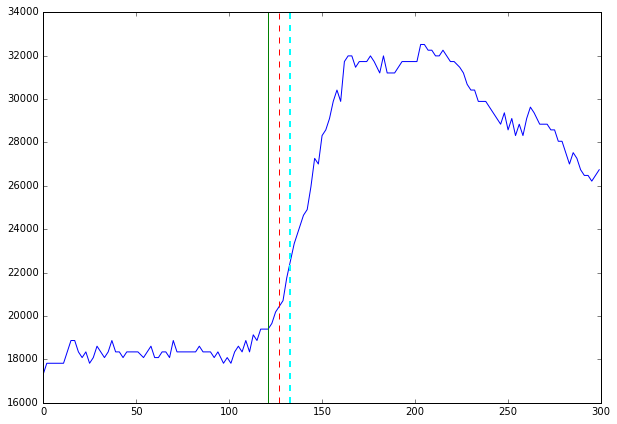

------------


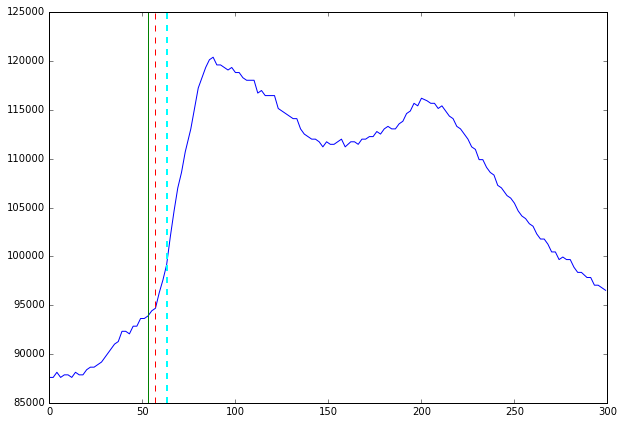

------------


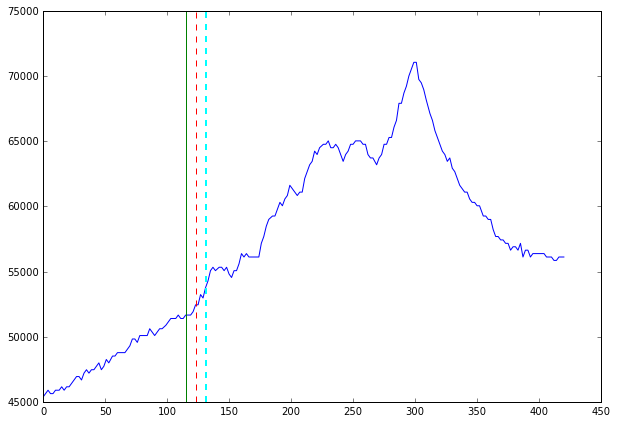

------------


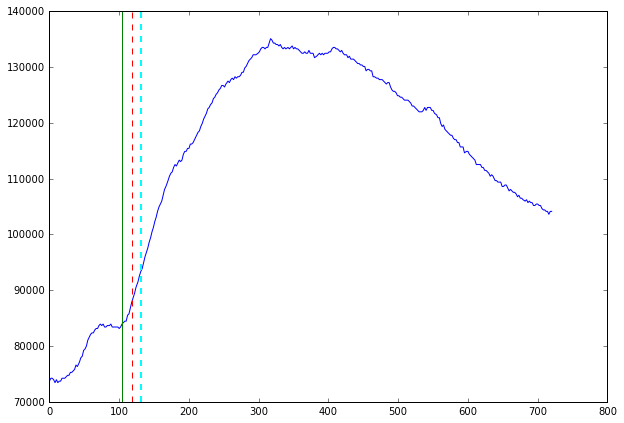

------------


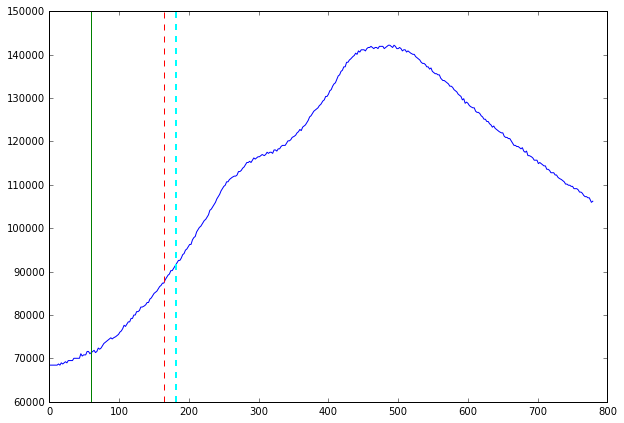

------------


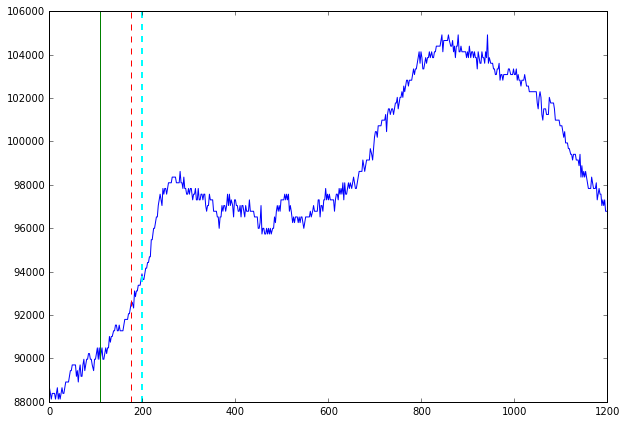

------------


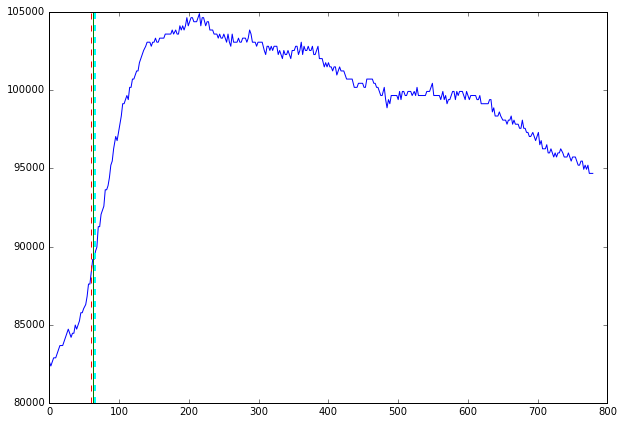

------------


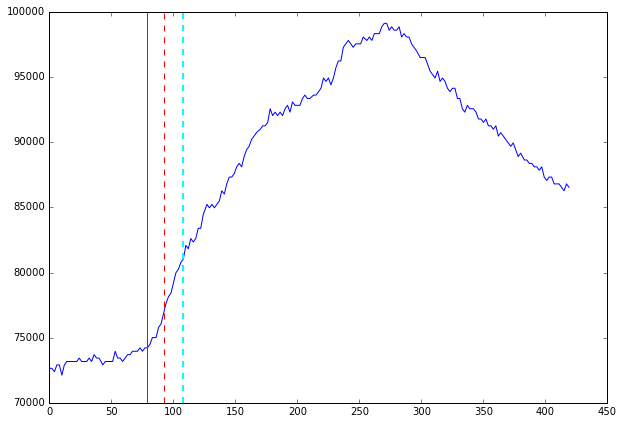

------------


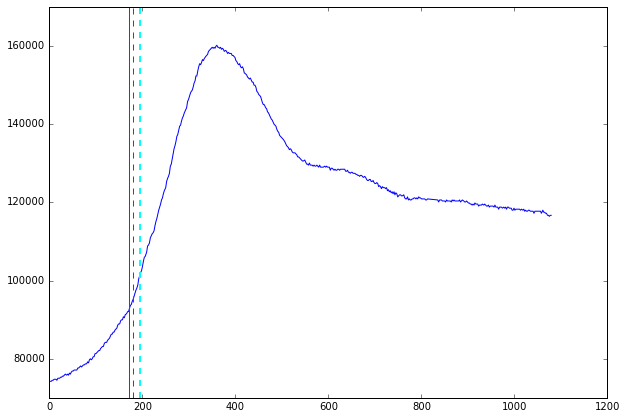

------------


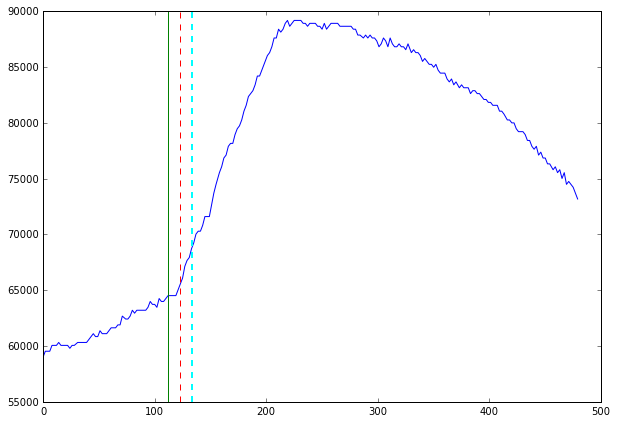

------------


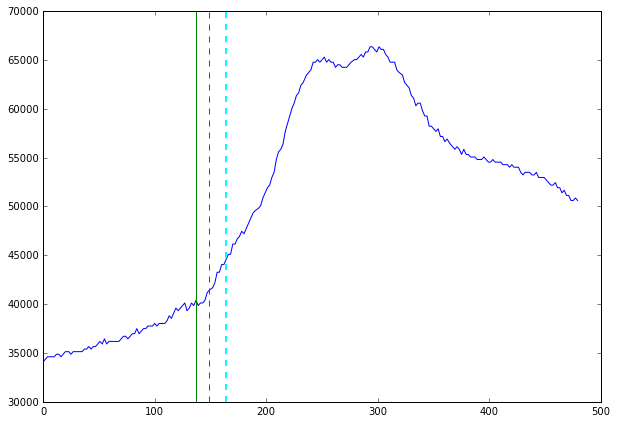

------------


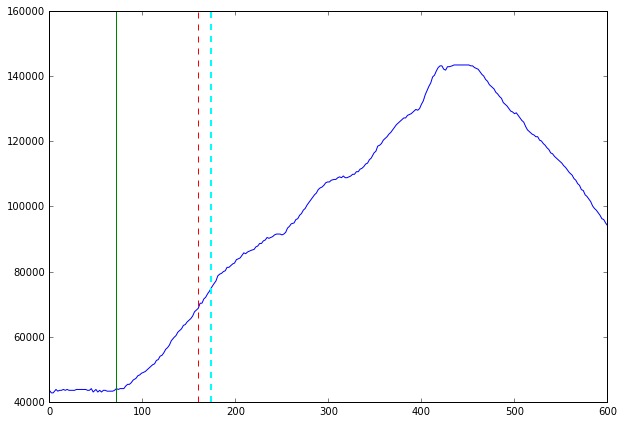

------------


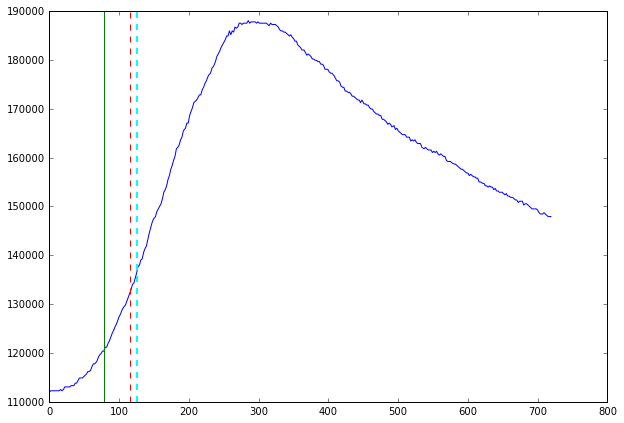

------------


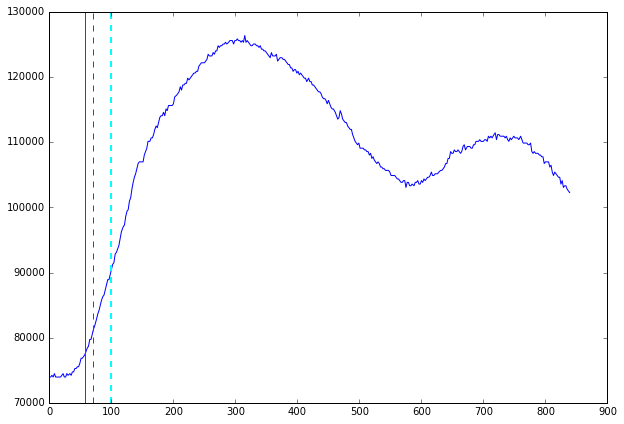

------------


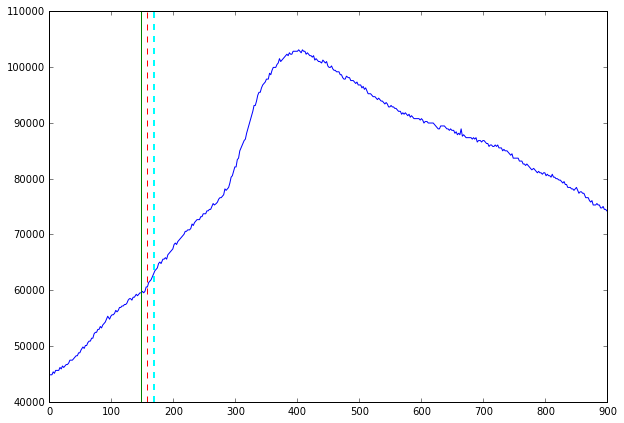

------------


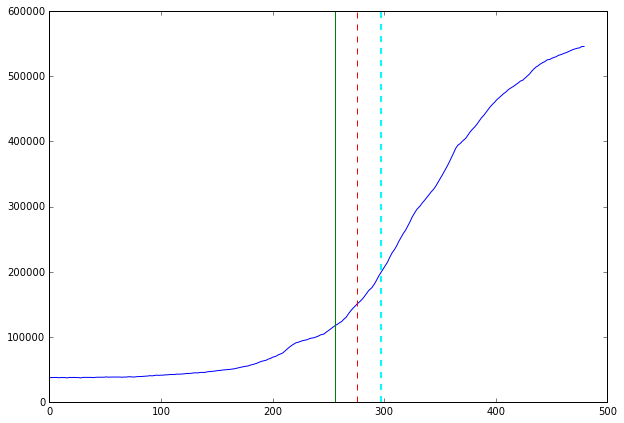

------------


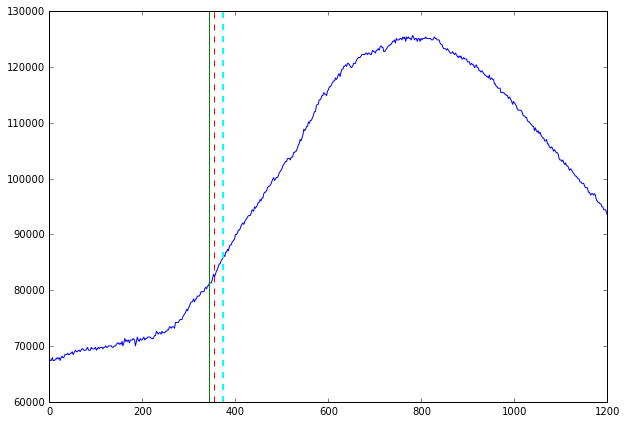

------------


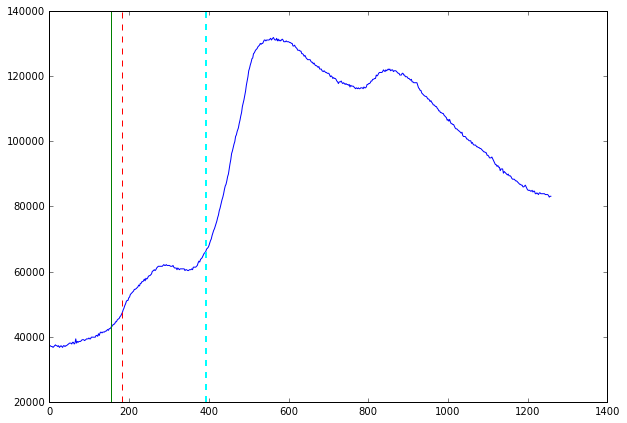

------------


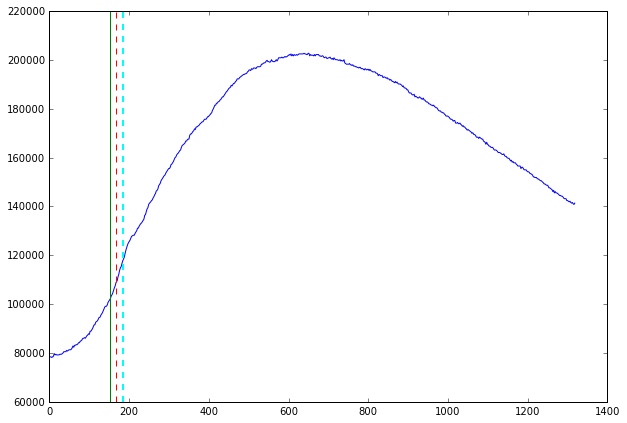

------------


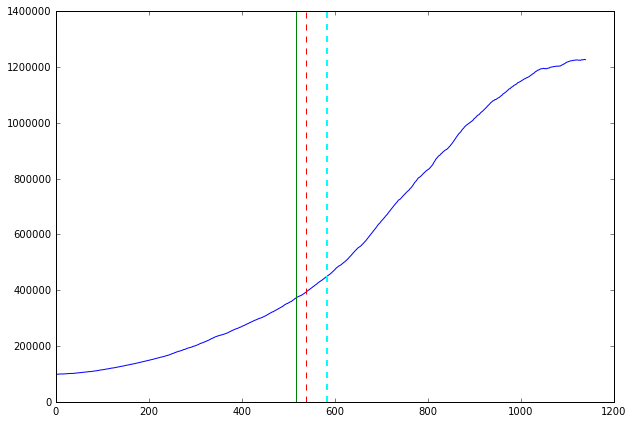

------------


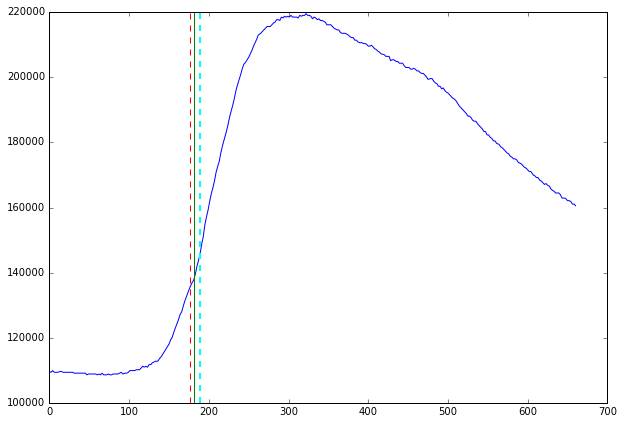

------------


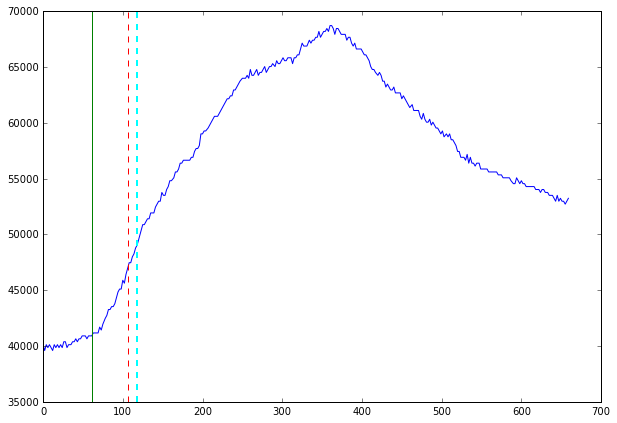

------------


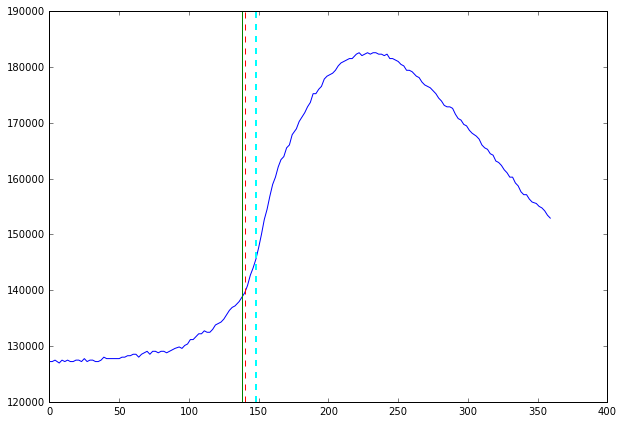

------------


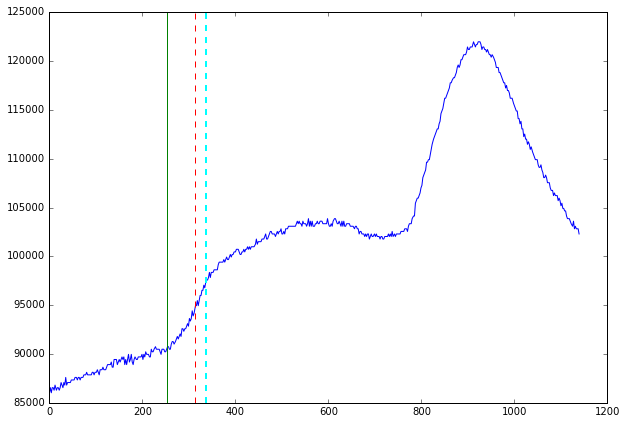

------------


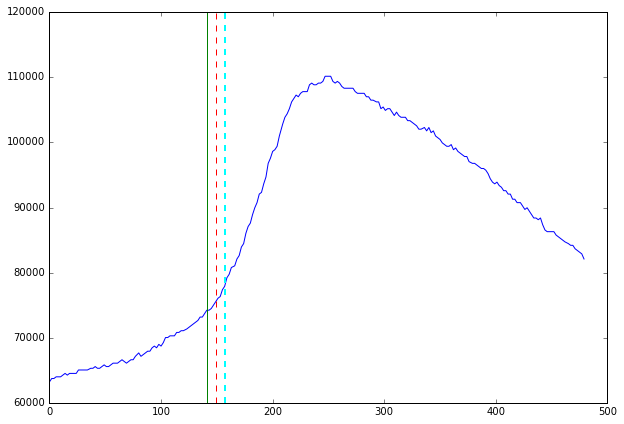

------------


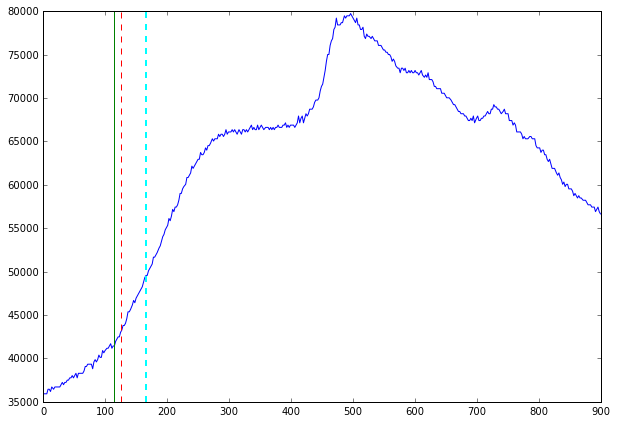

------------


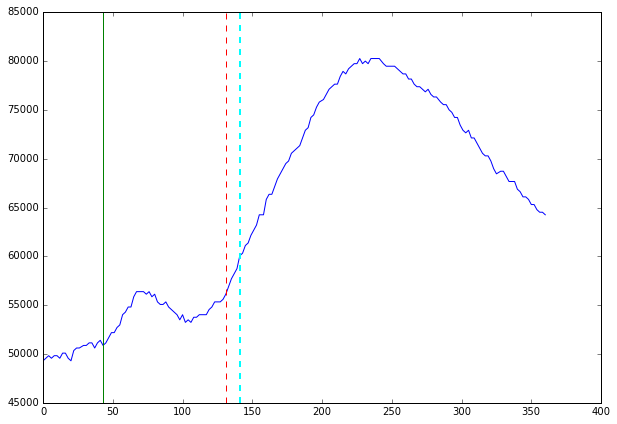

------------


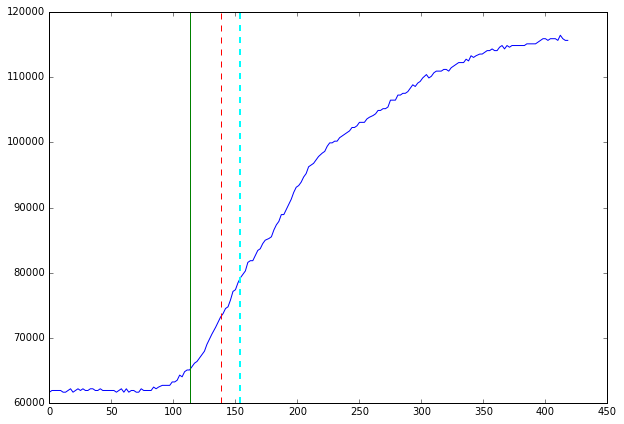

------------


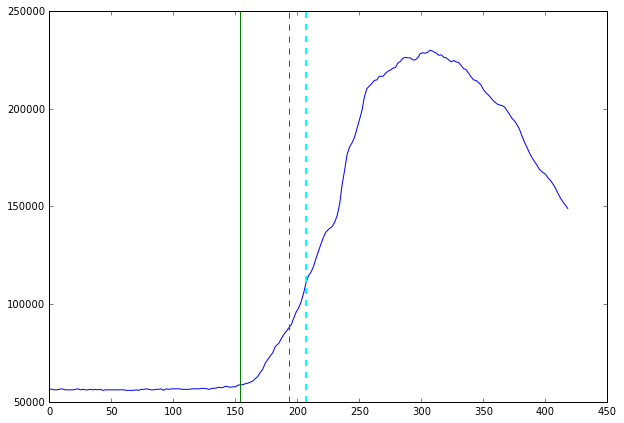

------------


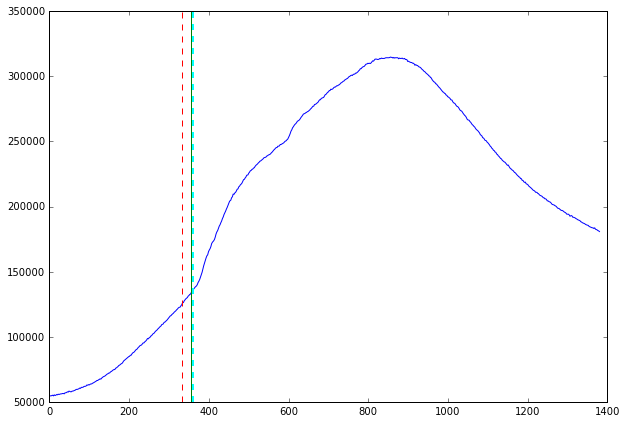

------------


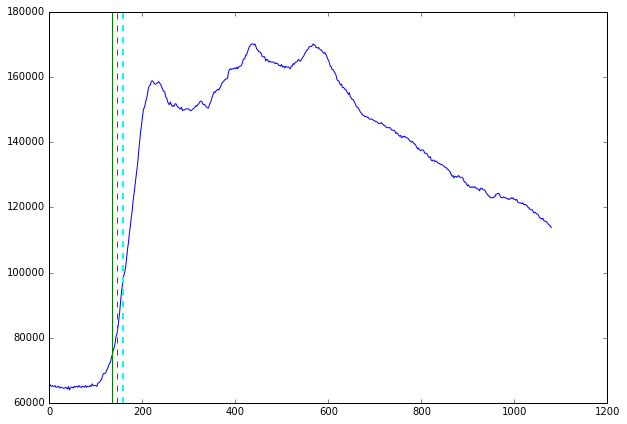

------------


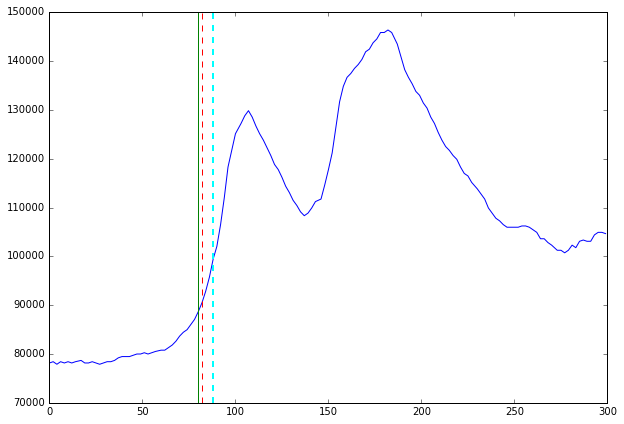

------------


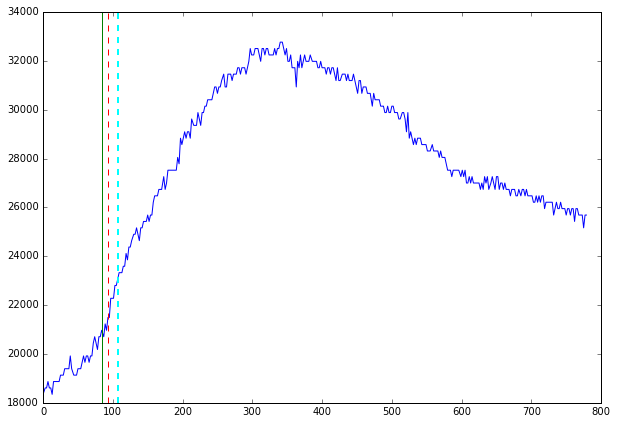

------------


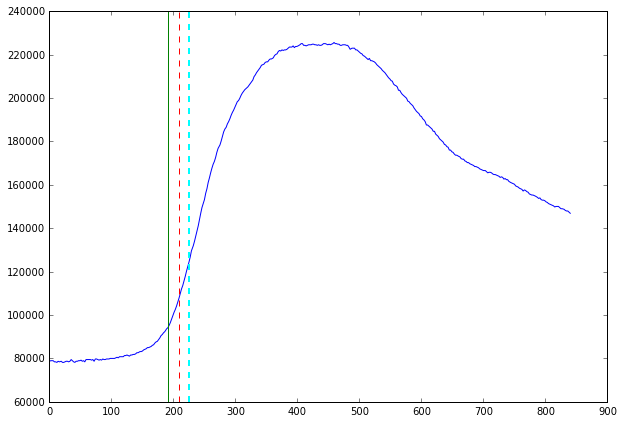

------------


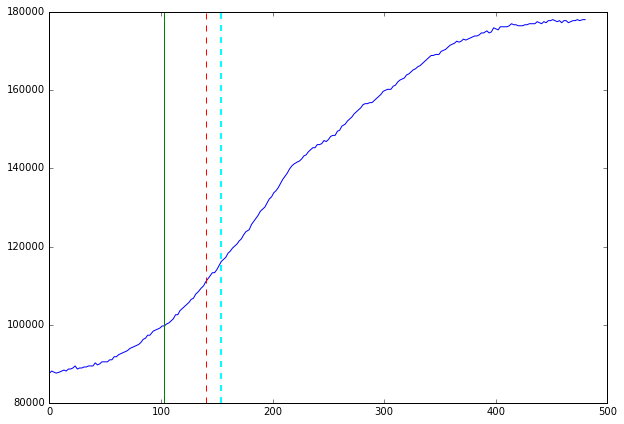

------------


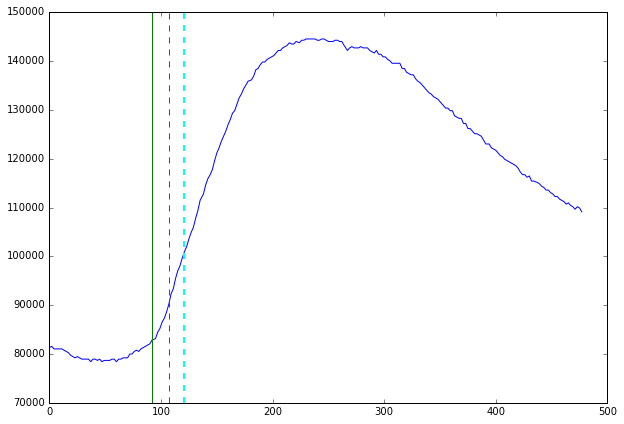

------------


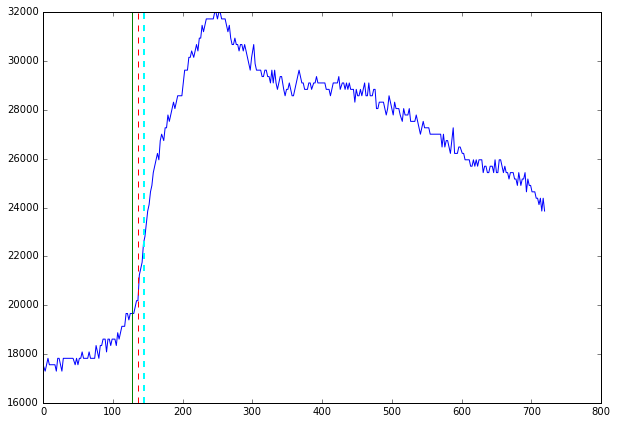

------------


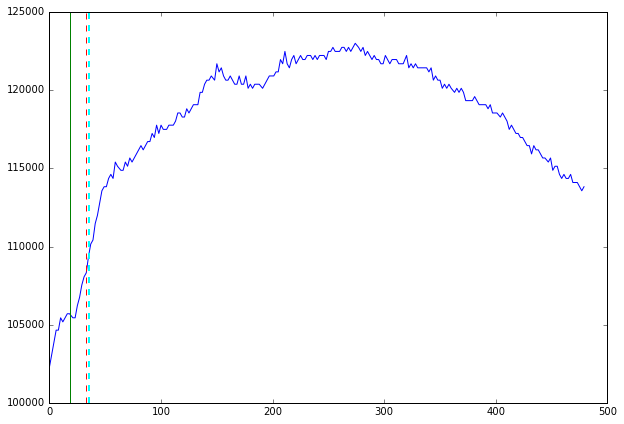

------------


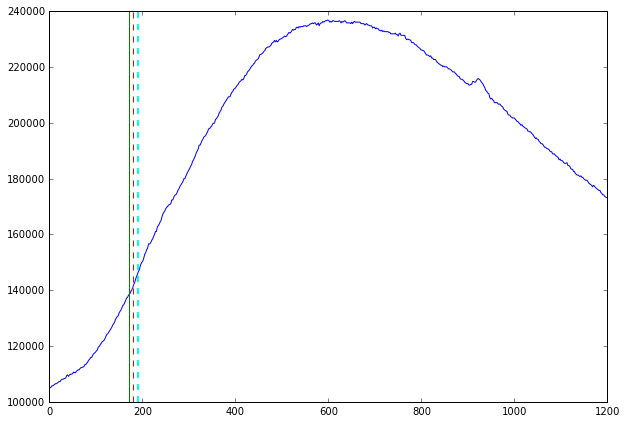

------------


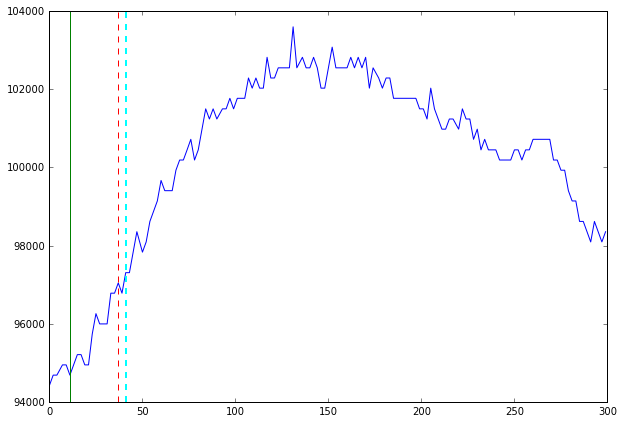

------------


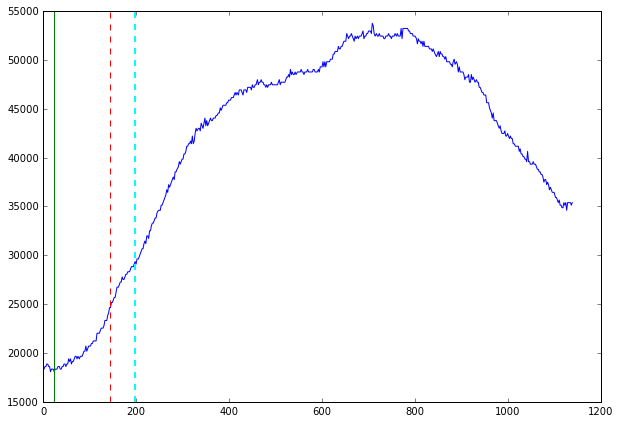

------------


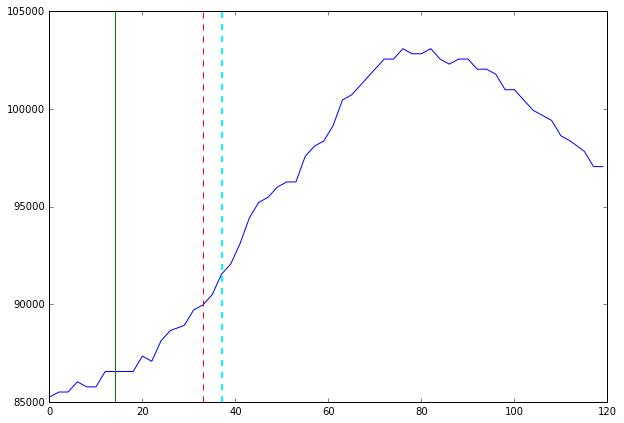

------------


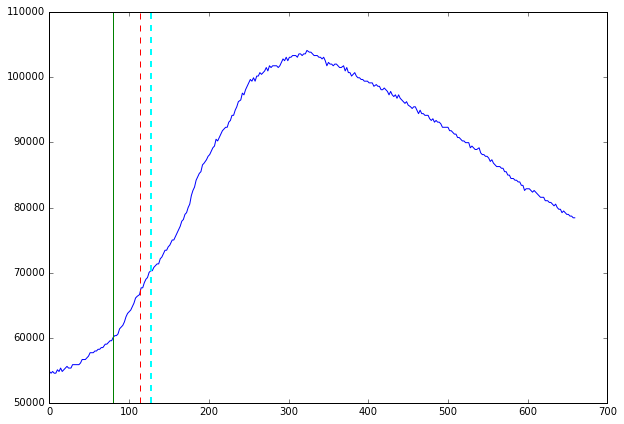

------------


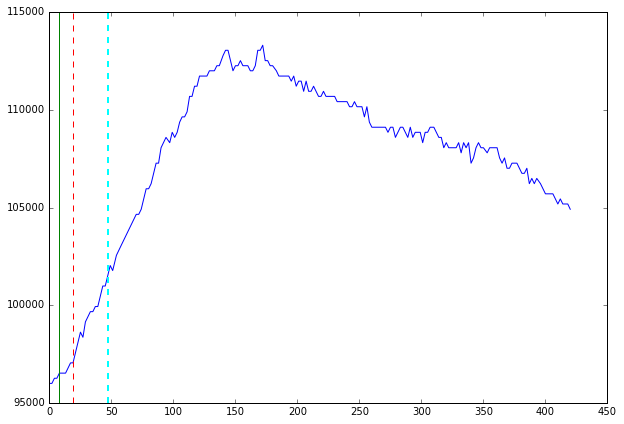

------------


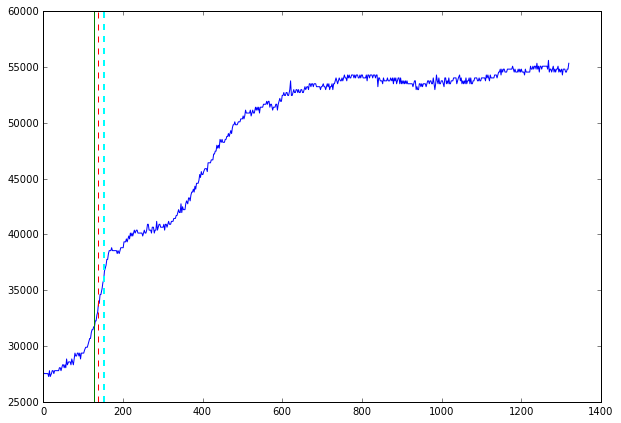

------------


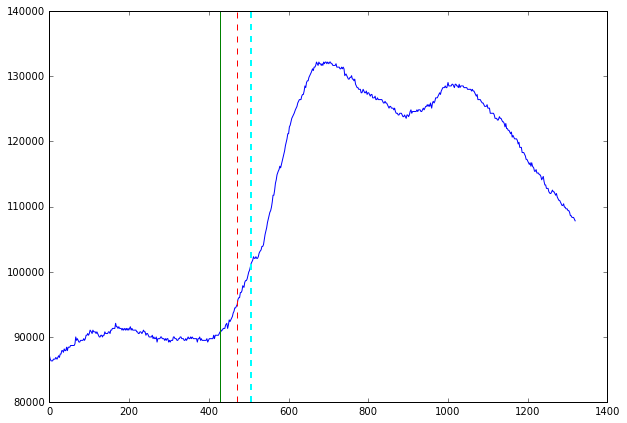

------------


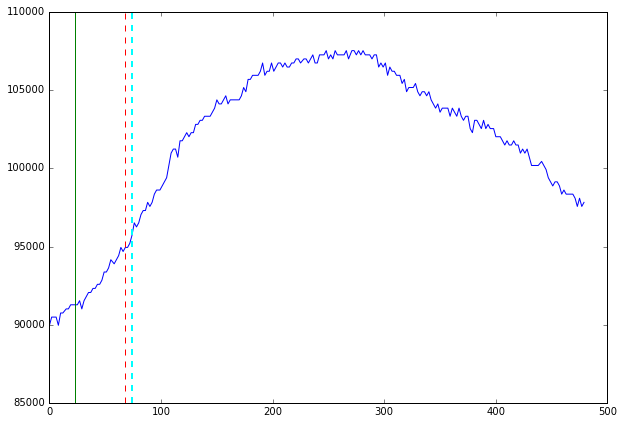

------------


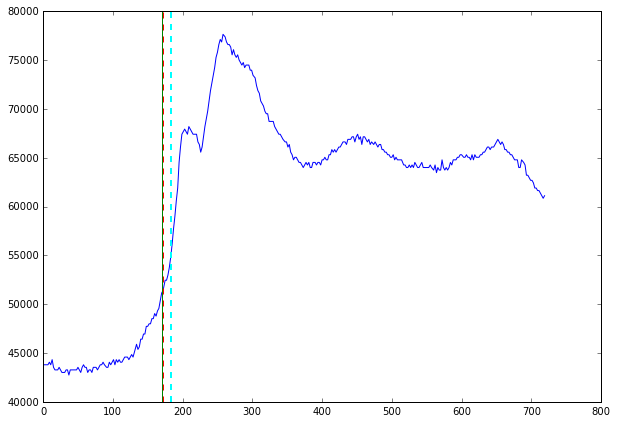

------------


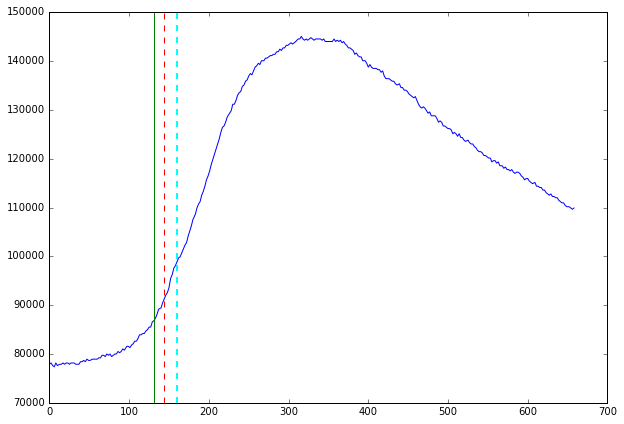

------------


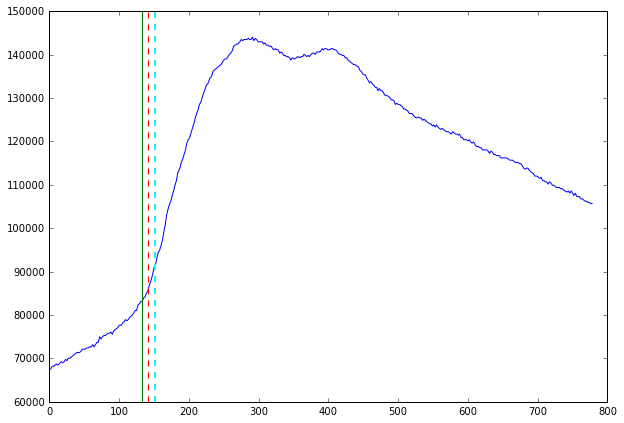

------------


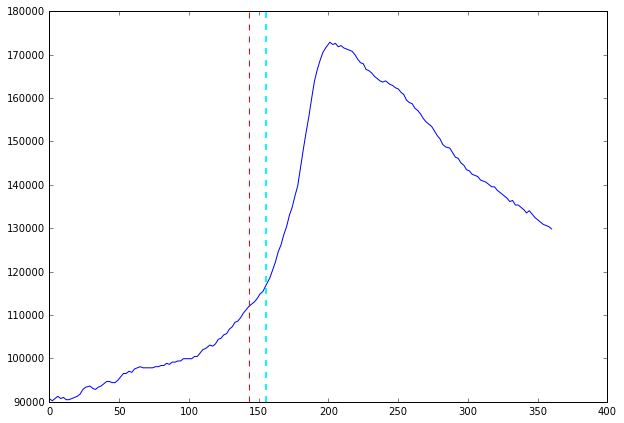

------------


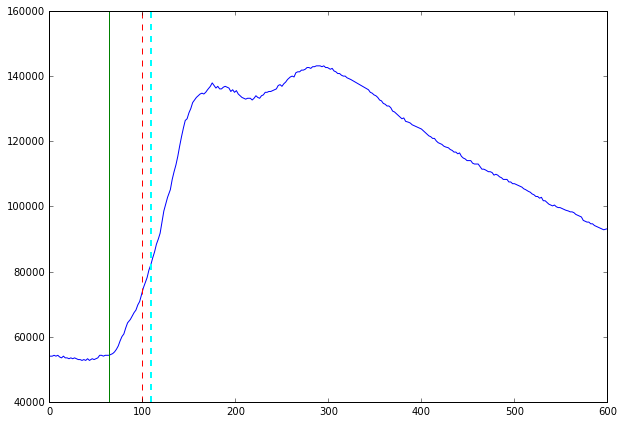

------------


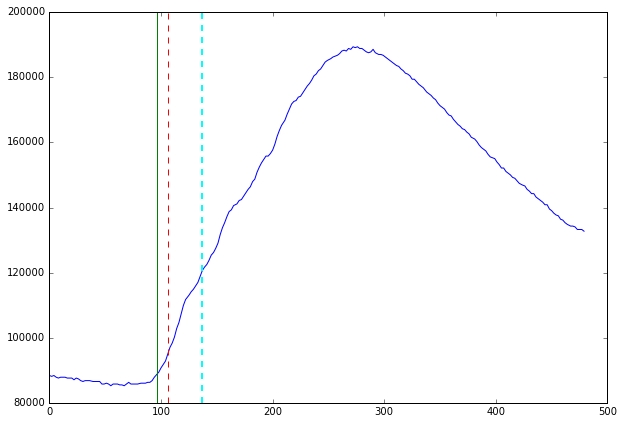

------------


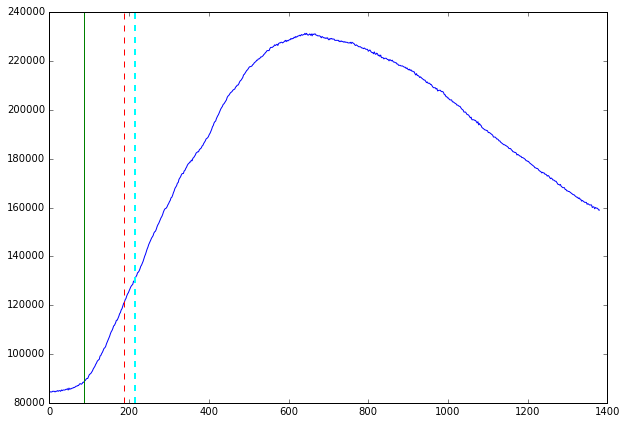

------------


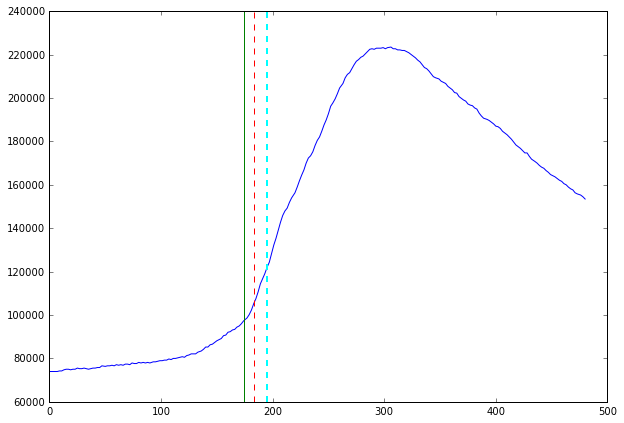

------------


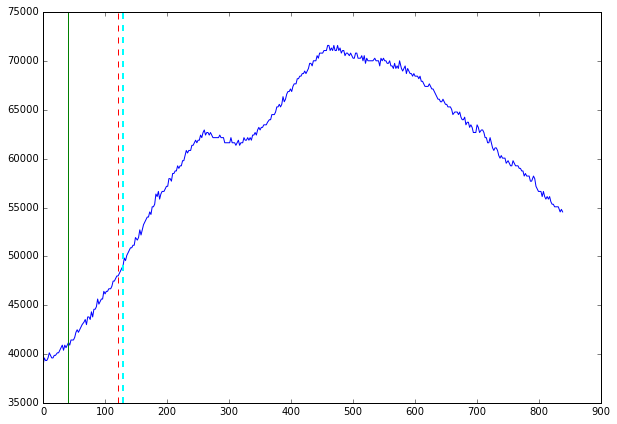

------------


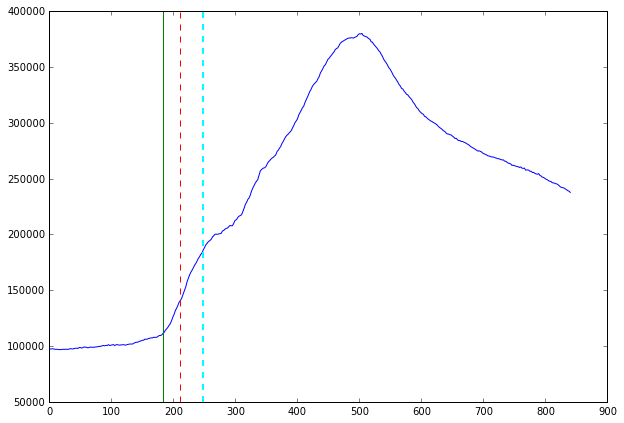

------------


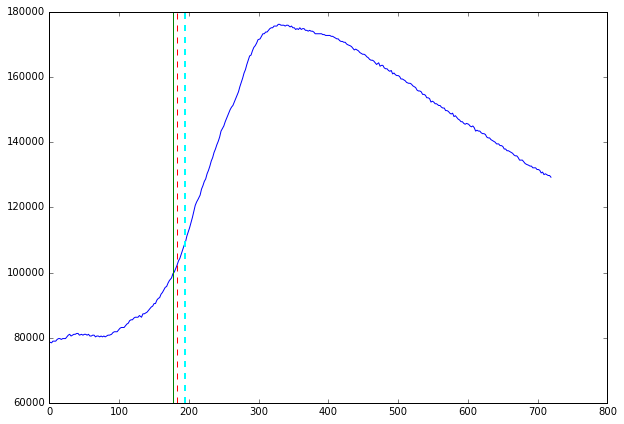

------------


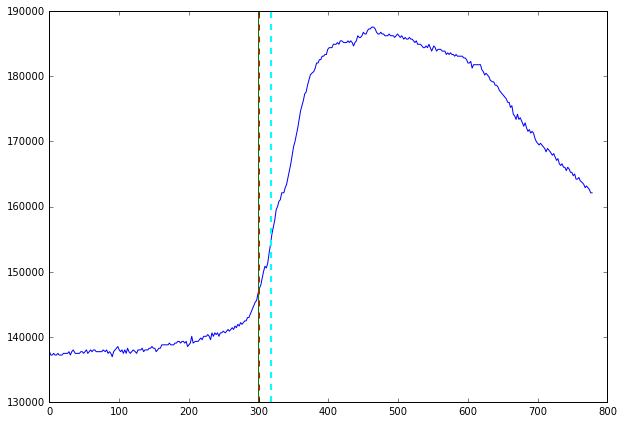

------------


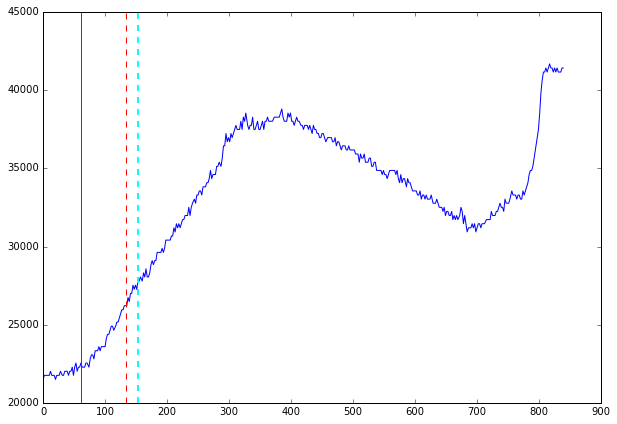

------------


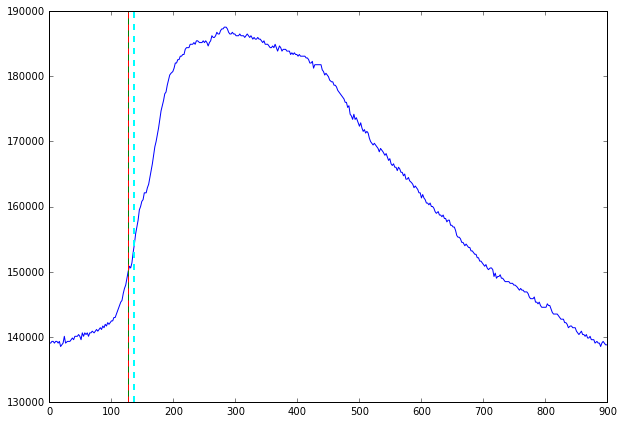

------------


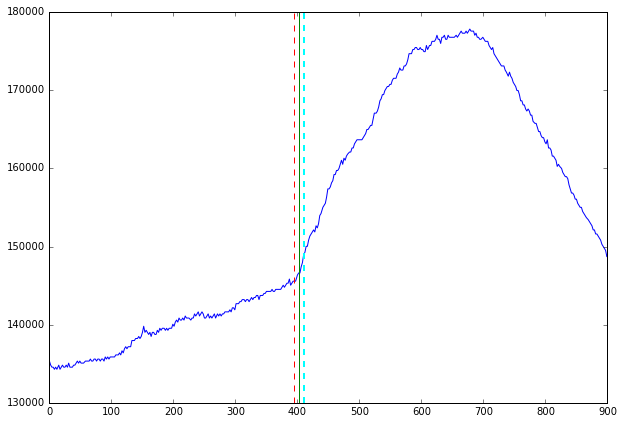

------------


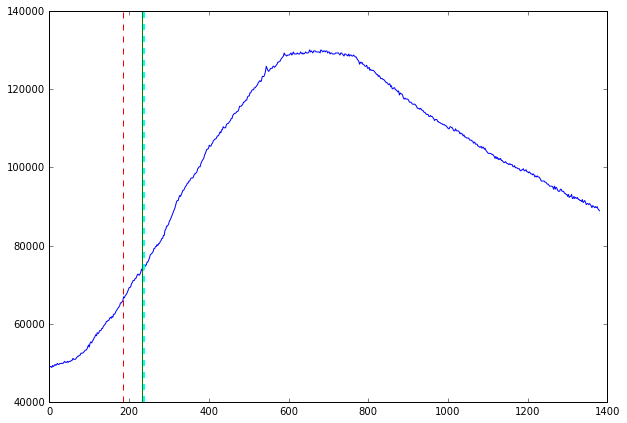

------------


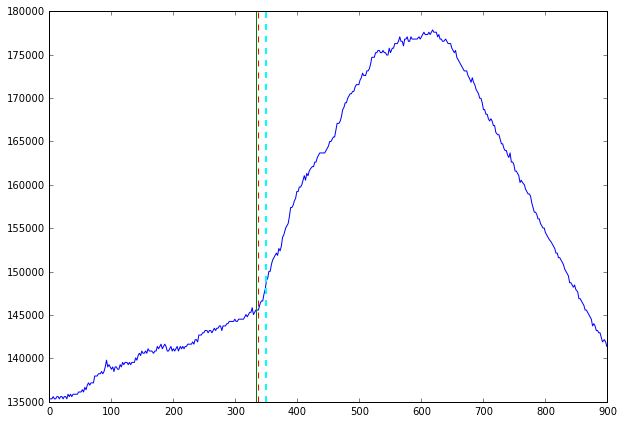

------------


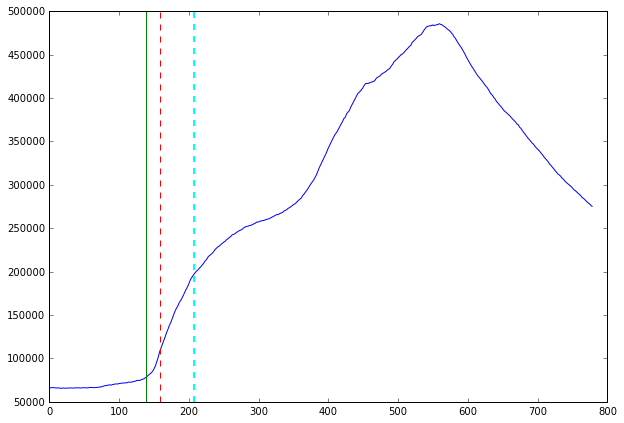

------------


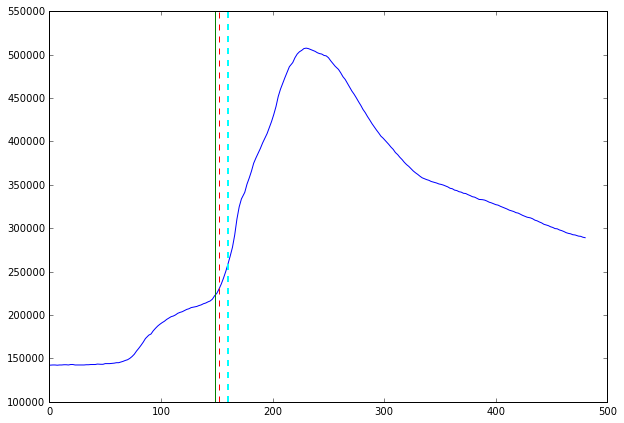

------------


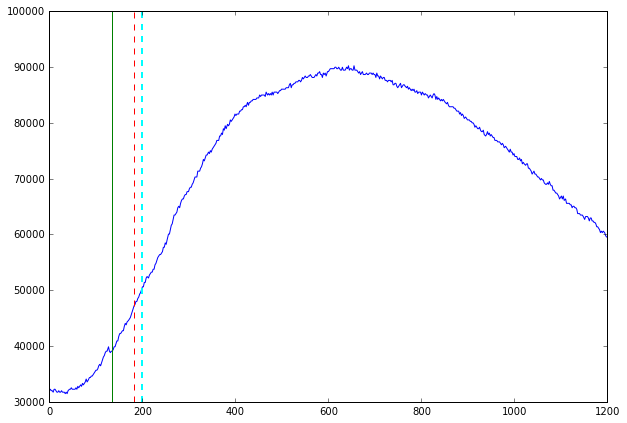

------------


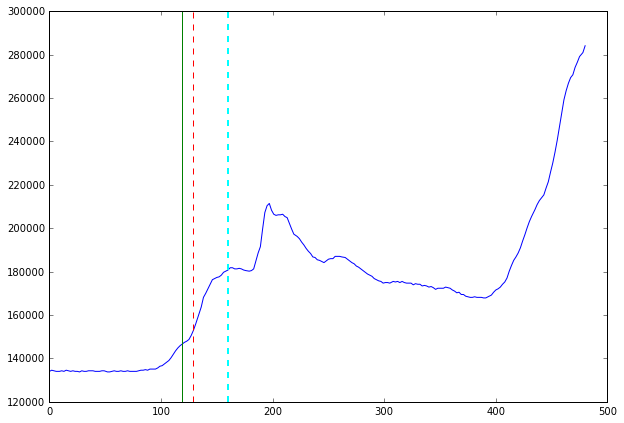

------------


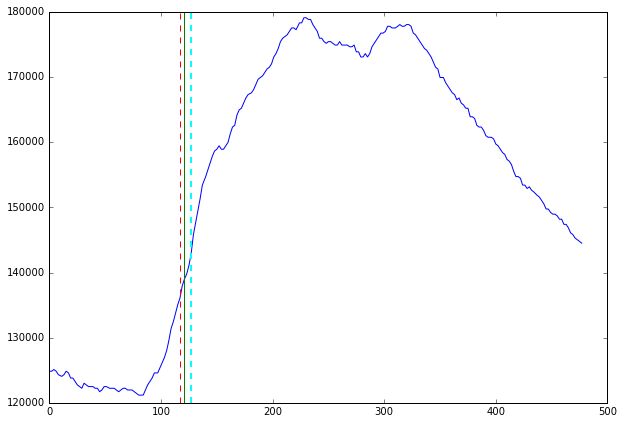

------------


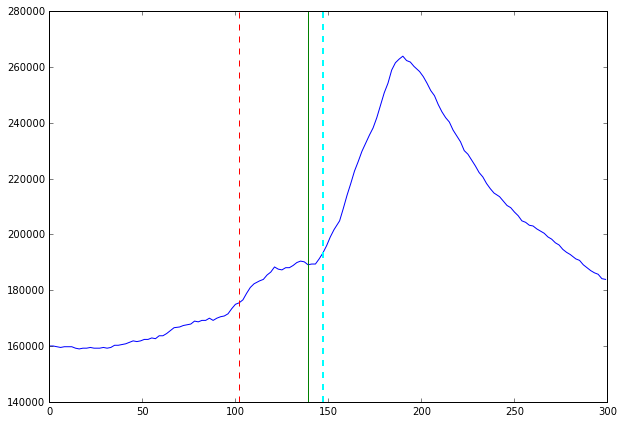

------------


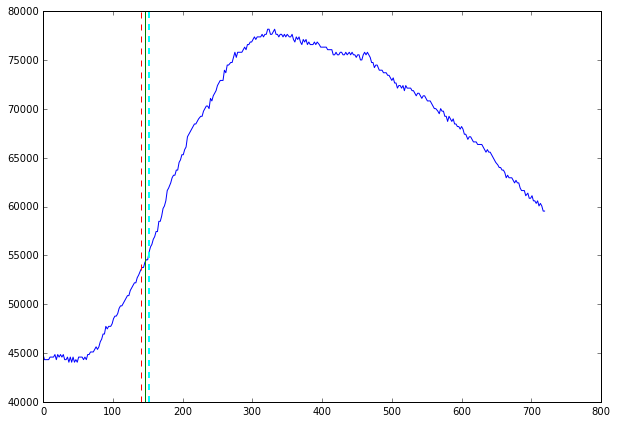

------------


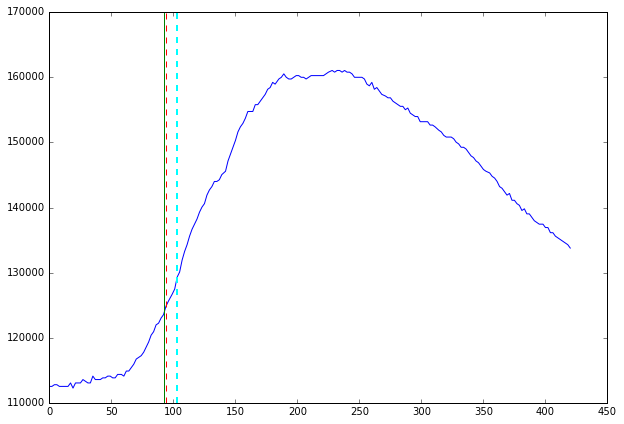

------------


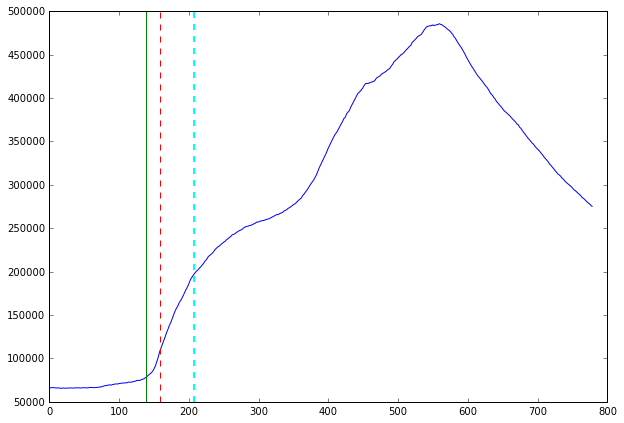

------------


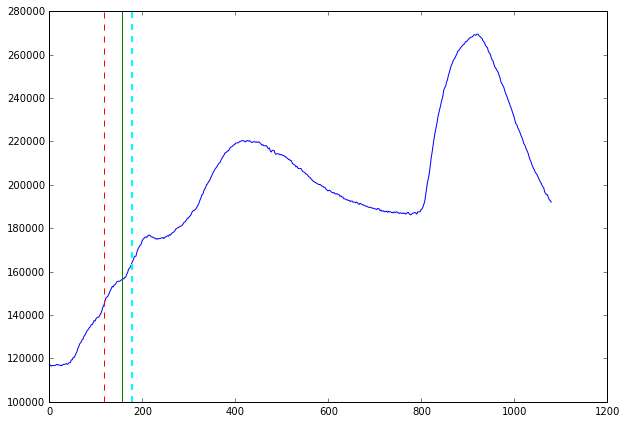

------------


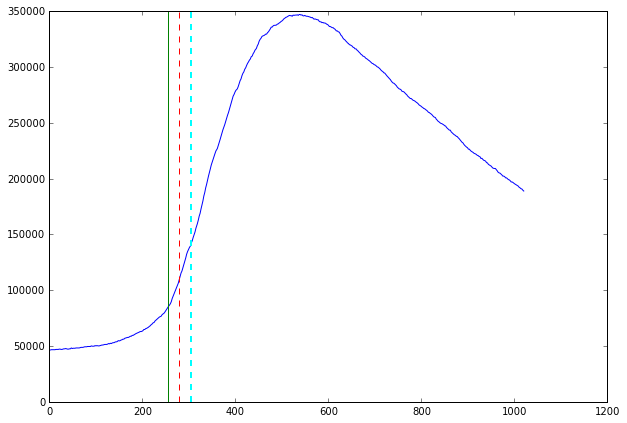

------------


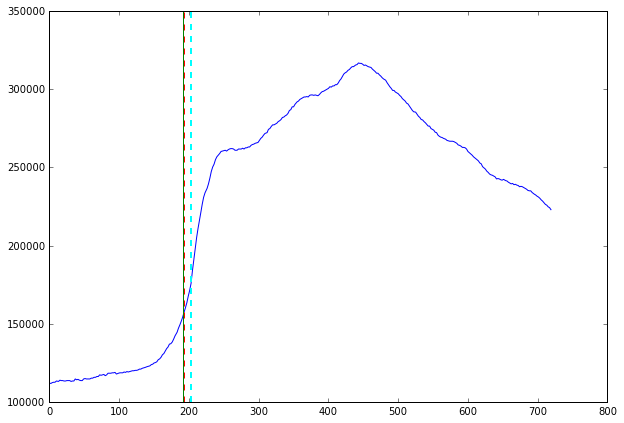

------------


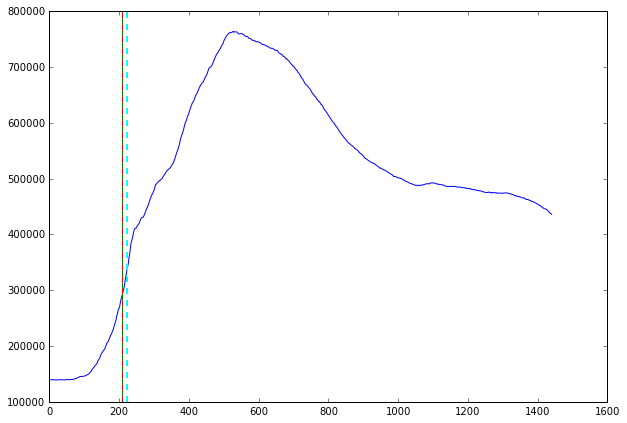

------------


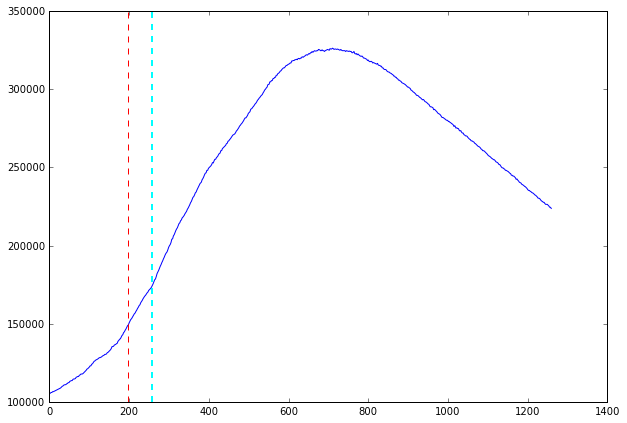

------------


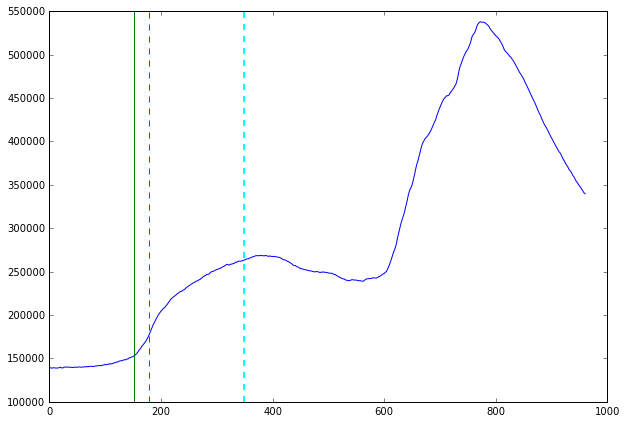

------------


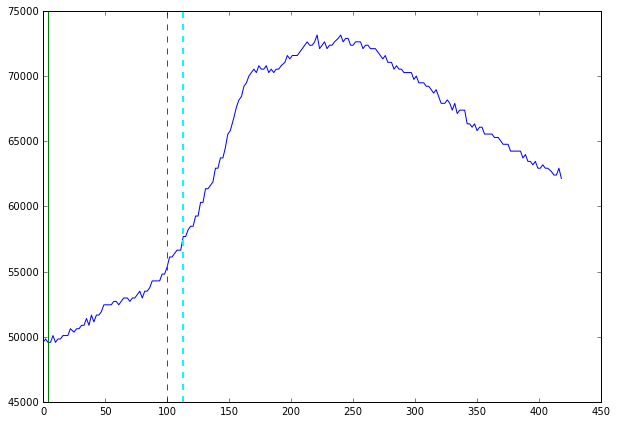

------------


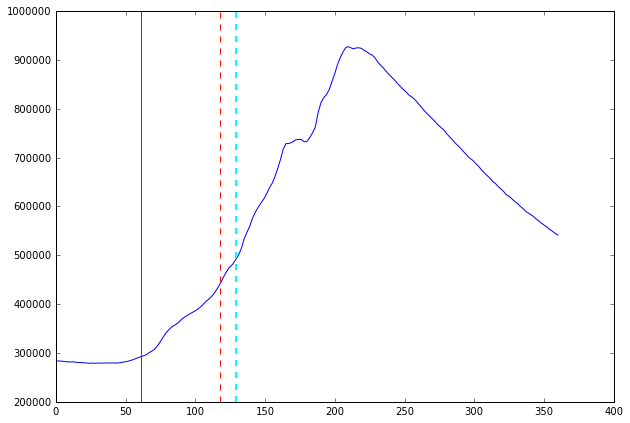

------------


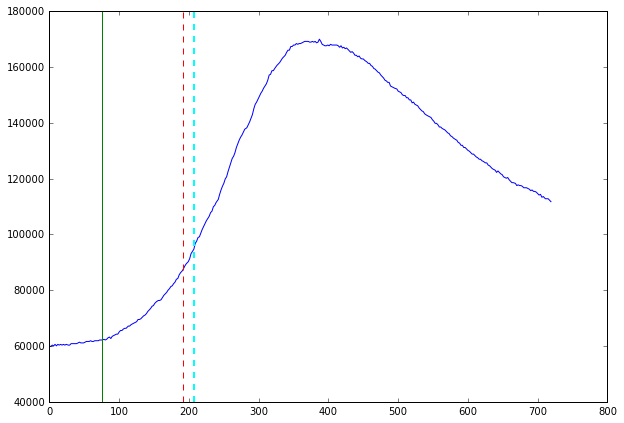

------------


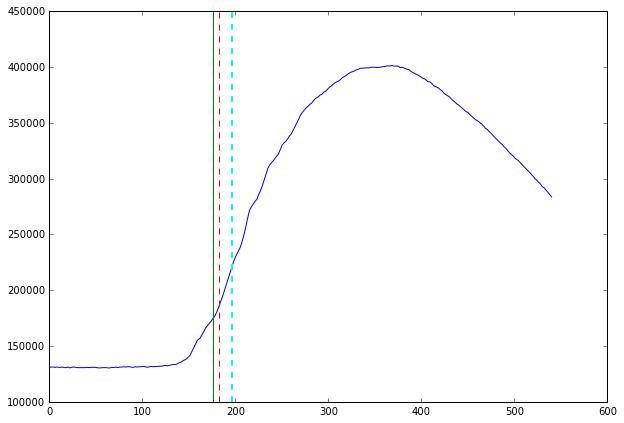

------------


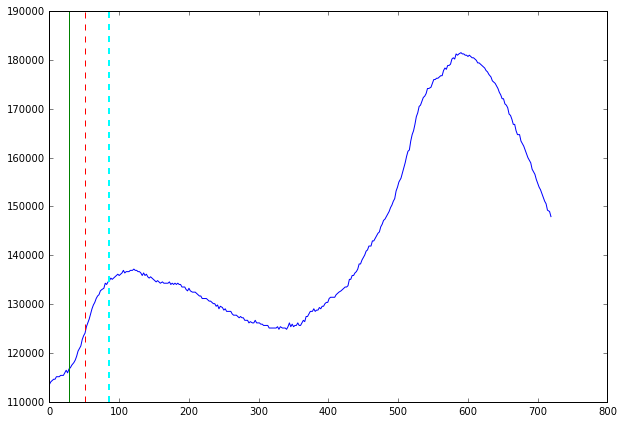

------------


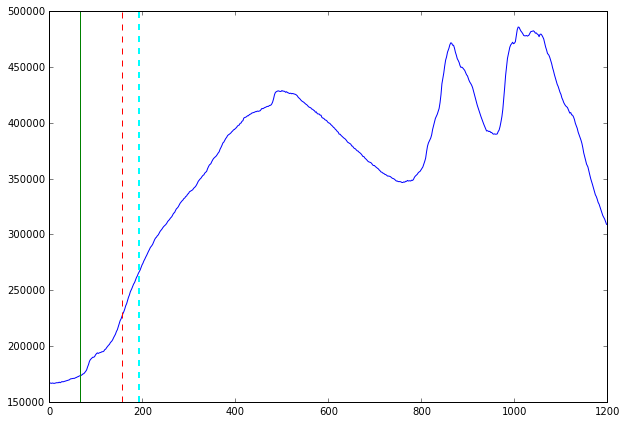

------------


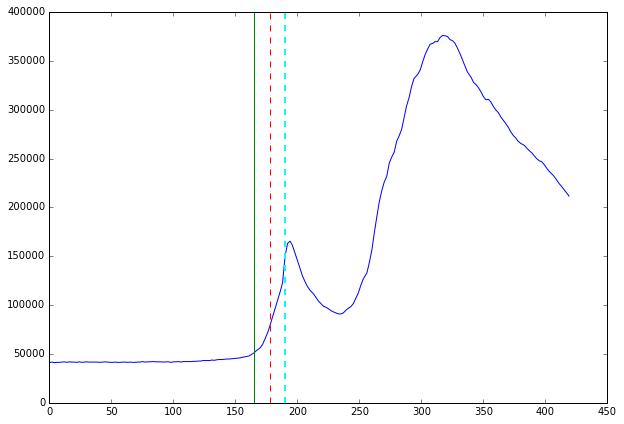

------------


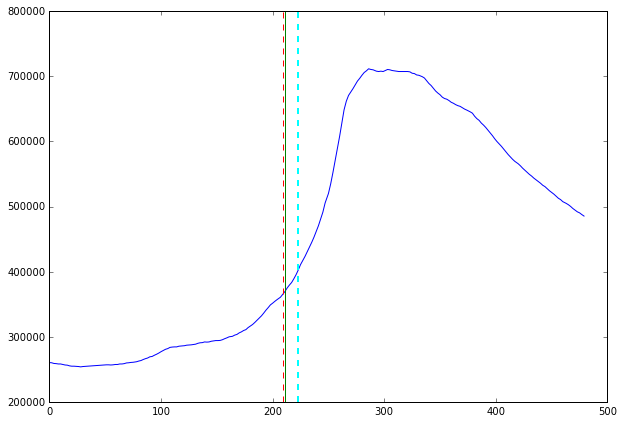

------------


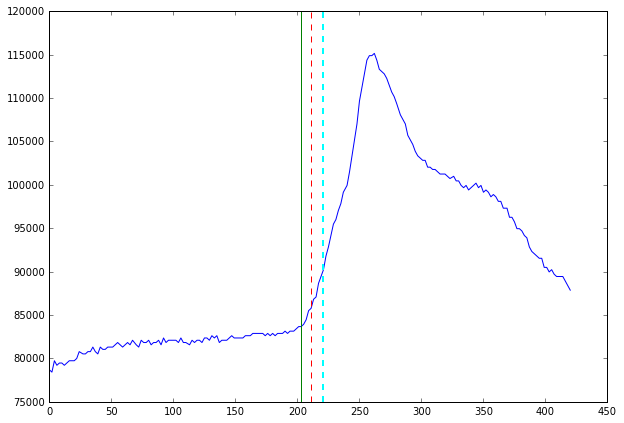

------------


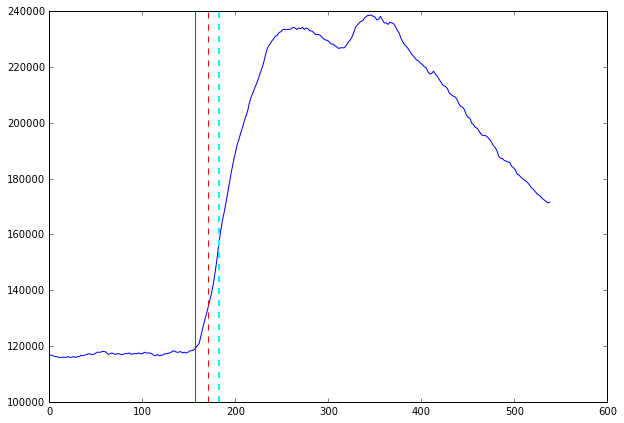

------------


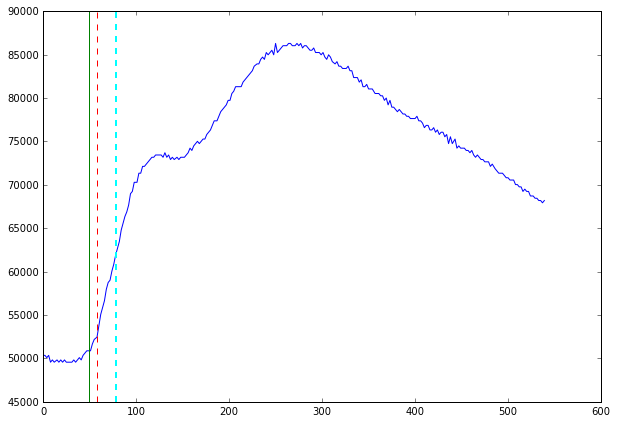

------------


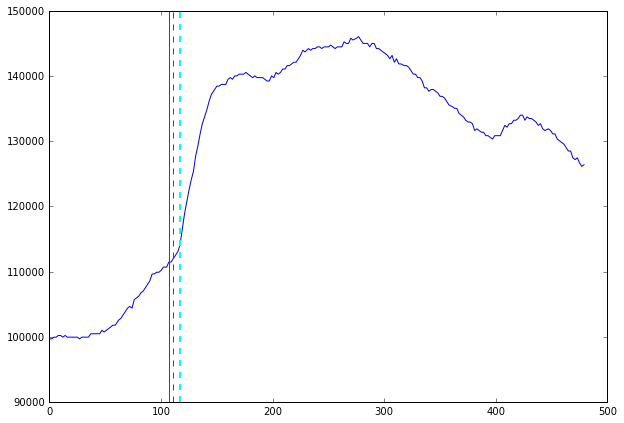

------------


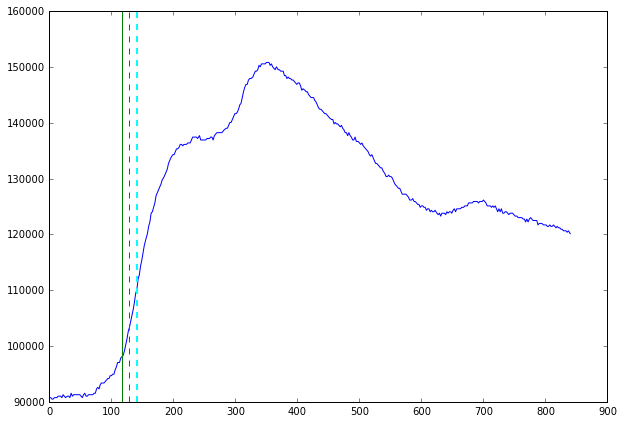

------------


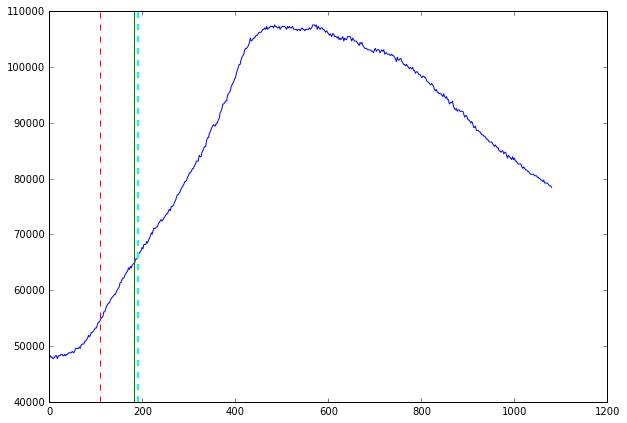

------------


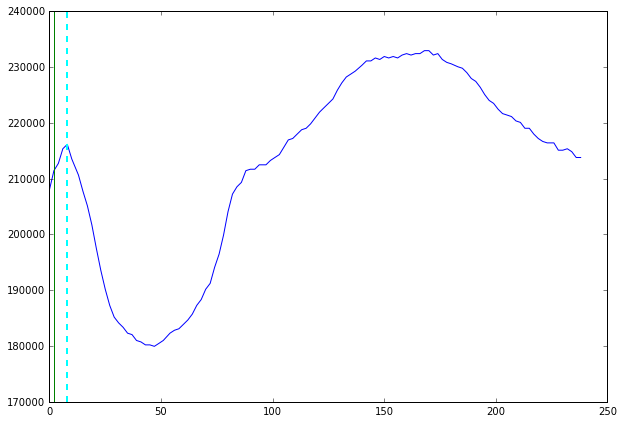

------------


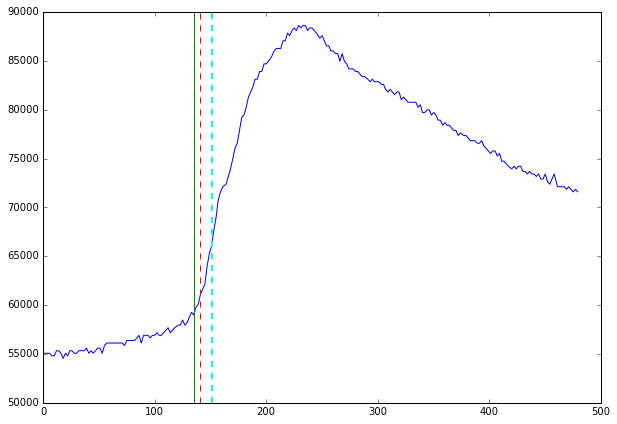

------------


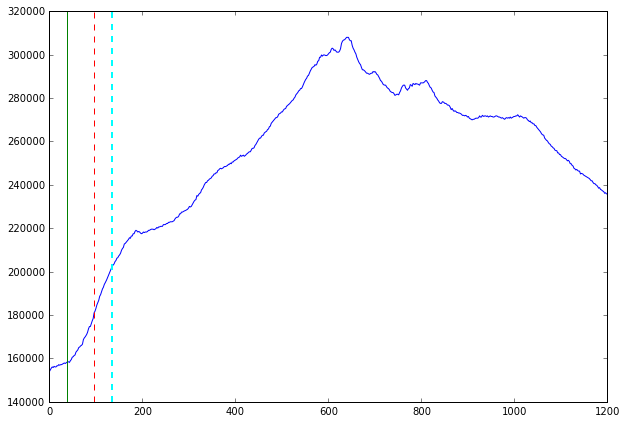

------------


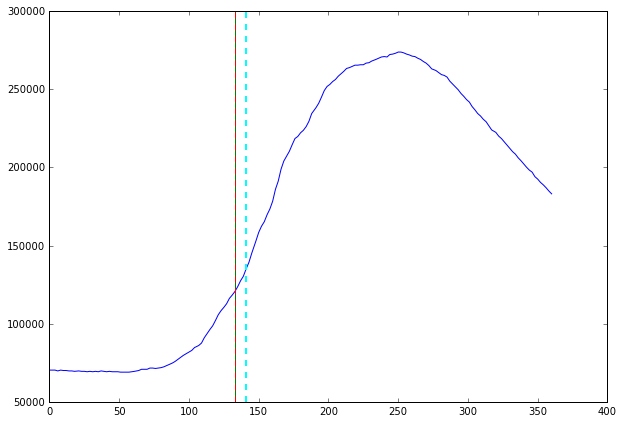

------------


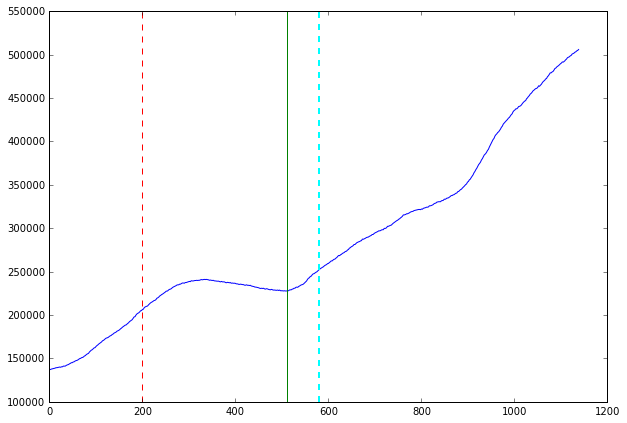

------------


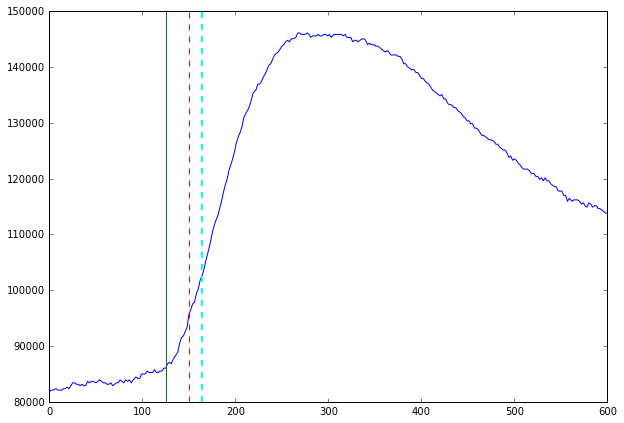

------------


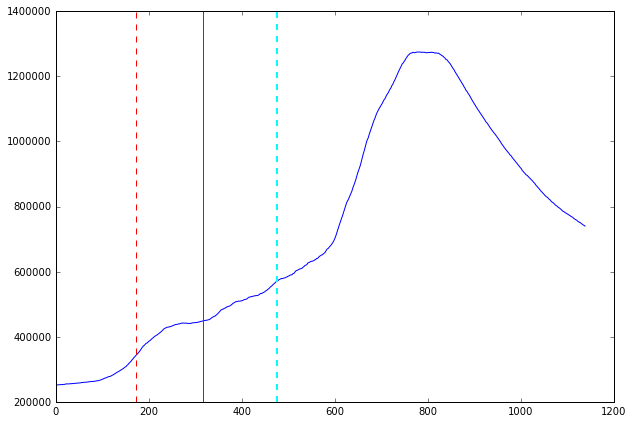

------------


In [132]:
pctsss=[]
j=0
for root, dirs, files in os.walk('sklearn_goes_all_lc'):
    for f in files:
        if f[0] != '.':
            if j<100:
                inputFile = 'sklearn_goes_all_lc' +'/'+f
                lc = pd.read_csv(inputFile, delimiter = ',', header=0)
                lc['xrsb'] = lc['xrsb']*10**11
                lc['date'] = map(parse_time, lc['date'])
                minutesX = ((lc['date'] - lc['date'].values[0])*10**(-9))
                minutesX = map(lambda x: x/np.timedelta64(1, 'ns'), minutesX)
                minutesXog = minutesX
                duration = minutesX[-1]
                maxi = np.argmax(np.array(lc['xrsb'])) 
                softx = lc['xrsb'].values[0:maxi+1]
                if len(softx)>7:
                    minutesX = minutesX[0:maxi+1]
                    searchzone=True
                    endsearchidx = maxi
                    for k, x in enumerate(softx):
                        if searchzone:
                            if (x-softx[0])/(softx[-1]-softx[0]) > 0.31053736899:
                                searchzone=False
                                endsearchidx = k
                    softx = softx[:endsearchidx+6]           
                    minutesX = minutesX[0:endsearchidx+6]
                


    #                 i=0
    #                 der_fft = []
    #                 for time in minutesX[:-6]:
    #                     delta_t = minutesX[i+5]-time
    #                     delta_flux = ifoTran_f[i+5]-ifoTran_f[i]
    #                     derivative = delta_flux/delta_t
    #                     der_fft.append(derivative)
    #                     i+=1
    #                 der2s_fft = []
    #                 i = 0
    #                 for time in minutesX[:-7]:
    #                     delta_t = minutesX[i+5]-time
    #                     delta_flux = der_fft[i+1]-der_fft[i]
    #                     derivative = delta_flux/delta_t
    #                     der2s_fft.append(derivative)
    #                     i+=1
                    i=0
                    derivatives = []
                    for time in minutesX[:-6]:
                        delta_t = minutesX[i+5]-time
                        delta_flux = softx[i+5]-softx[i]
                        derivative = delta_flux/delta_t
                        derivatives.append(derivative)
                        i+=1
                    der2s = []
                    i=0
                    for time in minutesX[:-7]:
                        delta_t = minutesX[i+5]-time
                        delta_der = derivatives[i+1]-derivatives[i]
                        der2 = delta_der/delta_t
                        der2s.append(der2)
                        i+=1
#                     maxidx = np.argmax(np.array(der2s))  
    #                 maxidx3 = np.argmax(np.array(der2s_fft))  
    #                 maxidx4 = np.argmax(np.array(der_fft)) 
                    foTran, ifoTran = eliminate_noise_graph(minutesX[:-6], derivatives, 5)
#                     foTran2, ifoTran2 = eliminate_noise_graph(minutesX[:-7], der2s, 7.5)
#                     foTran3, ifoTran3 = eliminate_noise_graph(minutesX[:-7], der2s, 15)
                    foTran4, ifoTran4 = eliminate_noise_graph(minutesX[:-7], der2s, 5)
#                     secdfft = f(minutesX)
#                     maxidx2 = np.argmax(np.array(ifoTran2))  
#                     maxidx3 = np.argmax(np.array(ifoTran3)) 
                    maxidx4 = np.argmax(np.array(ifoTran4)) 
#                     maxidx4a = np.argmax(np.array(ifoTran))
    #                 plt.figure(figsize = (10, 7))
    #                 plt.plot(minutesX[:-7], derivatives[:-1])
    #                 plt.axvline(minutesX[maxidx2], lw=3)
    #                 plt.axvline(minutesX[maxidx3], color='purple')
    #                 plt.axvline(minutesX[maxidx4], color='green')
    #                 plt.axhline()
    #                 plt.show()
    #                 plt.figure(figsize = (10, 7))
    #                 plt.plot(minutesX[:-7], der2s)
    #                 plt.axvline(minutesX[maxidx2])
    #                 plt.axvline(minutesX[maxidx], color='r')
    #                 plt.axvline(minutesX[maxidx3], color='purple')
    #                 plt.axvline(minutesX[maxidx4], color='green')
    #                 plt.show()

#                     if (minutesX[maxidx3] - minutesX[maxidx4])/risetime >= .1:
#                         startidx = maxidx4
#                     else: startidx = maxidx3
#                     startidx = maxidx3
#                     pctstartstart = (softx[startidx]-softx[0])/(softx[-1]-softx[0])
#                     pctsss.append(pctstartstart)
                    plt.figure(figsize = (10, 7))
                    plt.plot(minutesXog, lc['xrsb'])
#                     plt.axvline(minutesX[maxidx2])
    #                 plt.axvline(minutesX[maxidx], color='r')
#                     plt.axvline(minutesX[maxidx3], color='purple')
                    plt.axvline(minutesX[maxidx4], color='green')
#                     plt.axvline(minutesX[maxidx4a], color='red', ls='--')
#                     plt.axvline(minutesXog[startidx], color='black', lw=3)
                    plt.axvline(minutesXog[endsearchidx], color='cyan', lw=2, ls='--')
#                         plt.axvline(risetime*0.66, color='red', lw=2, ls='--')
                    plt.show()
                    print '------------'
            j+=1
# plt.figure(figsize = (10, 7))
# plt.hist(pctsss, bins=100, range=(0,1))
# plt.title('Distribution of Percent of Input Start Flux at Newly Determined Start Flux \n Normalized by Peak Flux')
# plt.ylabel('Number of Events')
# plt.xlabel('(Newly Determined Start Flux-Input Start Flux)/(Peak Flux-Input Start Flux)')
# percentiles = np.percentile(pctsss, 75)
# plt.axvline(percentiles, color='r', ls='--')
# fNameSave = 'NewlyDeterminedStartFluxvsInputStartFlux.png' 
# plt.savefig(fNameSave, bbox_inches = 'tight', pad_inches = 0.1)


In [115]:
pcts = [10, 25, 33, 50, 66, 75, 80, 85, 90, 95, 99, 99.9]
percentiles = np.percentile(pctsss, pcts)
for i in range(len(pcts)):
    print pcts[i], percentiles[i]

10 0.0264215933892
25 0.0764496389594
33 0.101888276746
50 0.170528488657
66 0.241421775413
75 0.31053736899
80 0.358137459597
85 0.409778739553
90 0.480183376656
95 0.582105133375
99 0.801462882477
99.9 0.940337333573


In [ ]:
j=0
for root, dirs, files in os.walk('sklearn_goes_all_lc'):
    for f in files:
        if f[0] != '.':
            if j<100:
                inputFile = 'sklearn_goes_all_lc' +'/'+f
                lc = pd.read_csv(inputFile, delimiter = ',', header=0)
                lc['xrsb'] = lc['xrsb']*10**11
                lc['date'] = map(parse_time, lc['date'])
                minutesX = ((lc['date'] - lc['date'].values[0])*10**(-9))
                minutesX = map(lambda x: x/np.timedelta64(1, 'ns'), minutesX)
                minutesXog = minutesX
                duration = minutesX[-1]
                maxi = np.argmax(np.array(lc['xrsb'])) 
                softx = lc['xrsb'].values[0:maxi+1]
                if len(softx)>7:
                    minutesX = minutesX[0:maxi+1]
                    searchzone=True
                    endsearchidx = maxi
                    for k, x in enumerate(softx):
                        if searchzone:
                            if (x-softx[0])/(softx[-1]-softx[0]) > 0.31053736899:
                                searchzone=False
                                endsearchidx = k
                    softx = softx[:endsearchidx+6]           
                    minutesX = minutesX[0:endsearchidx+6]
                
                    i=0
                    derivatives = []
                    for time in minutesX[:-6]:
                        delta_t = minutesX[i+5]-time
                        delta_flux = softx[i+5]-softx[i]
                        derivative = delta_flux/delta_t
                        derivatives.append(derivative)
                        i+=1
                    der2s = []
                    i=0
                    for time in minutesX[:-7]:
                        delta_t = minutesX[i+5]-time
                        delta_der = derivatives[i+1]-derivatives[i]
                        der2 = delta_der/delta_t
                        der2s.append(der2)
                        i+=1 
                    foTran, ifoTran = eliminate_noise_graph(minutesX[:-6], derivatives, 5)
                    foTran4, ifoTran4 = eliminate_noise_graph(minutesX[:-7], der2s, 5)
                    maxidx4 = np.argmax(np.array(ifoTran4)) 
                    plt.figure(figsize = (10, 7))
                    plt.plot(minutesXog, lc['xrsb'])
                    plt.axvline(minutesX[maxidx4], color='green')
                    plt.axvline(minutesXog[endsearchidx], color='cyan', lw=2, ls='--')
                    plt.show()
                    print '------------'
            j+=1

In [65]:
def adjust_starttime(fname1):
    dateparseT = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')
    dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')

    full = pd.read_csv(fname1, delimiter=',', header=0, 
                         parse_dates=['adjusted_peaktime'],date_parser=dateparseT)
    full = full.ix[full['duration_sec']>=10]
    j=0
    full.loc[:,'adjusted_starttime'] = [None for x in range(full.shape[0])]

    for sol in full['SOL_standard']:
        print sol
        fname = 'goes_event_lcs/'+sol+'.csv'
        lc = pd.read_csv(fname, delimiter = ',', header = 0, parse_dates=['date'],
                         date_parser=dateparse)
        lc = lc.ix[lc['date']<=full['adjusted_peaktime'].values[j]]
        lc['xrsb'] = lc['xrsb']*10**11
        peak = np.argmax(np.array(lc['xrsb']))
        adjustedpeak2 = lc['xrsb'].values[peak]
#         adjusted_peaktime2 = lc['date'].values[peak]
        print adjustedpeak2 - full['adjusted_peak'].values[j]
        print '-------'
#         lc = lc.ix[lc['date']<=adjusted_peaktime2]
#         lc['xrsb'] = lc['xrsb']*10**11
#         minutesX = ((lc['date'] - lc['date'].values[0])*10**(-9))
#         minutesX = map(lambda x: x/np.timedelta64(1, 'ns'), minutesX)
#         minutesXog = minutesX
#         duration = minutesX[-1]
#         maxi = np.argmax(np.array(lc['xrsb'])) 
#         softx = lc['xrsb'].values[0:maxi+1]
#         if len(softx)>7:
#             minutesX = minutesX[0:maxi+1]
#             searchzone=True
#             endsearchidx = maxi
#             for k, x in enumerate(softx):
#                 if searchzone:
#                     if (x-softx[0])/(softx[-1]-softx[0]) > 0.31053736899:
#                         searchzone=False
#                         endsearchidx = k
#             softx = softx[:endsearchidx+6]           
#             minutesX = minutesX[0:endsearchidx+6]
#             i=0
#             derivatives = []
#             for time in minutesX[:-6]:
#                 delta_t = minutesX[i+5]-time
#                 delta_flux = softx[i+5]-softx[i]
#                 derivative = delta_flux/delta_t
#                 derivatives.append(derivative)
#                 i+=1
#             der2s = []
#             i=0
#             for time in minutesX[:-7]:
#                 delta_t = minutesX[i+5]-time
#                 delta_der = derivatives[i+1]-derivatives[i]
#                 der2 = delta_der/delta_t
#                 der2s.append(der2)
#                 i+=1 
#             foTran4, ifoTran4 = eliminate_noise_graph(minutesX[:-7], der2s, 5)
#             maxidx4 = np.argmax(np.array(ifoTran4)) 
#             full['adjusted_starttime'].values[j] = lc['date'].values[maxidx4]

        j+=1
#     full['adjusted_start'] = map(parse_time, full['adjusted_start'])
#     full.to_csv(fname1, index=False, date_format = '%Y-%m-%dT%X')

In [66]:
adjust_starttime('EF100_4_M.csv')

SOL2011-03-24T12:01:00L206C105
9.00002196431e-05
-------
SOL2011-03-25T23:08:00L204C102
9.99995972961e-06
-------
SOL2011-10-02T17:19:00L283C080
-0.000439999857917
-------
SOL2011-12-25T18:11:00L226C112
-0.000349999871105
-------
SOL2012-03-05T22:26:00L301C074
-0.000130000058562
-------
SOL2012-03-06T00:22:00L300C074
-0.000410000095144
-------
SOL2012-03-06T01:36:00L300C074
0.00019000004977
-------
SOL2012-03-06T04:01:00L301C074
9.99998301268e-05
-------
SOL2012-03-06T07:52:00L298C073
0.000319999875501
-------
SOL2012-03-06T21:04:00L301C074
0.000239999732003
-------
SOL2012-03-06T22:49:00L298C071
0.000280000152998
-------
SOL2012-03-17T20:32:00L211C110
0.000199999893084
-------
SOL2012-06-06T19:54:00L200C108
-0.000440000090748
-------
SOL2012-07-02T00:26:00L222C075
0.000290000112727
-------
SOL2012-07-02T10:43:00L211C107
0.0
-------
SOL2012-07-04T21:23:00L206C106
-0.000180000206456
-------
SOL2012-07-04T22:03:00L212C106
-2.00001522899e-05
-------
SOL2012-07-05T01:05:00L210C107
7.000053

In [18]:
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')
lightcurve_goes = pd.read_csv('raw_GOES_lightcurves.csv', delimiter = ',', header = 0, parse_dates=['date'], 
                              date_parser=dateparse, usecols = ['date', 'xrsb'])


In [36]:
def response_sequence():
    validResponse = False
    while validResponse==False:
        response = raw_input('1-flare \n2-no flare \n3-duplicate \nClassify this event:')
        if response=='1':
            evalu = 'flare'
            validResponse = True
        elif response=='2':
            evalu = 'no flare'
            validResponse = True
        elif response=='3':
            evalu = 'duplicate'
            validResponse = True
        elif response=='4':
            evalu = 'duplicate but this one is better than the one before it'
            validResponse = True
        elif response=='5':
            evalu = 'timing too early'
            validResponse = True
        elif response=='6':
            evalu = 'timing too late'
            validResponse = True
        else:
            print 'Oops! Not a valid response. Please try again.'
    return response

In [ ]:
def get_relevant_lightcurve_goes(start_time, end_time, lightcurve):
    lightcurve_search = lightcurve.ix[lightcurve['date']>=start_time]
    lightcurve_search = lightcurve_search.ix[lightcurve_search['date']<=end_time]
    return lightcurve_search

223
M1.7


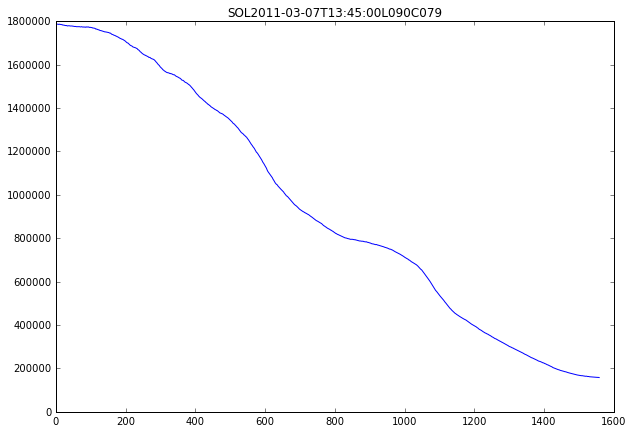

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M3.7


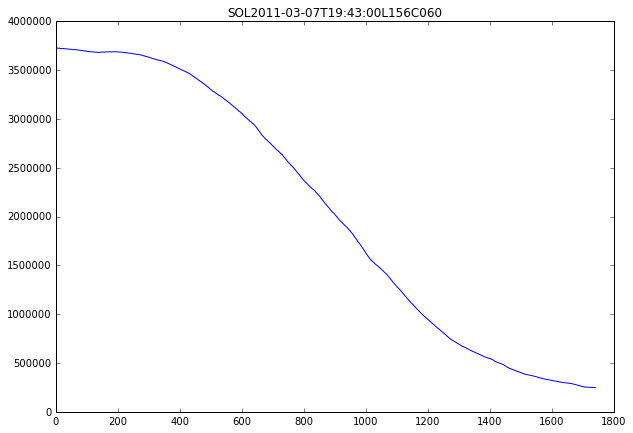

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M1.5


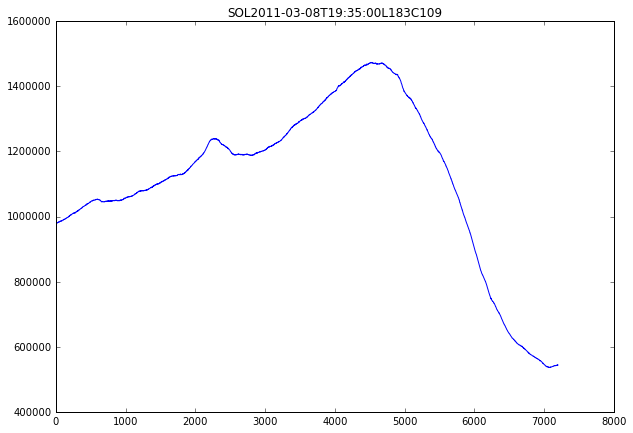

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-03-08T19:35:00L183C109
M1.8


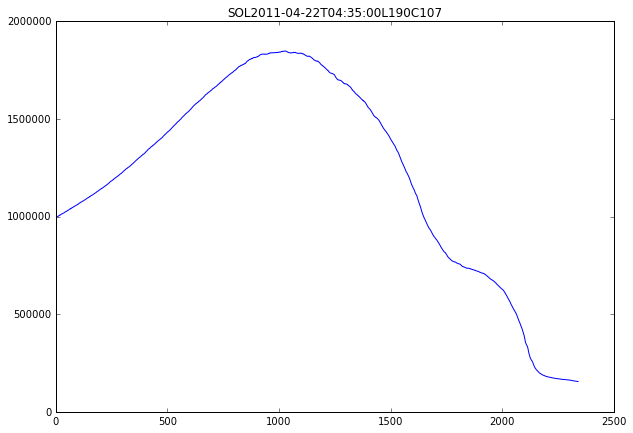

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-04-22T04:35:00L190C107
M1.4


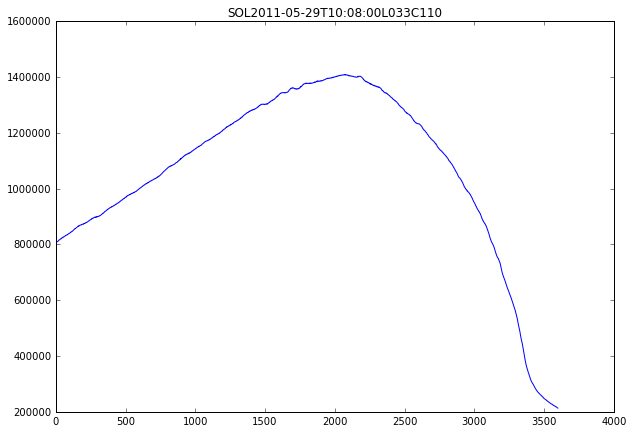

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-05-29T10:08:00L033C110
M2.5


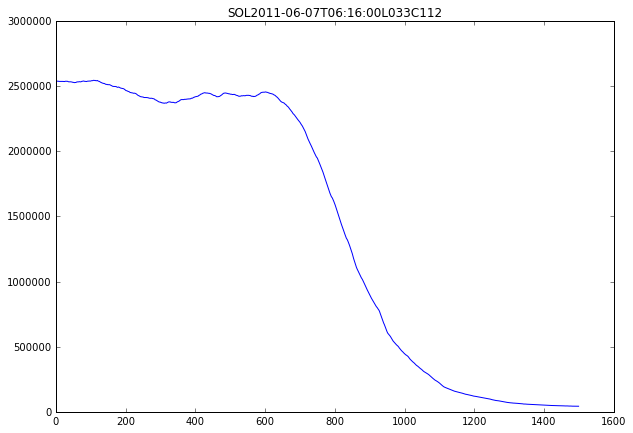

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M1.3


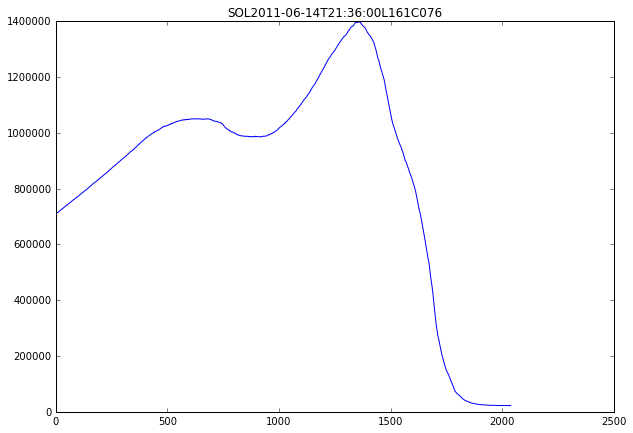

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-06-14T21:36:00L161C076
M1.4


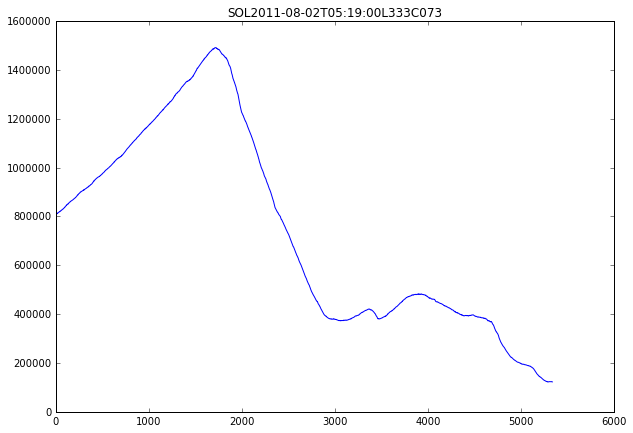

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-08-02T05:19:00L333C073
M1.1


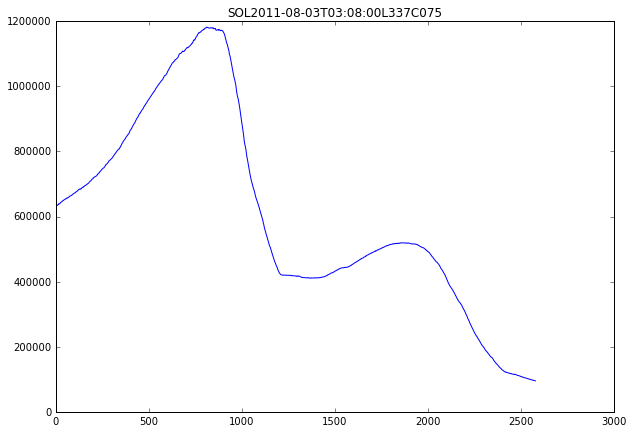

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-08-03T03:08:00L337C075
M6.0


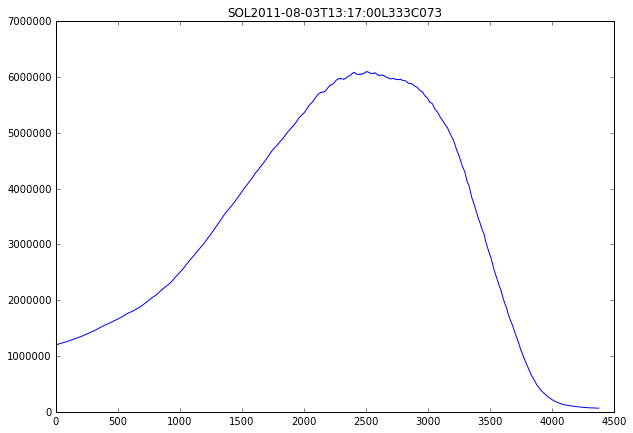

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-08-03T13:17:00L333C073
M2.5


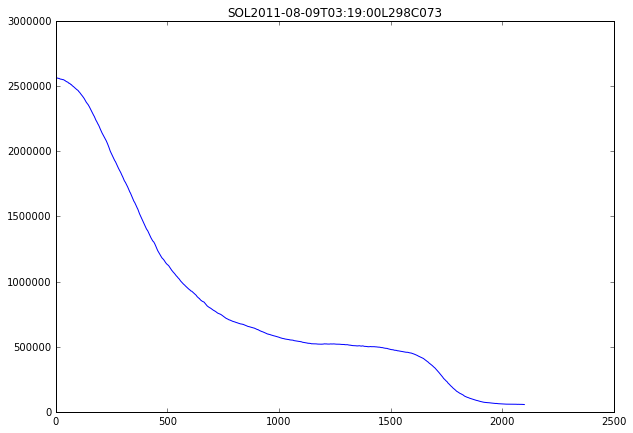

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M3.2


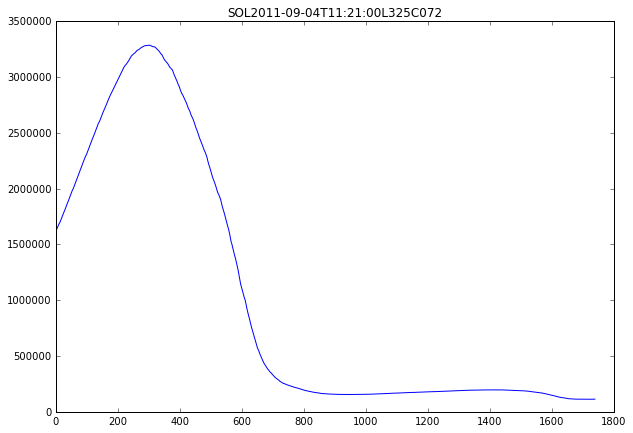

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-04T11:21:00L325C072
M1.6


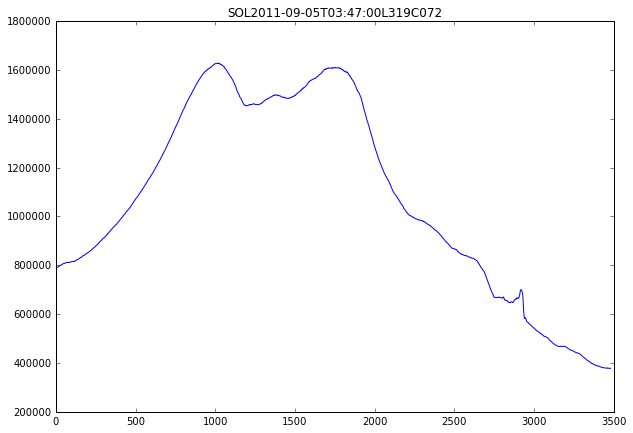

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-05T03:47:00L319C072
M1.2


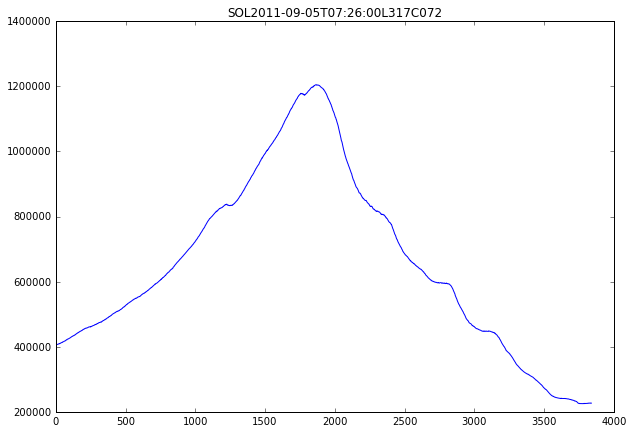

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-05T07:26:00L317C072
M1.2


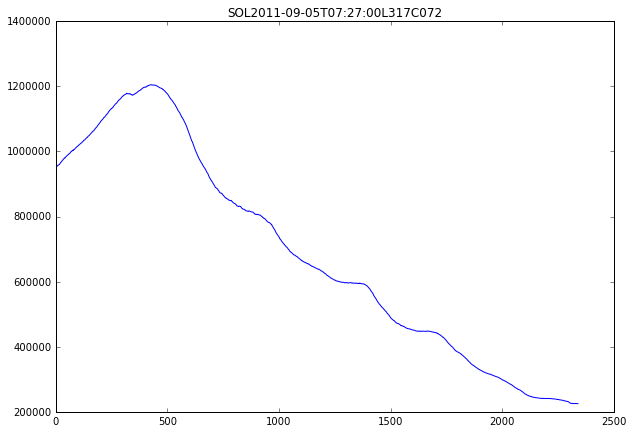

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M5.3


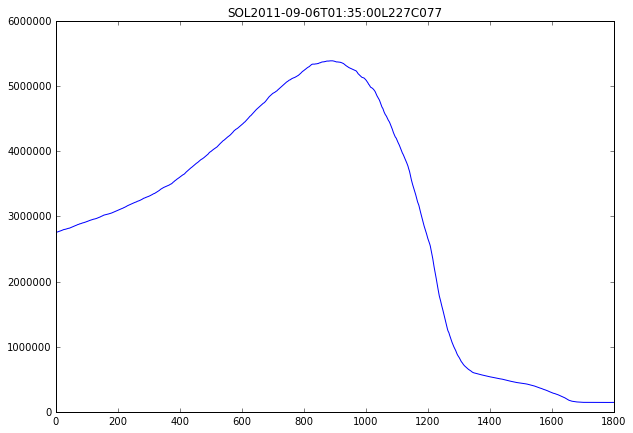

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-06T01:35:00L227C077
M1.1


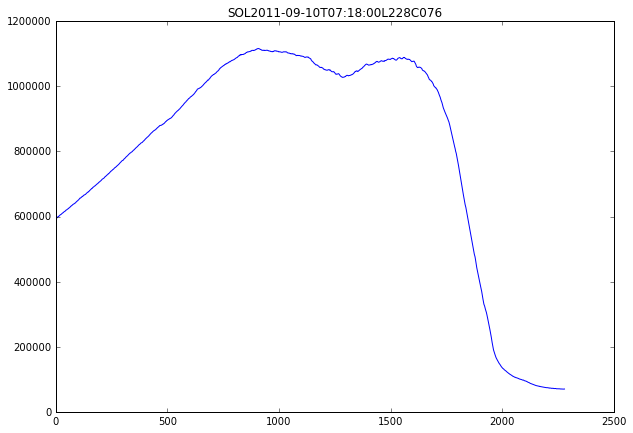

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-10T07:18:00L228C076
M1.8


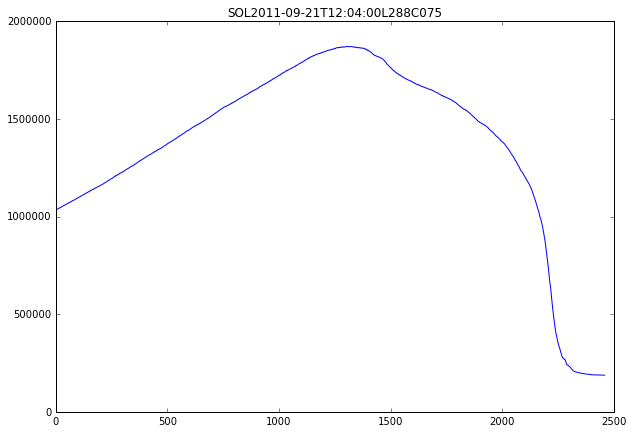

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-21T12:04:00L288C075
X1.4


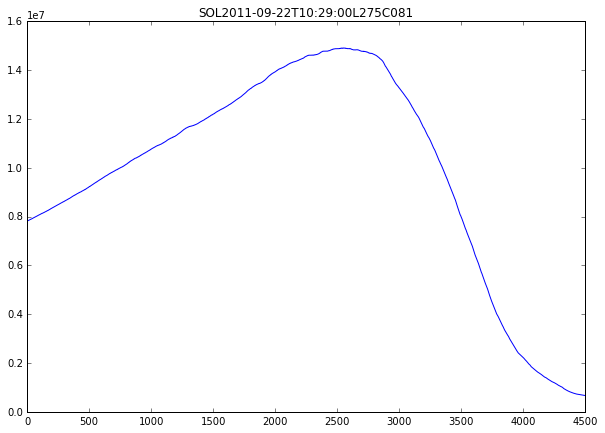

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-22T10:29:00L275C081
M1.6


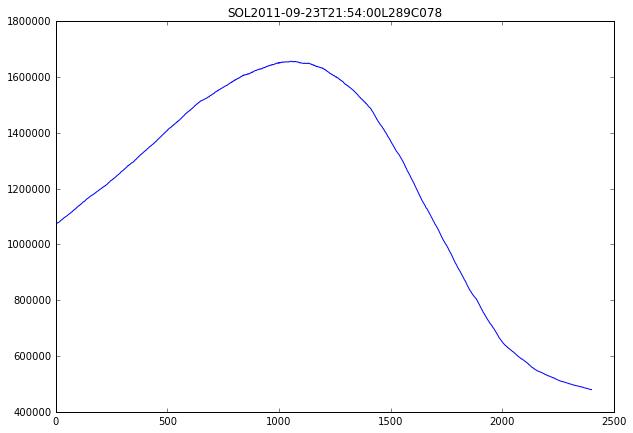

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-23T21:54:00L289C078
X1.9


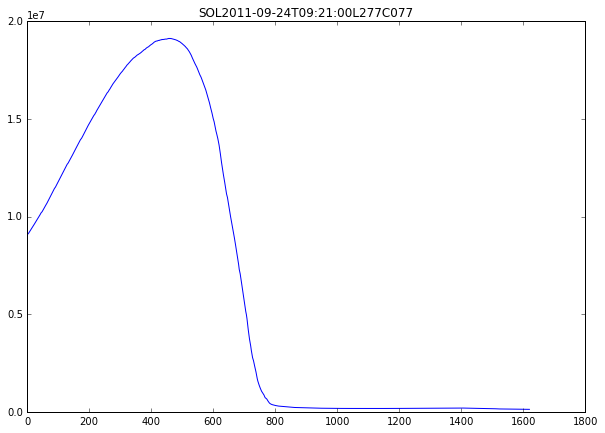

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-24T09:21:00L277C077
M7.1


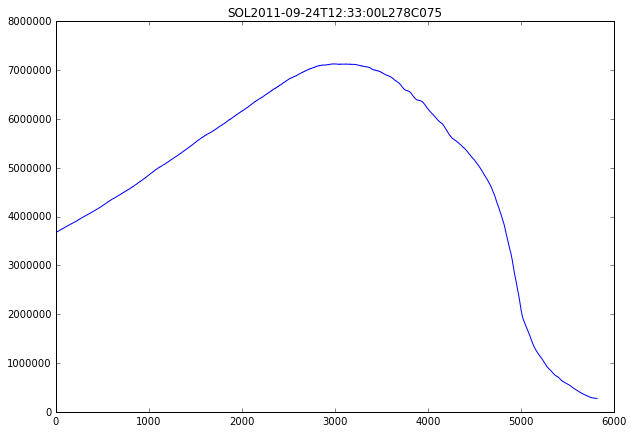

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-24T12:33:00L278C075
M1.8


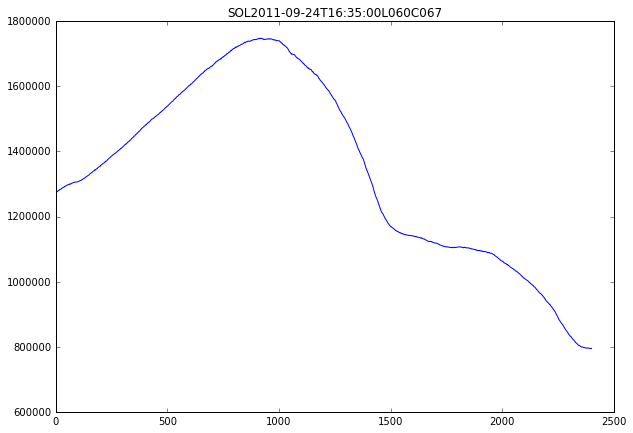

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-24T16:35:00L060C067
M2.8


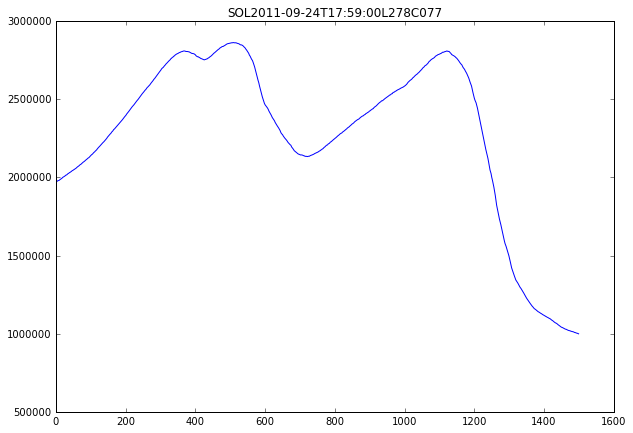

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-24T17:59:00L278C077
M3.0


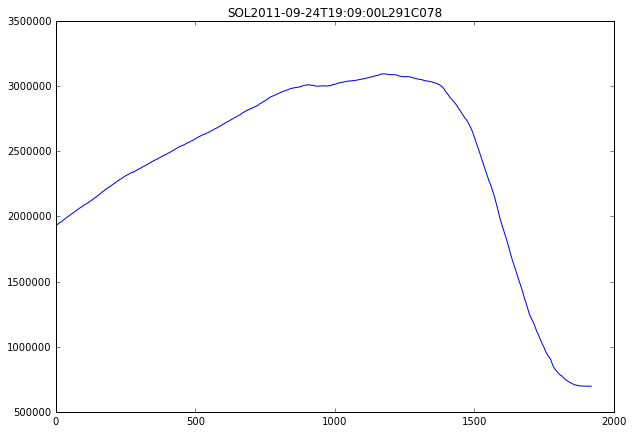

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-24T19:09:00L291C078
M1.0


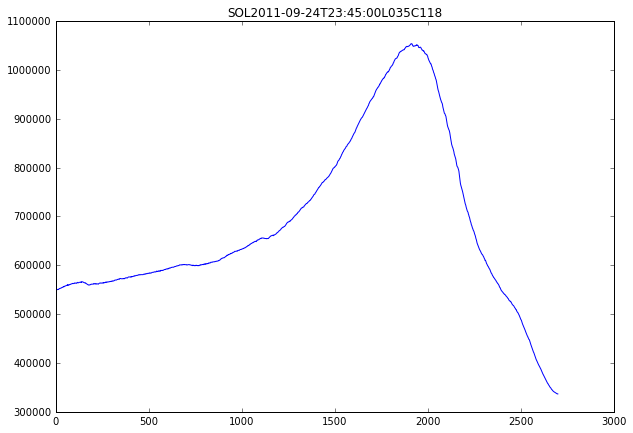

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-24T23:45:00L035C118
M7.4


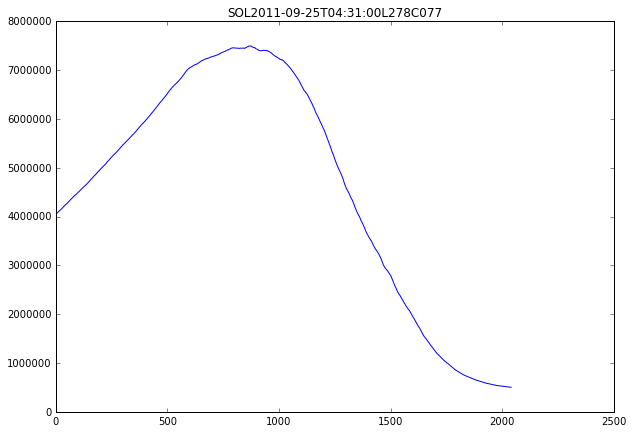

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-25T04:31:00L278C077
M1.5


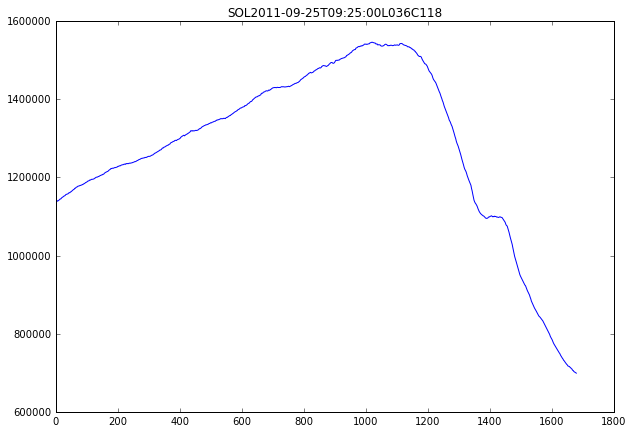

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-09-25T09:25:00L036C118
M1.2


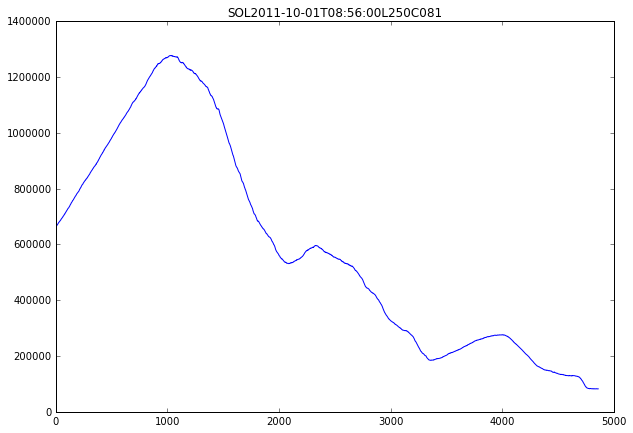

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-10-01T08:56:00L250C081
M1.6


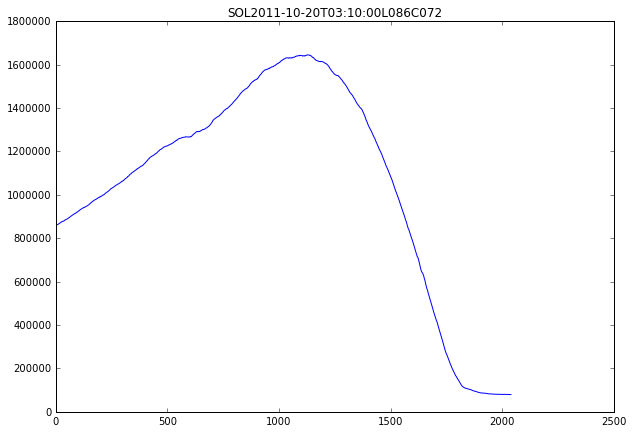

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-10-20T03:10:00L086C072
M1.3


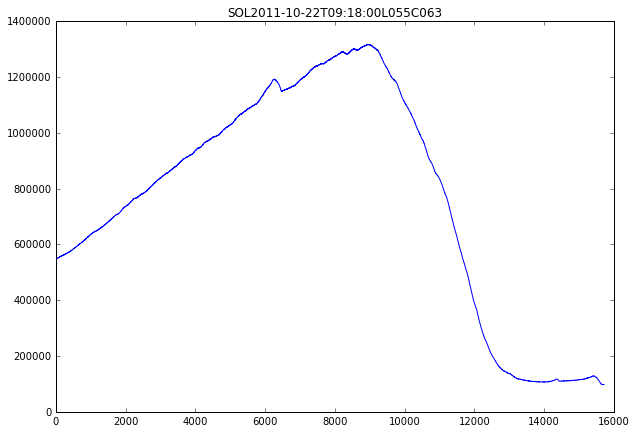

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-10-22T09:18:00L055C063
M1.1


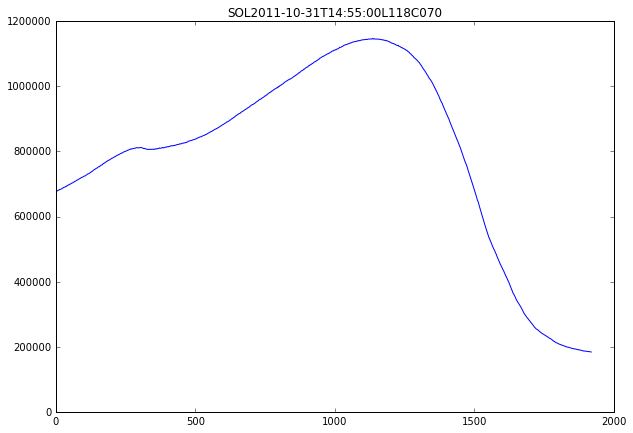

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-10-31T14:55:00L118C070
M1.4


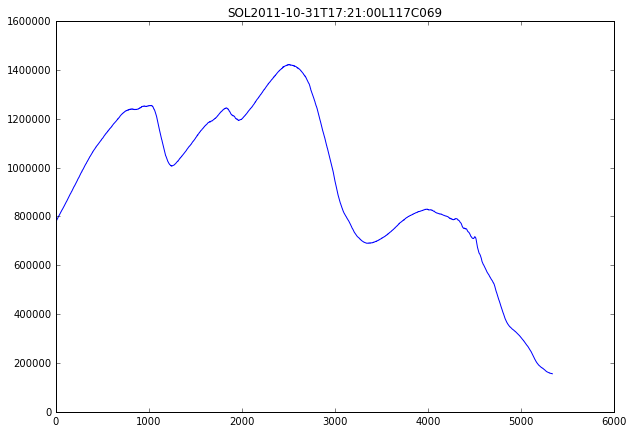

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-10-31T17:21:00L117C069
M4.3


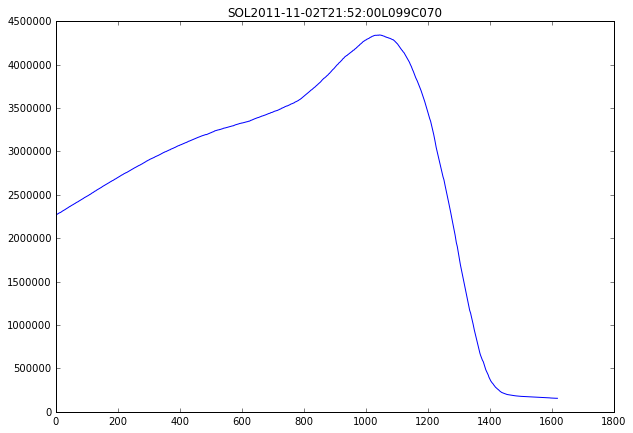

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-11-02T21:52:00L099C070
M3.7


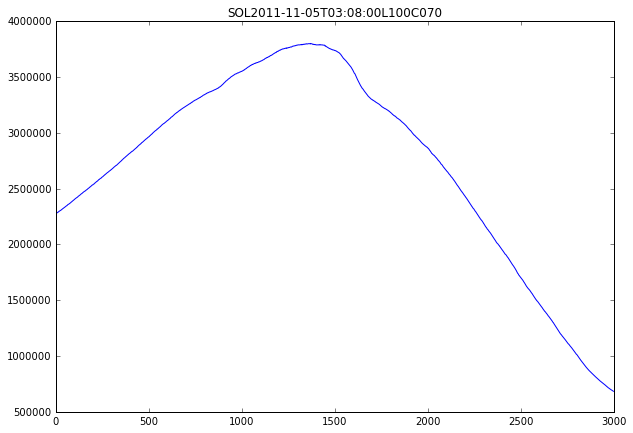

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-11-05T03:08:00L100C070
M1.1


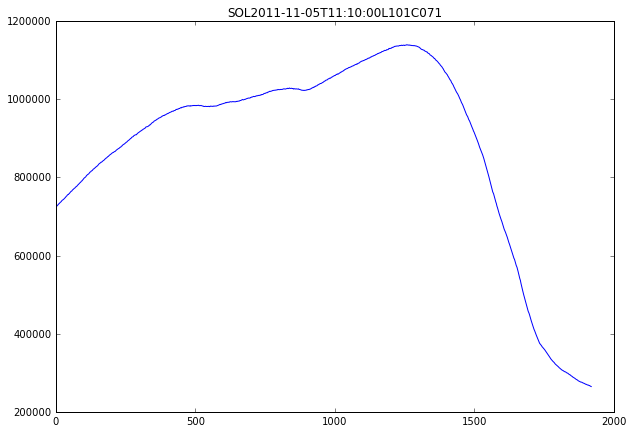

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-11-05T11:10:00L101C071
M1.2


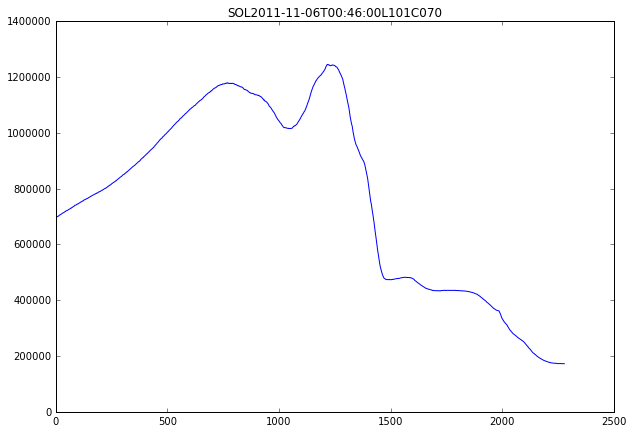

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-11-06T00:46:00L101C070
M1.4


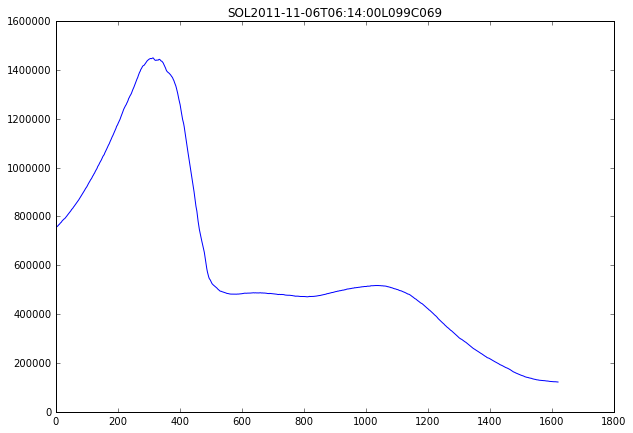

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-11-06T06:14:00L099C069
M1.1


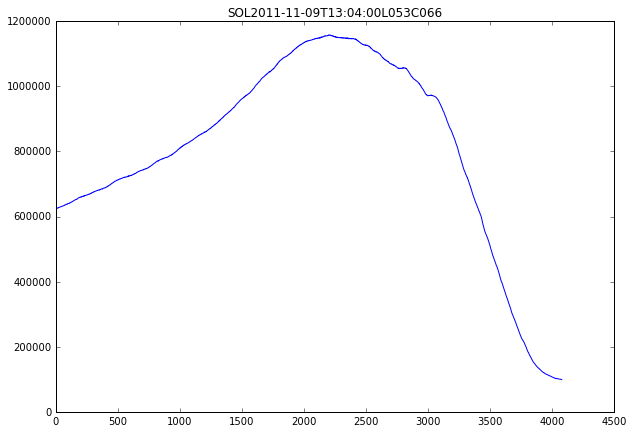

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2011-11-09T13:04:00L053C066
M1.0


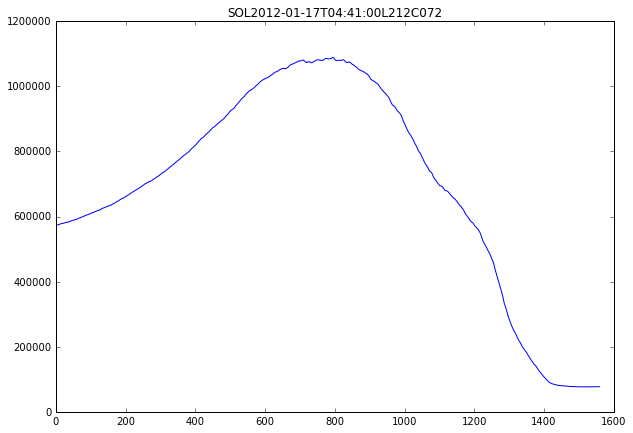

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-01-17T04:41:00L212C072
M2.6


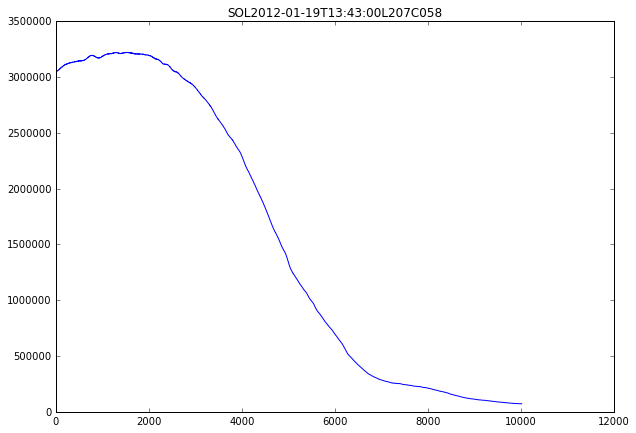

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M3.2


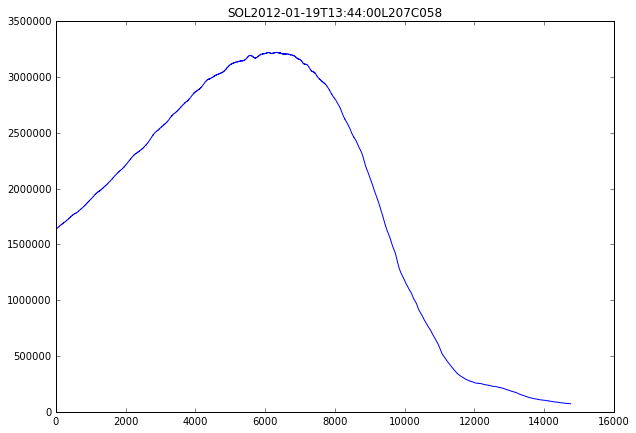

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-01-19T13:44:00L207C058
X1.7


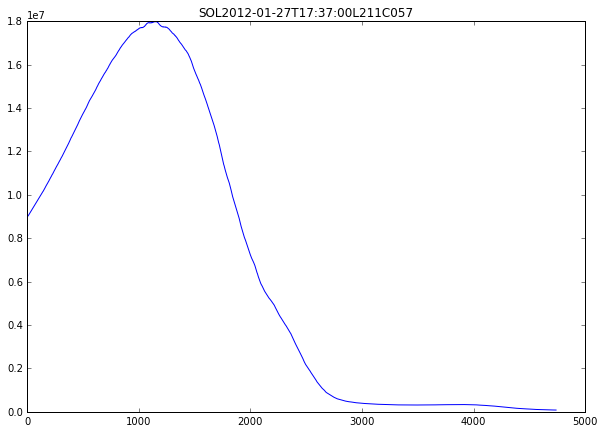

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-01-27T17:37:00L211C057
M1.0


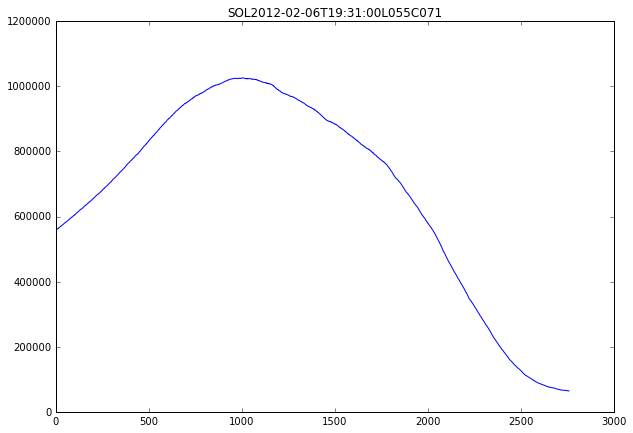

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-02-06T19:31:00L055C071
M3.3


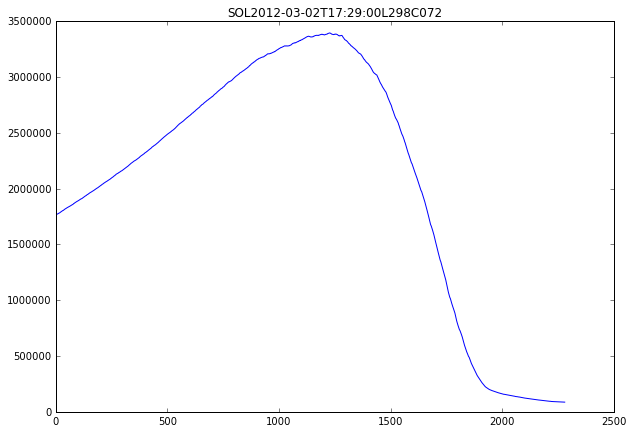

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-02T17:29:00L298C072
M2.0


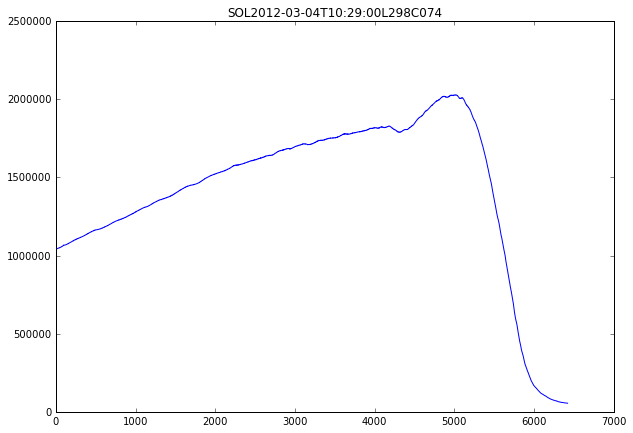

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-04T10:29:00L298C074
X1.1


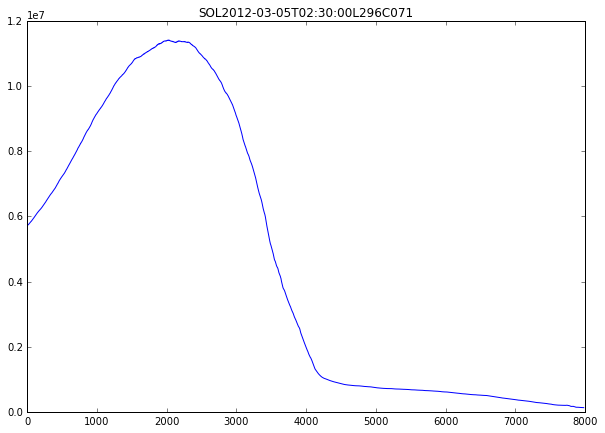

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-05T02:30:00L296C071
M2.1


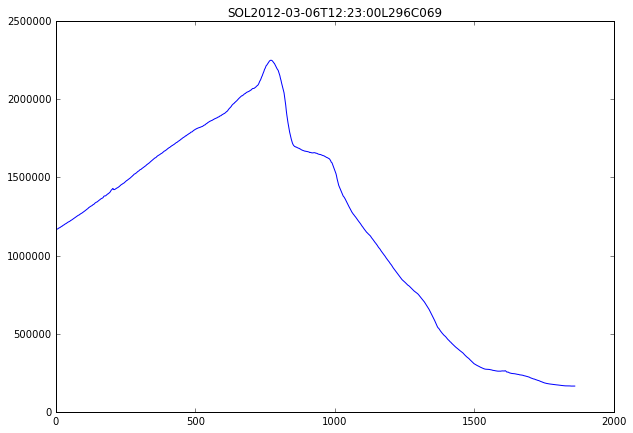

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-06T12:23:00L296C069
X5.4


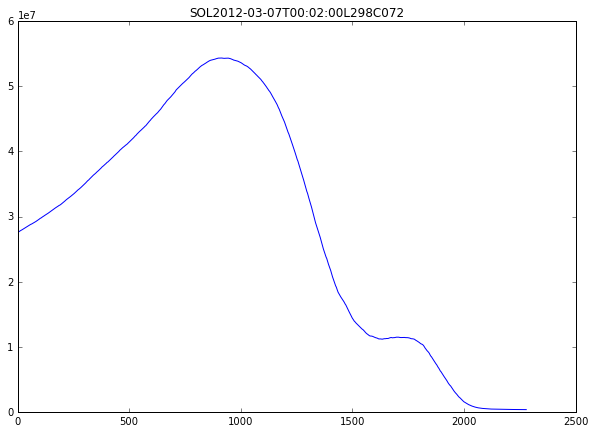

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-07T00:02:00L298C072
M6.3


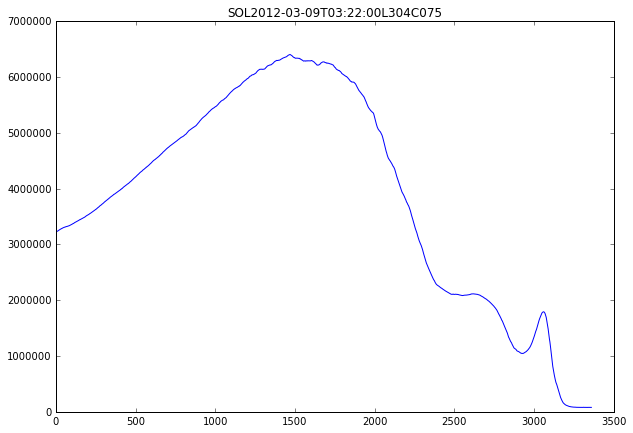

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-09T03:22:00L304C075
M8.4


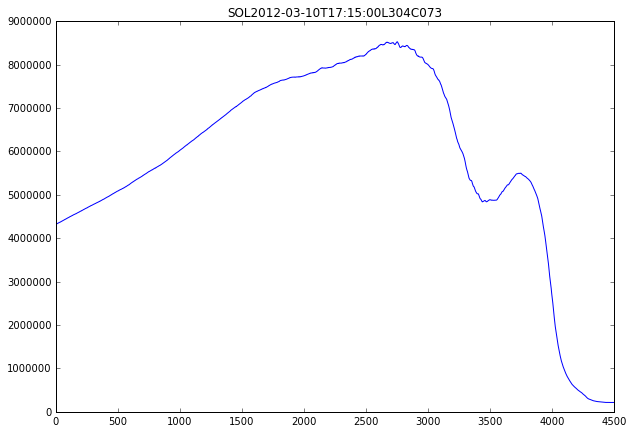

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-10T17:15:00L304C073
M7.9


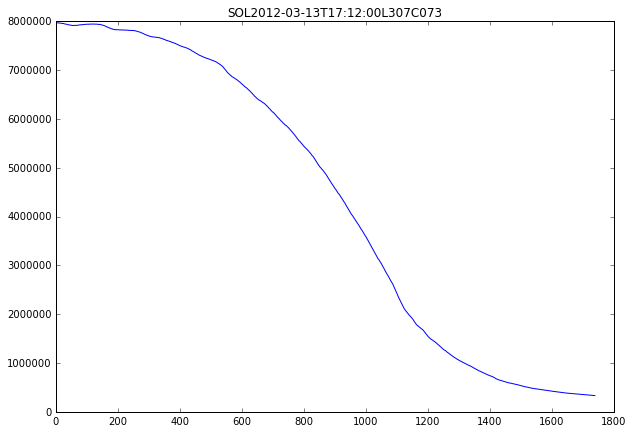

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M2.8


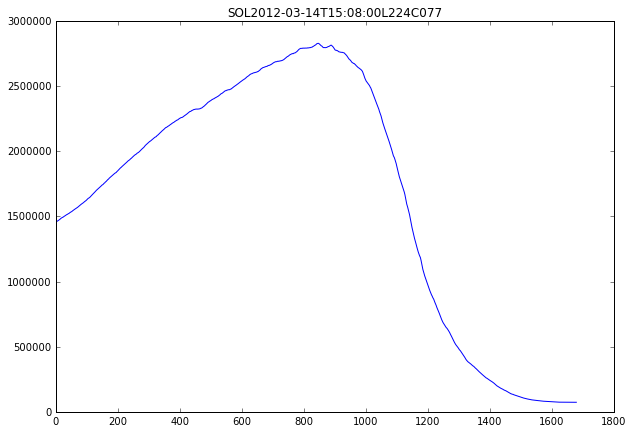

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-14T15:08:00L224C077
M1.8


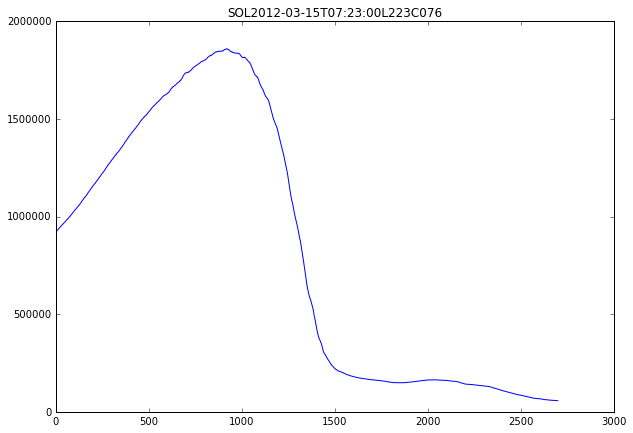

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-03-15T07:23:00L223C076
M1.7


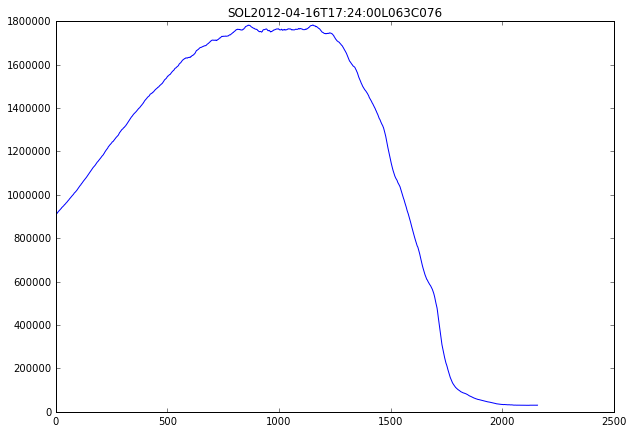

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-04-16T17:24:00L063C076
M1.9


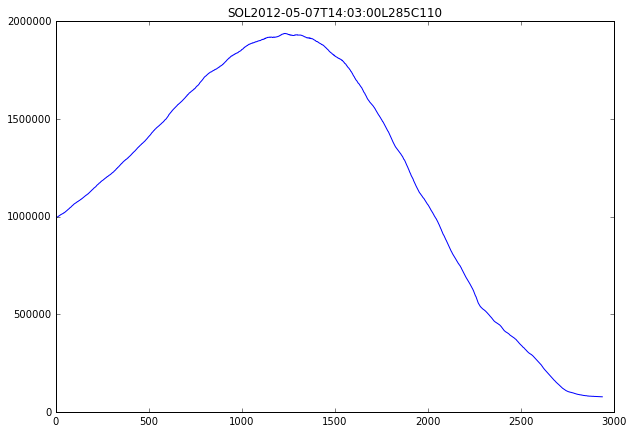

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-05-07T14:03:00L285C110
M5.1


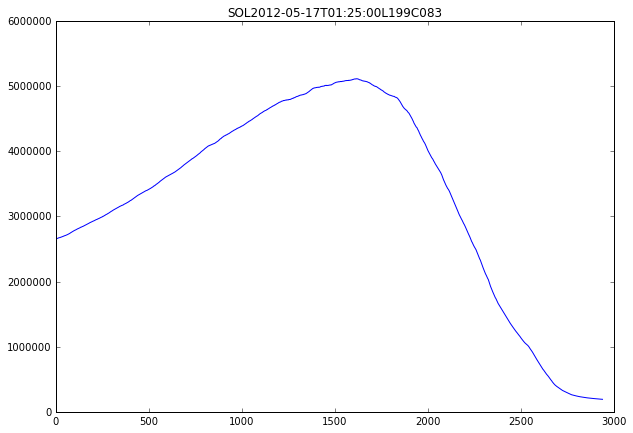

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-05-17T01:25:00L199C083
M2.3


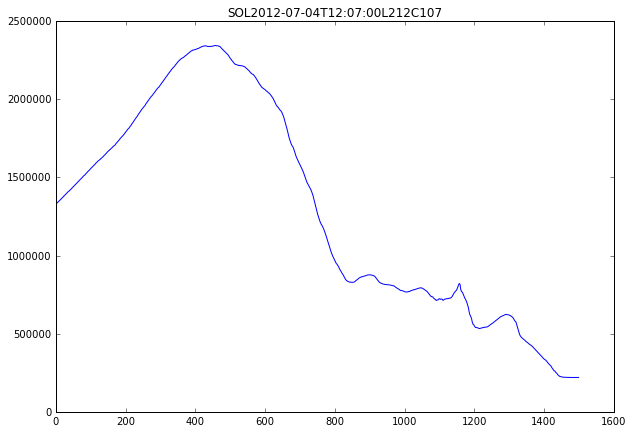

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-04T12:07:00L212C107
M1.2


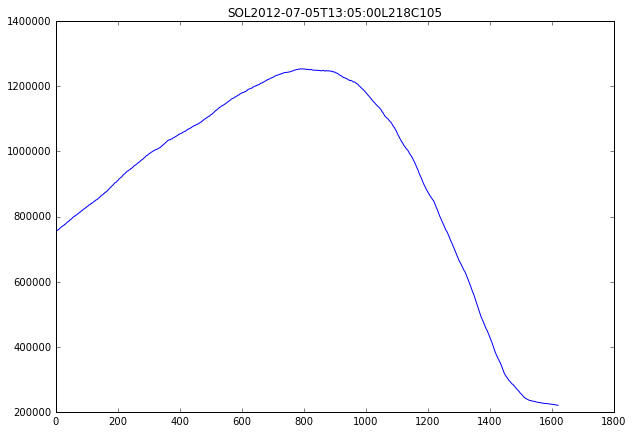

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-05T13:05:00L218C105
X1.4


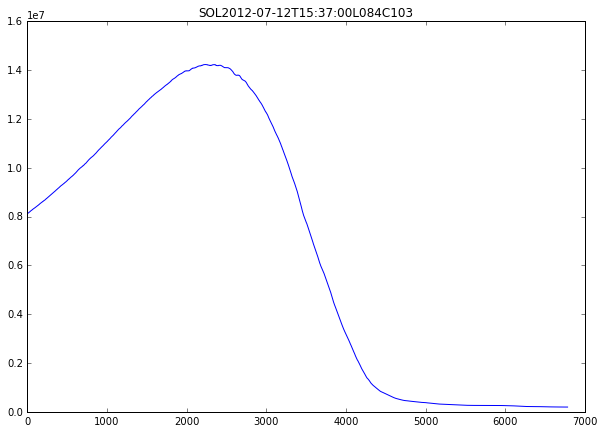

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-12T15:37:00L084C103
M1.0


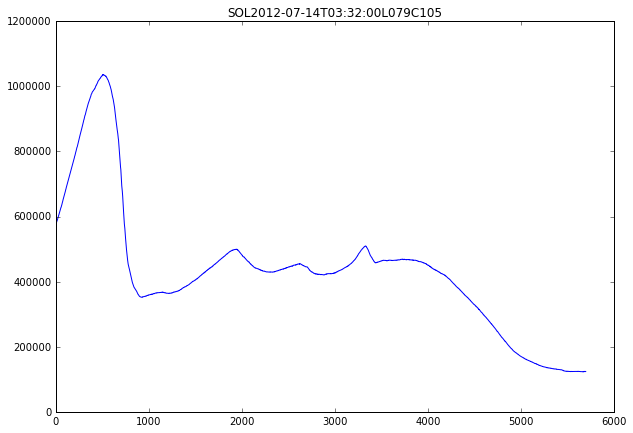

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-14T03:32:00L079C105
M1.7


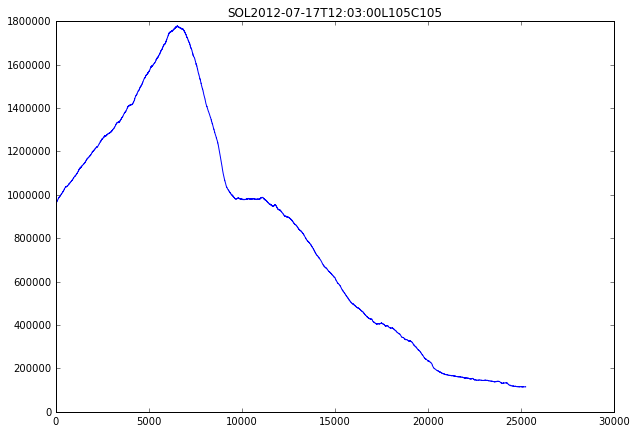

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-17T12:03:00L105C105
M1.8


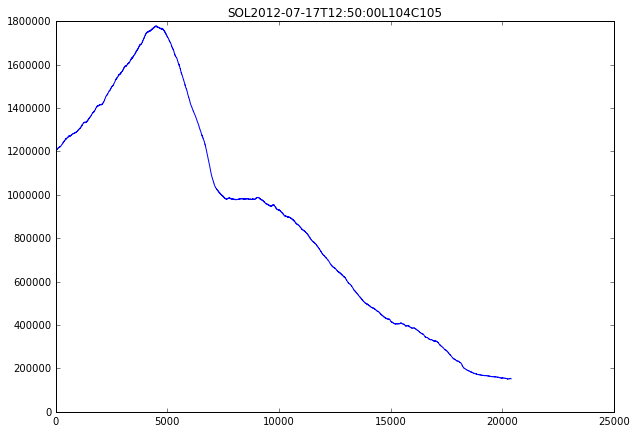

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-17T12:50:00L104C105
M6.7


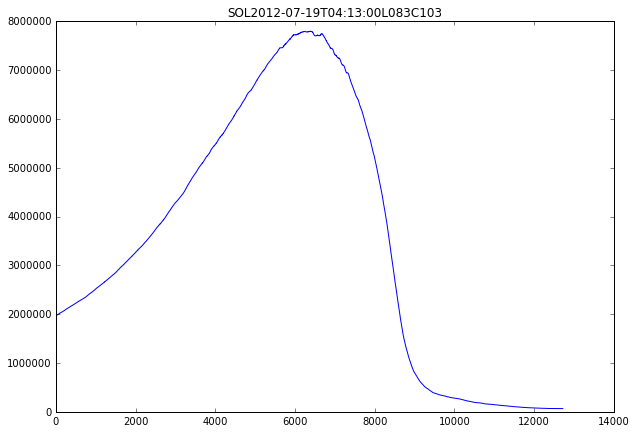

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-19T04:13:00L083C103
M7.7


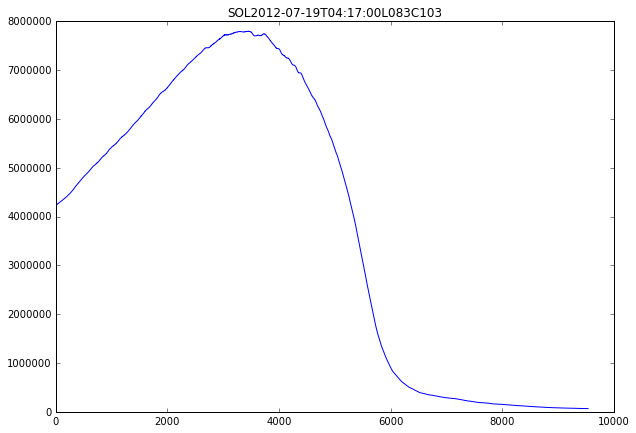

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-07-19T04:17:00L083C103
M7.7


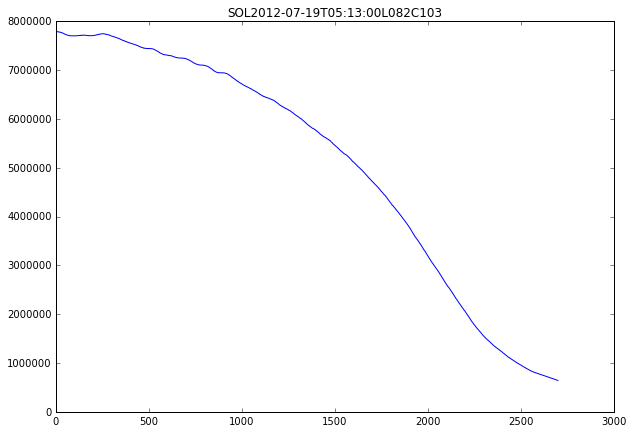

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M1.0


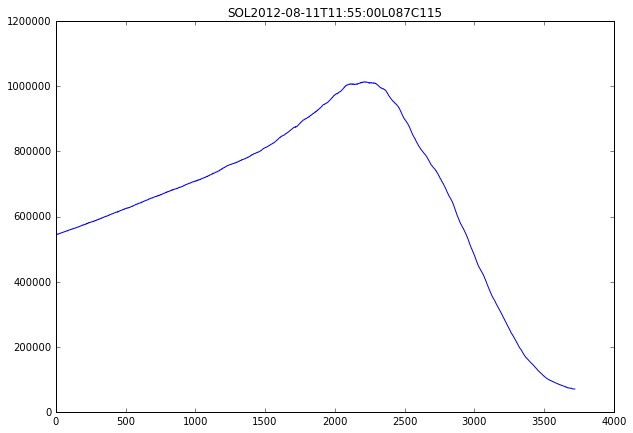

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-08-11T11:55:00L087C115
M5.5


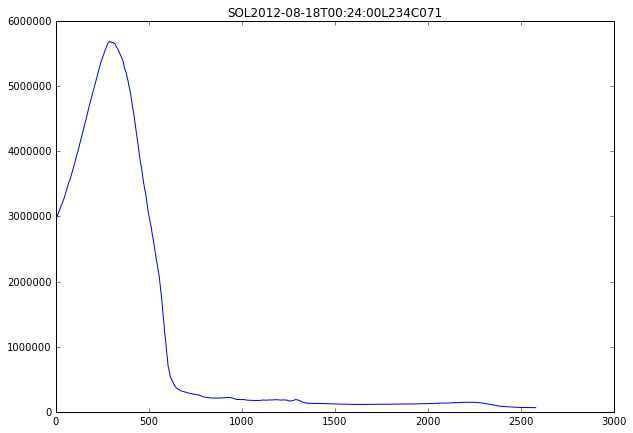

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-08-18T00:24:00L234C071
M1.4


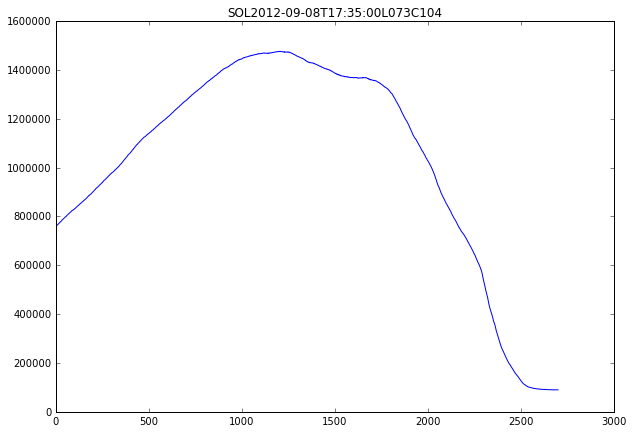

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-09-08T17:35:00L073C104
M1.2


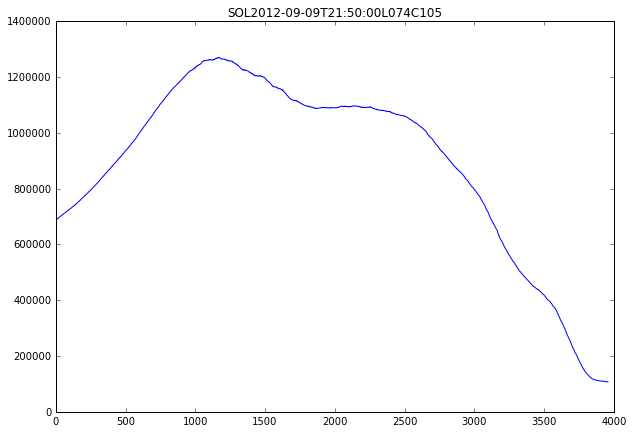

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2012-09-09T21:50:00L074C105
M1.2


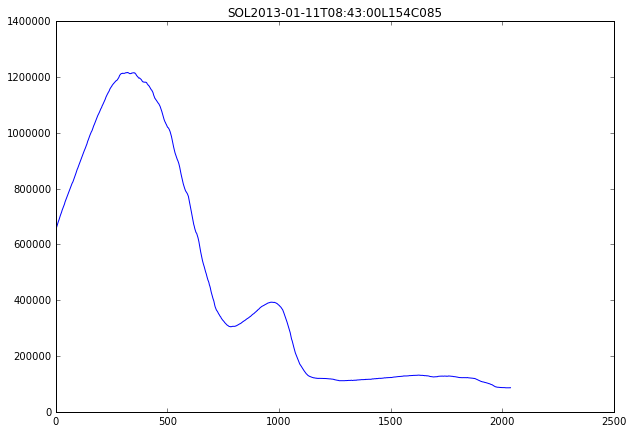

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-01-11T08:43:00L154C085
M1.0


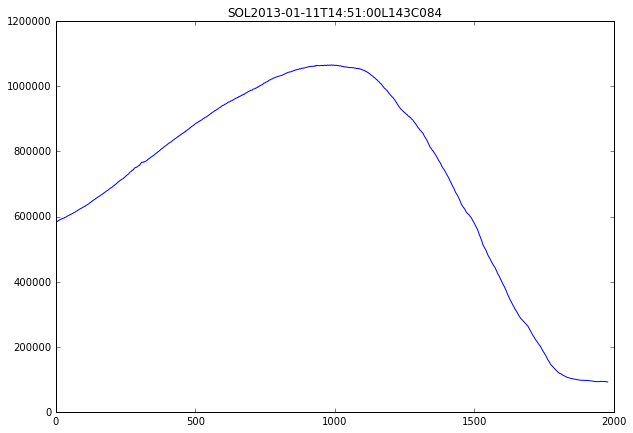

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-01-11T14:51:00L143C084
M1.1


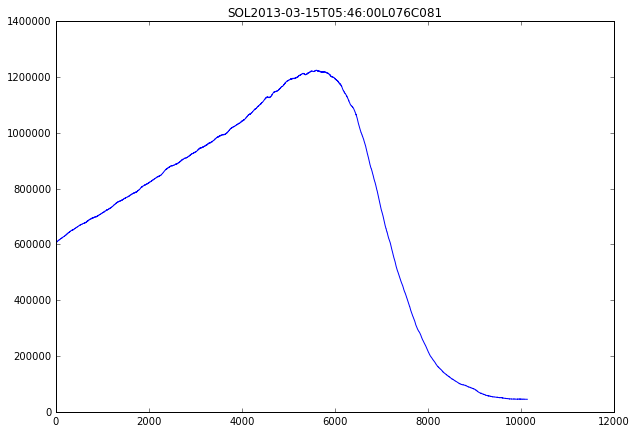

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-03-15T05:46:00L076C081
M1.6


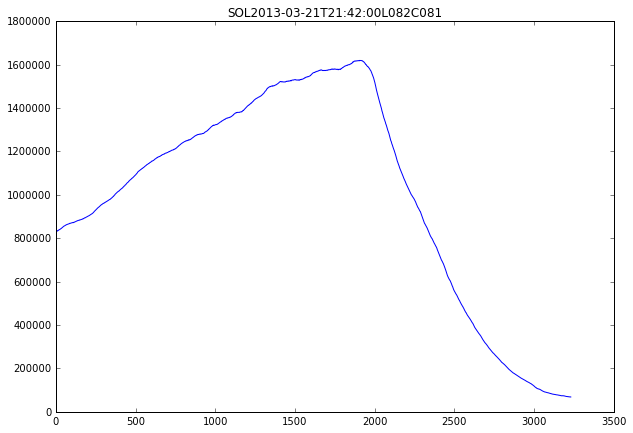

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-03-21T21:42:00L082C081
M6.5


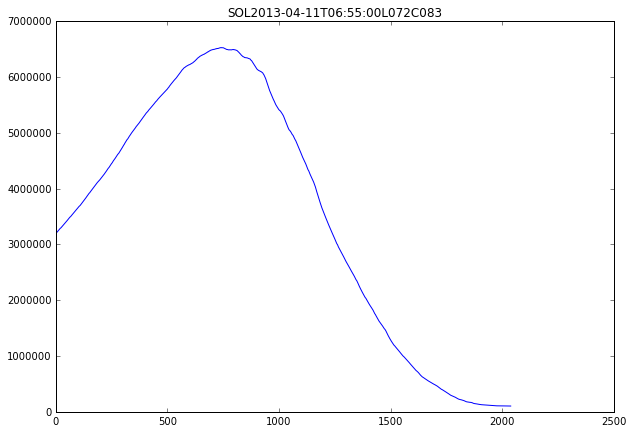

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-04-11T06:55:00L072C083
M3.3


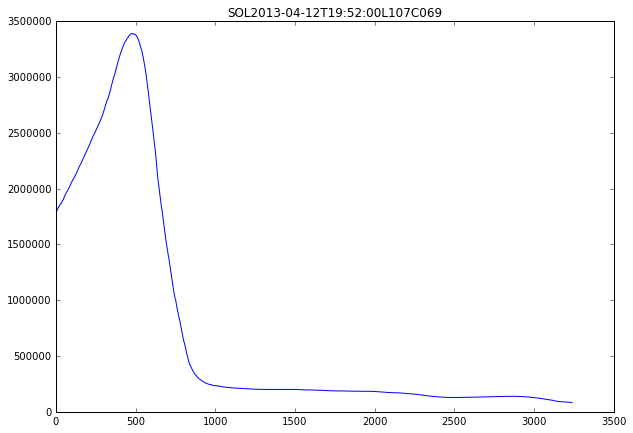

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-04-12T19:52:00L107C069
M1.3


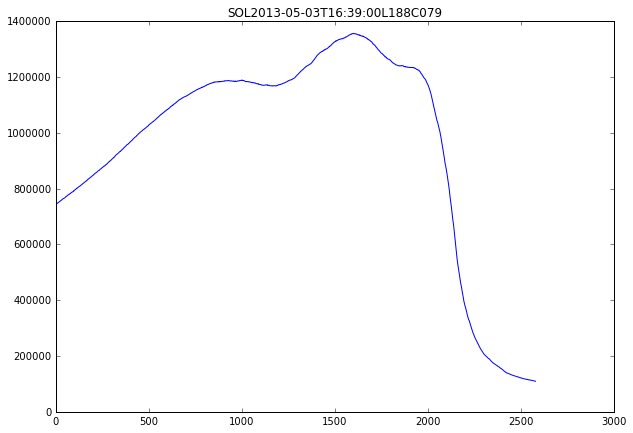

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-03T16:39:00L188C079
M1.3


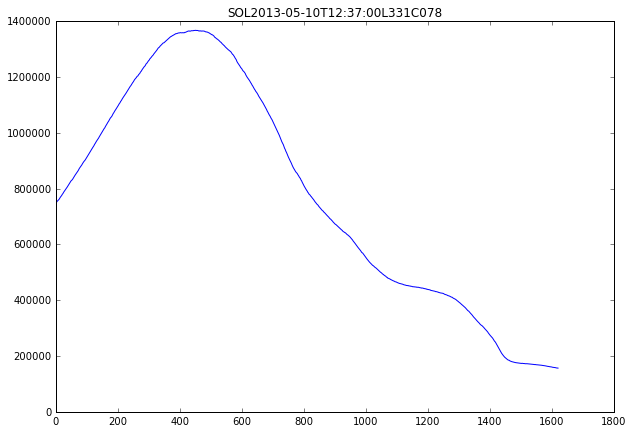

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-10T12:37:00L331C078
X1.7


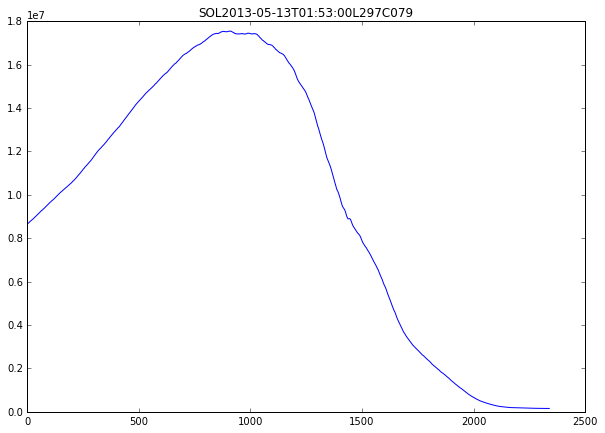

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-13T01:53:00L297C079
X2.8


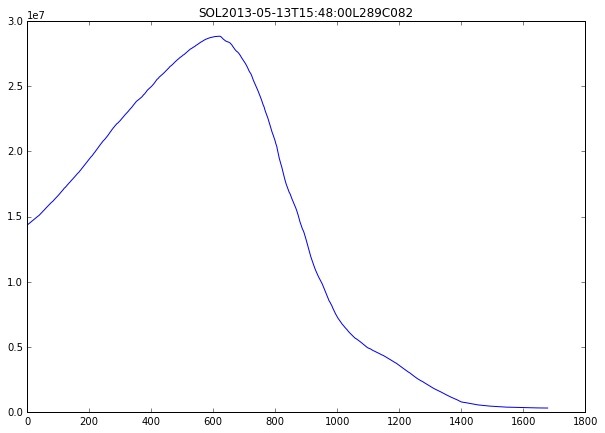

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-13T15:48:00L289C082
X3.2


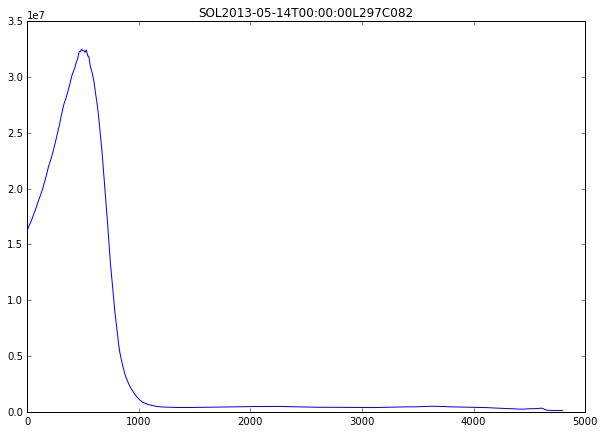

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-14T00:00:00L297C082
X1.2


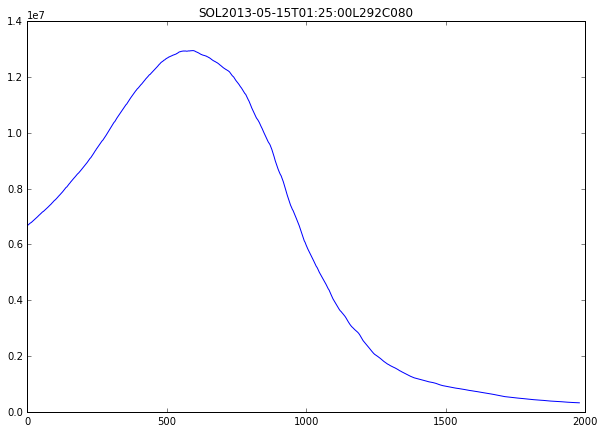

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-15T01:25:00L292C080
M1.3


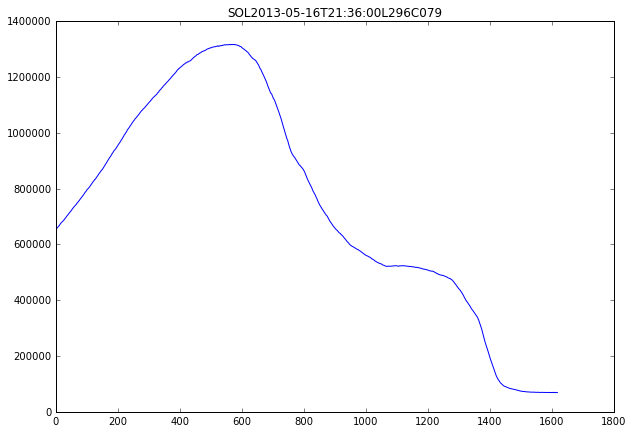

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-16T21:36:00L296C079
M3.2


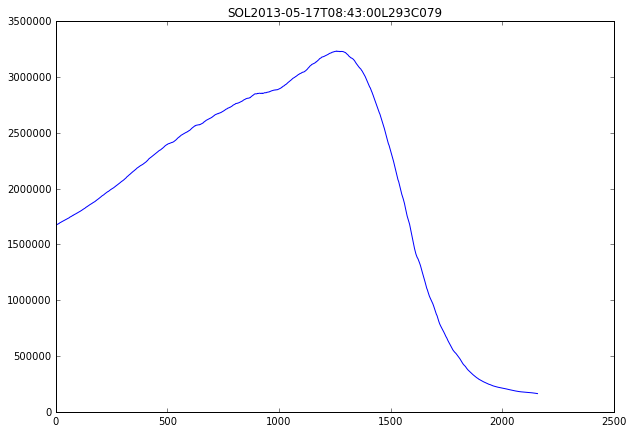

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-17T08:43:00L293C079
M1.8


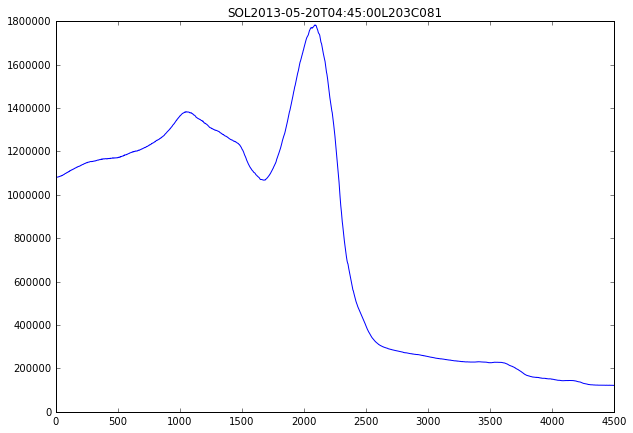

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-05-20T04:45:00L203C081
M1.3


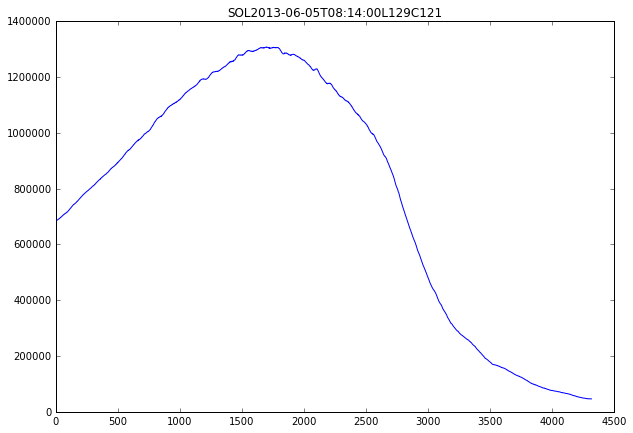

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-06-05T08:14:00L129C121
M5.9


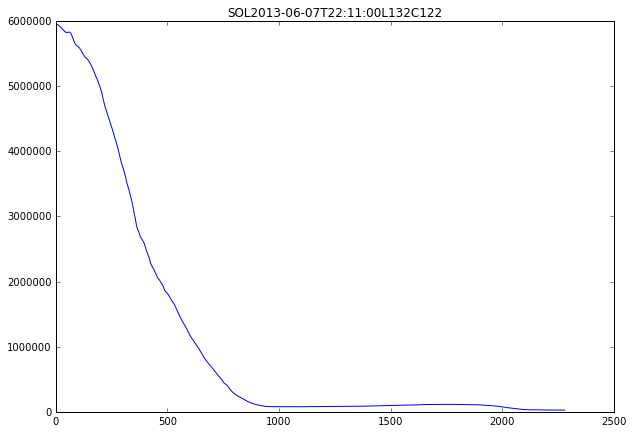

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M2.9


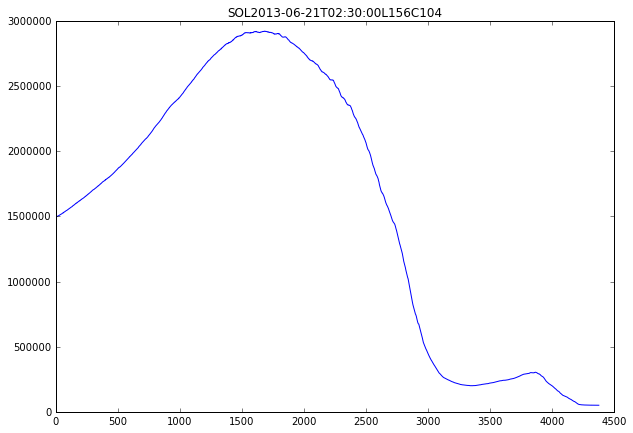

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-06-21T02:30:00L156C104
M1.2


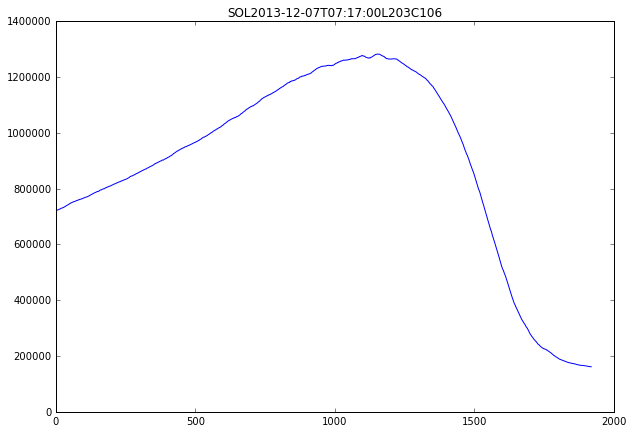

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-12-07T07:17:00L203C106
M1.6


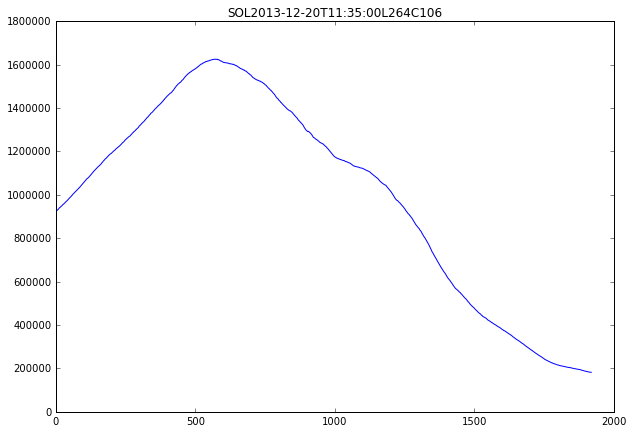

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-12-20T11:35:00L264C106
M1.6


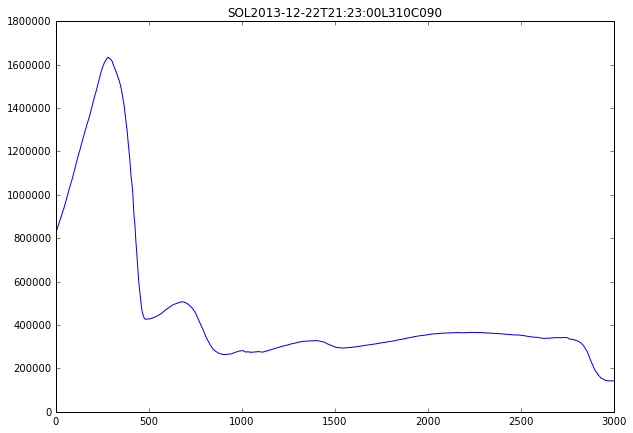

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-12-22T21:23:00L310C090
M6.4


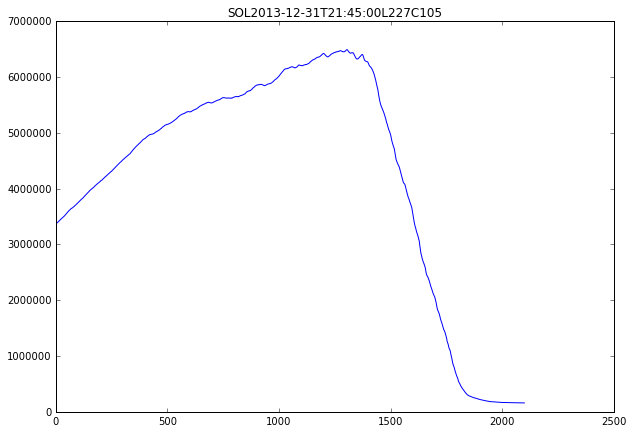

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2013-12-31T21:45:00L227C105
M1.7


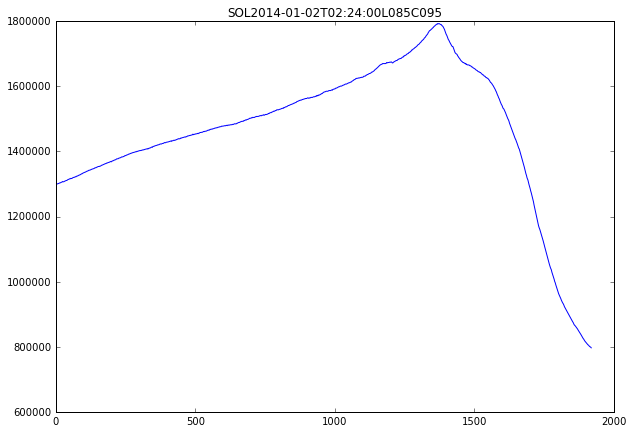

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-02T02:24:00L085C095
M1.3


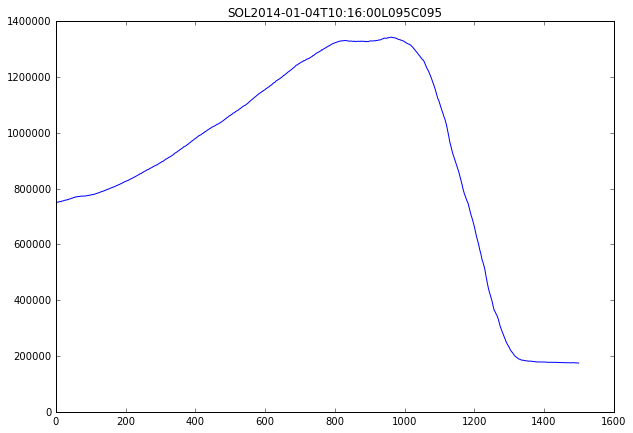

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-04T10:16:00L095C095
M4.0


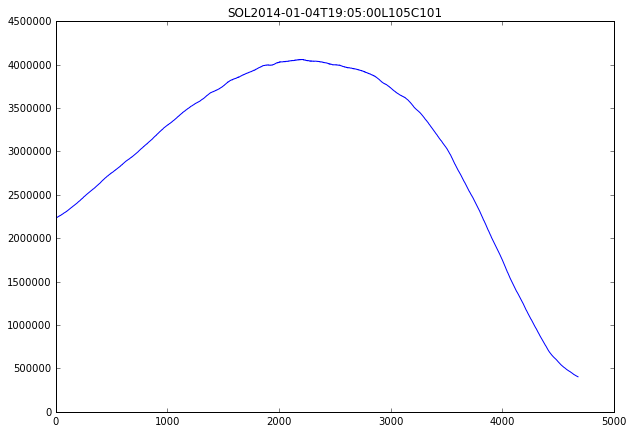

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-04T19:05:00L105C101
M2.0


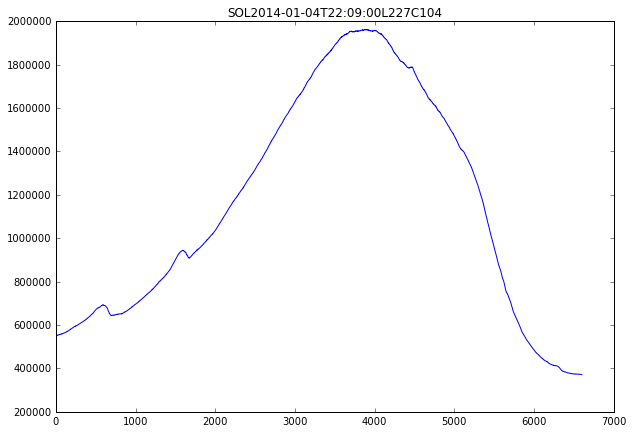

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-04T22:09:00L227C104
M1.9


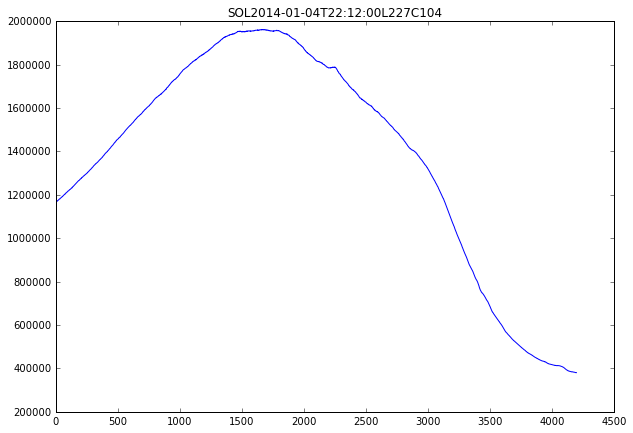

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-04T22:12:00L227C104
M7.2


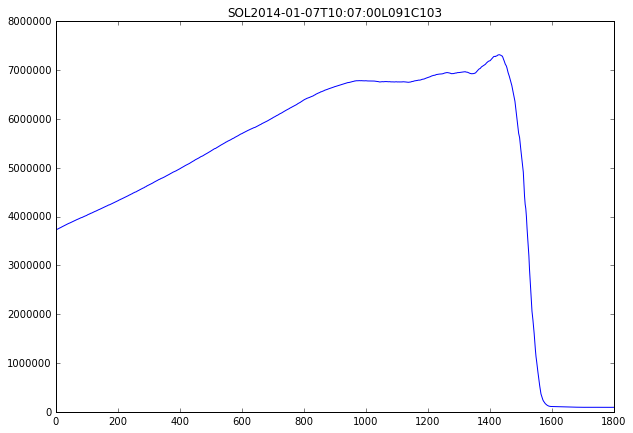

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-07T10:07:00L091C103
X1.2


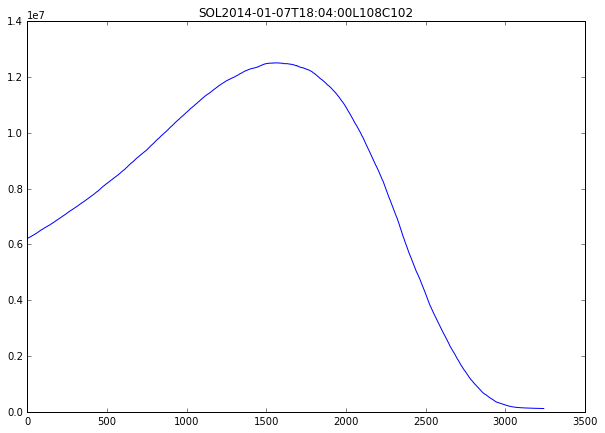

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-07T18:04:00L108C102
M1.0


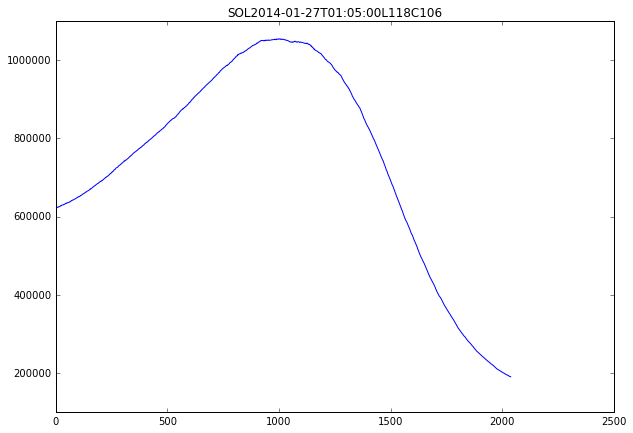

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-27T01:05:00L118C106
M4.9


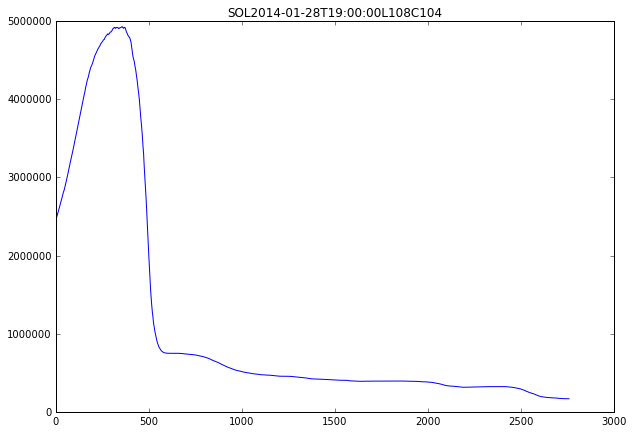

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-28T19:00:00L108C104
M1.1


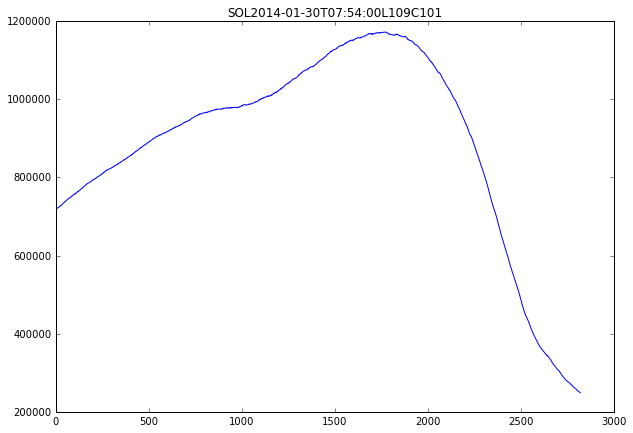

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-30T07:54:00L109C101
M6.6


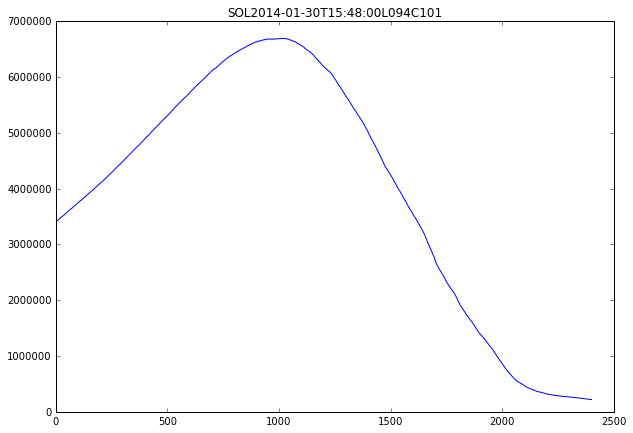

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-01-30T15:48:00L094C101
M3.0


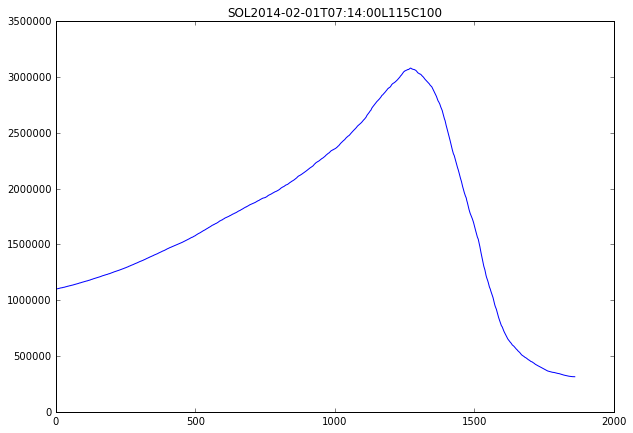

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-01T07:14:00L115C100
M2.2


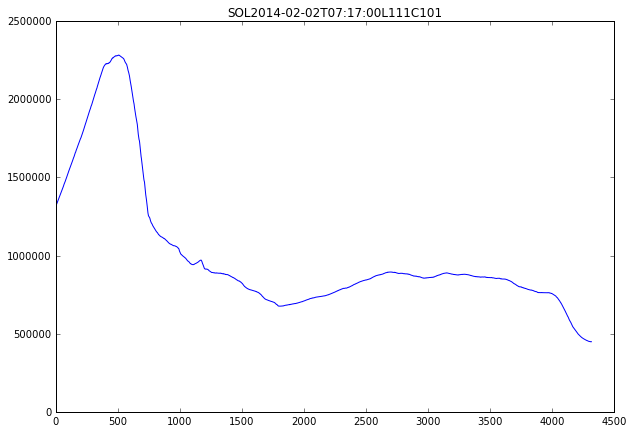

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-02T07:17:00L111C101
M1.3


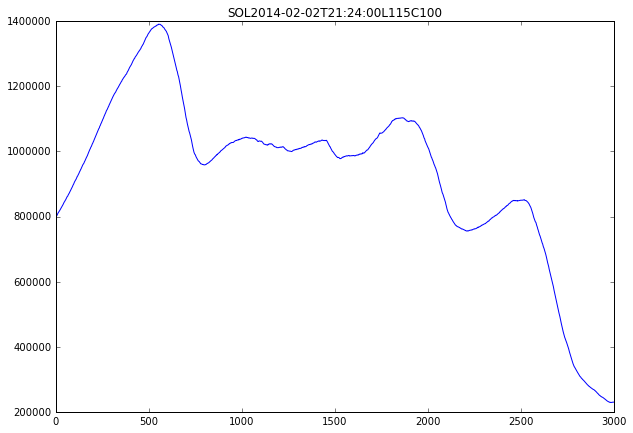

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-02T21:24:00L115C100
M1.2


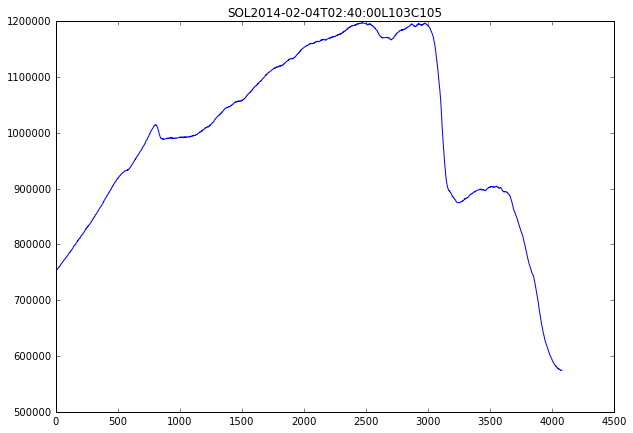

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-04T02:40:00L103C105
M1.5


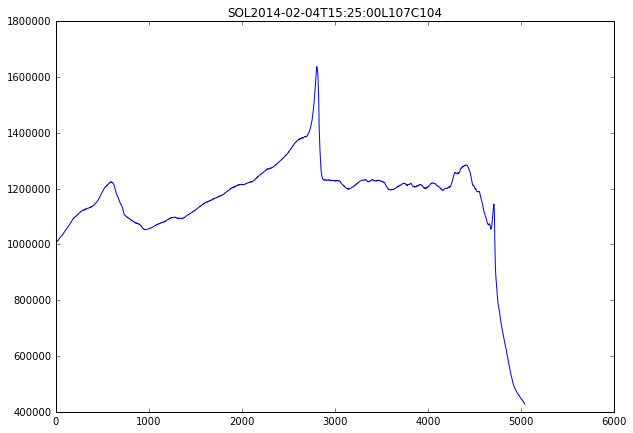

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-04T15:25:00L107C104
M1.0


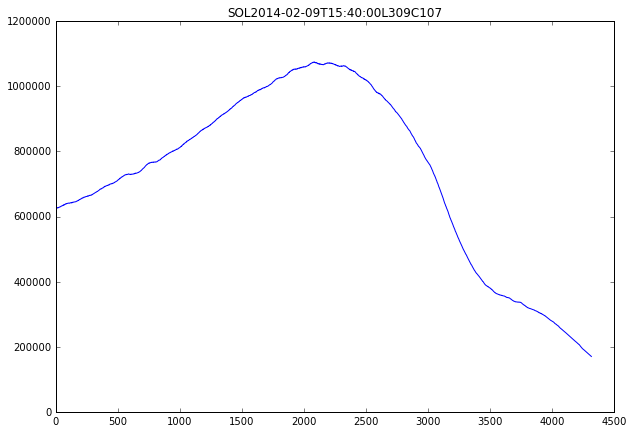

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-09T15:40:00L309C107
M1.0


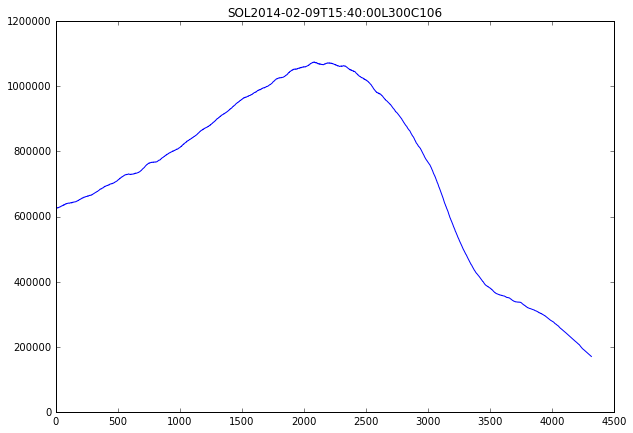

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-09T15:40:00L300C106
M3.7


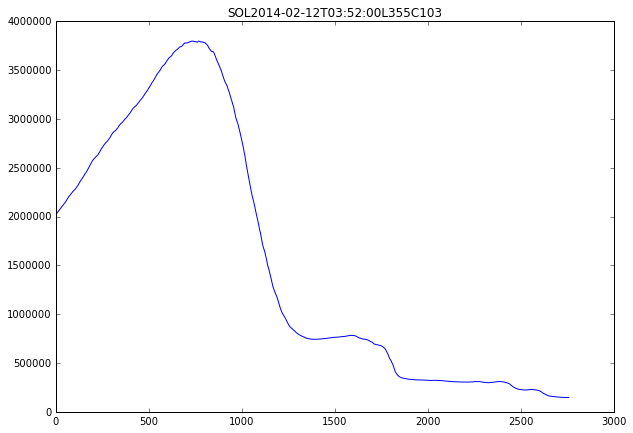

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-12T03:52:00L355C103
M2.1


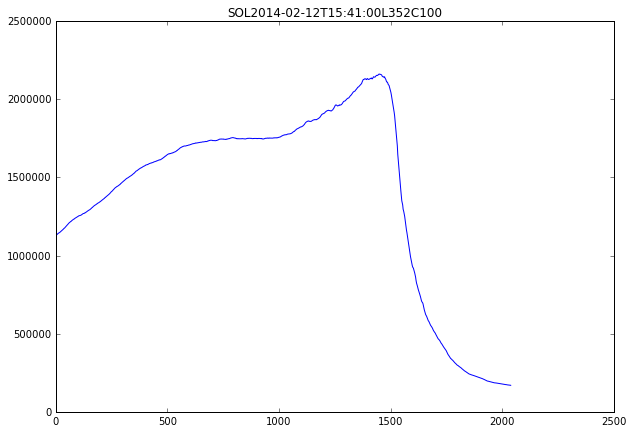

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-12T15:41:00L352C100
M2.3


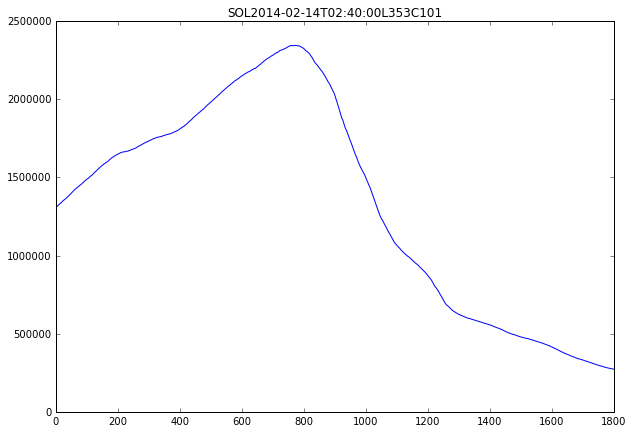

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-02-14T02:40:00L353C101
M1.4


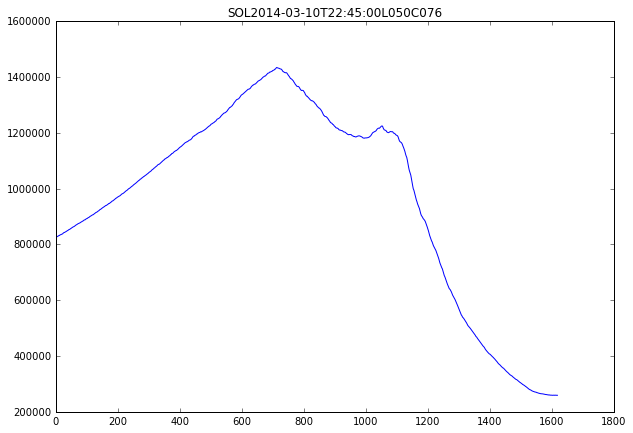

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-03-10T22:45:00L050C076
M1.2


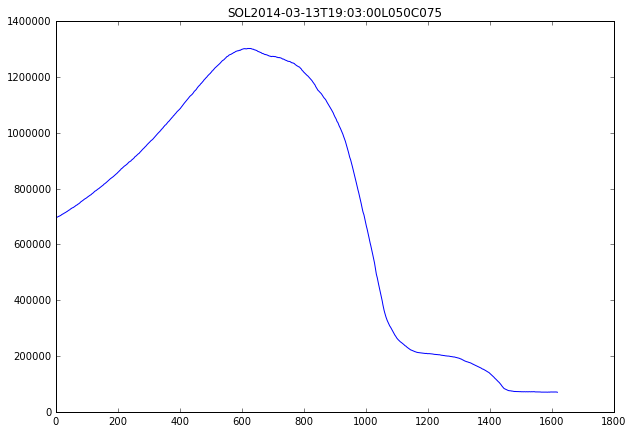

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-03-13T19:03:00L050C075
M1.7


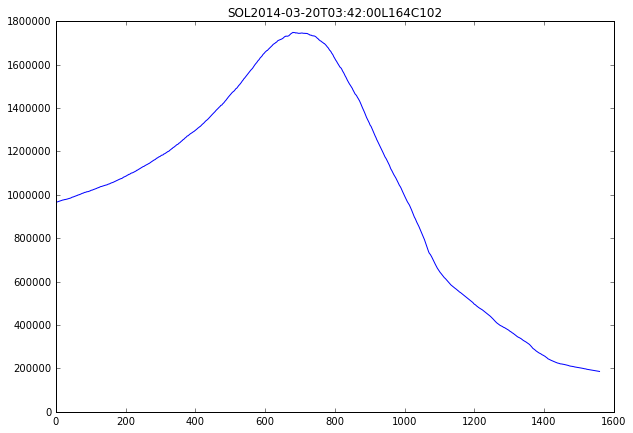

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-03-20T03:42:00L164C102
M1.4


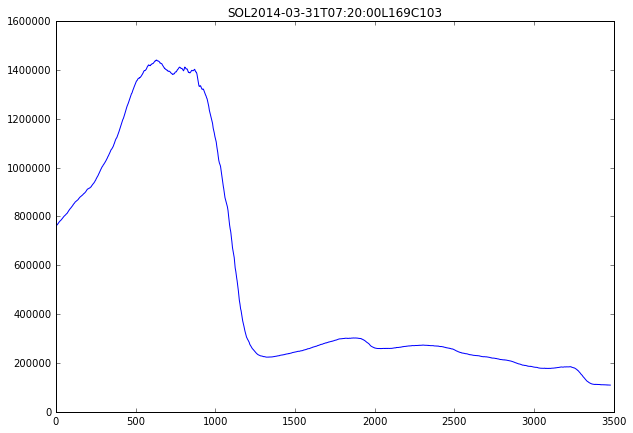

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-03-31T07:20:00L169C103
M6.5


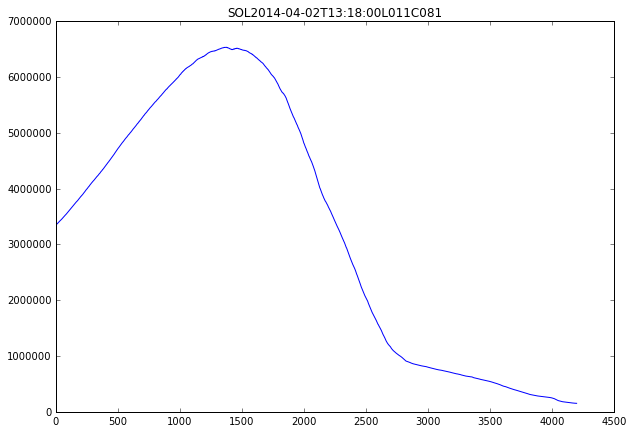

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-04-02T13:18:00L011C081
M7.3


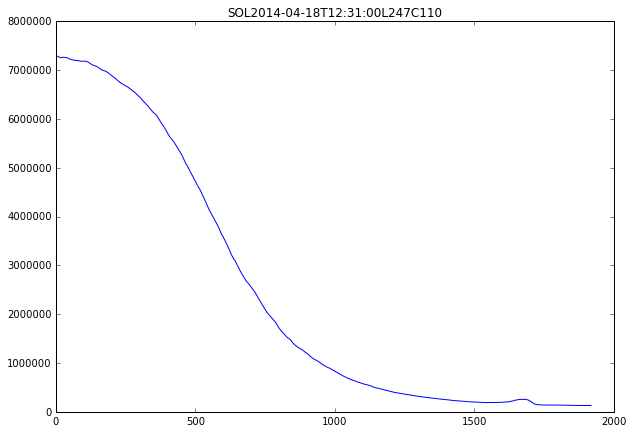

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
X1.5


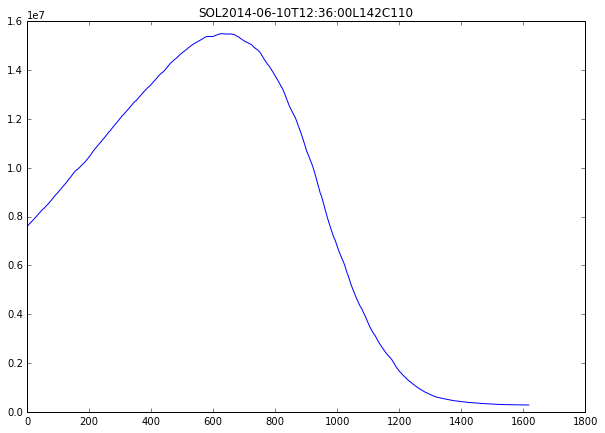

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-06-10T12:36:00L142C110
M3.1


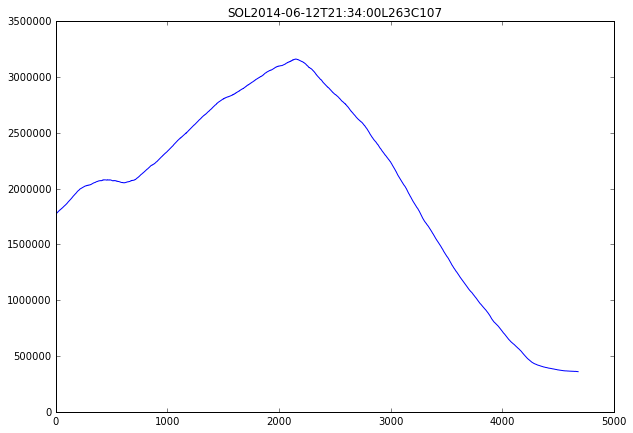

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-06-12T21:34:00L263C107
M1.1


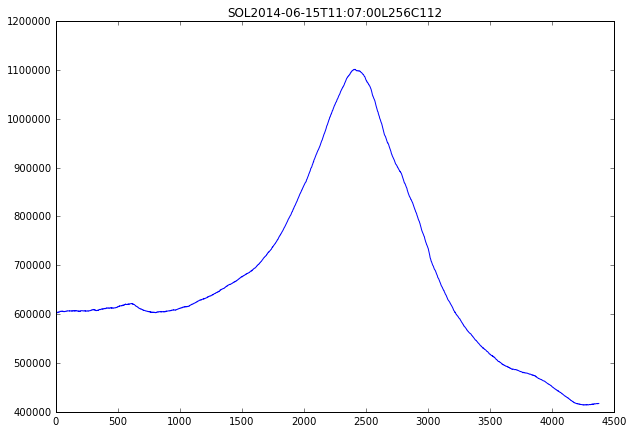

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-06-15T11:07:00L256C112
M1.1


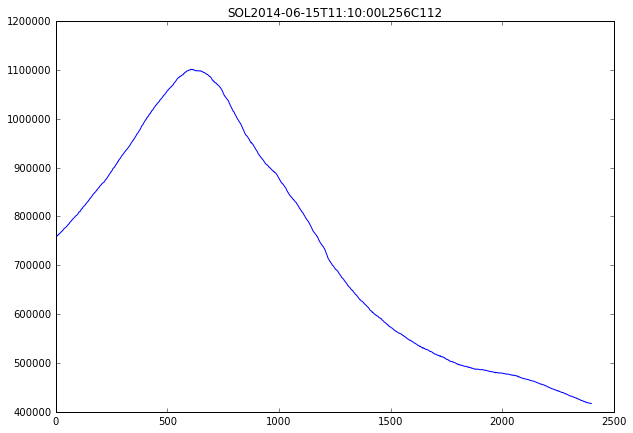

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-06-15T11:10:00L256C112
M1.0


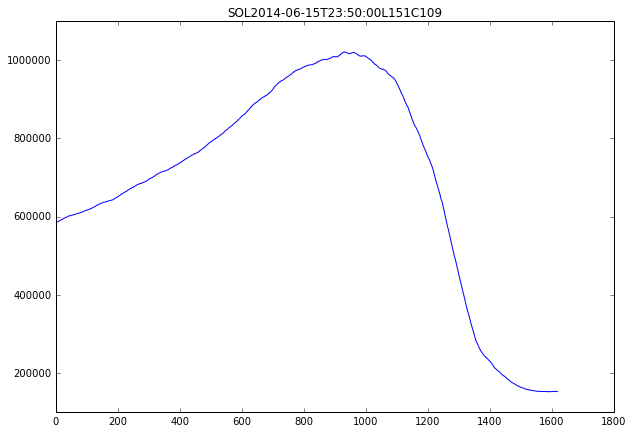

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-06-15T23:50:00L151C109
M1.4


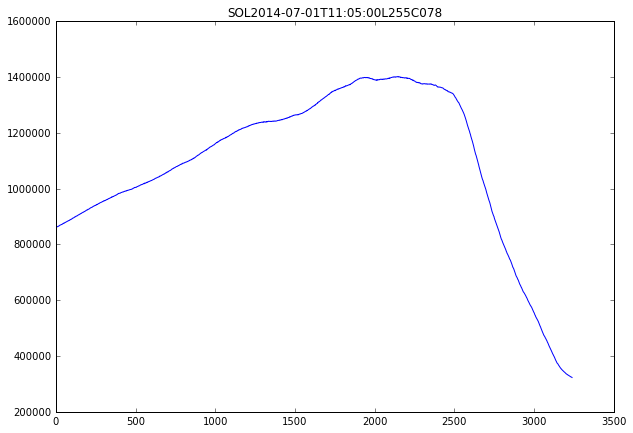

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-07-01T11:05:00L255C078
M1.5


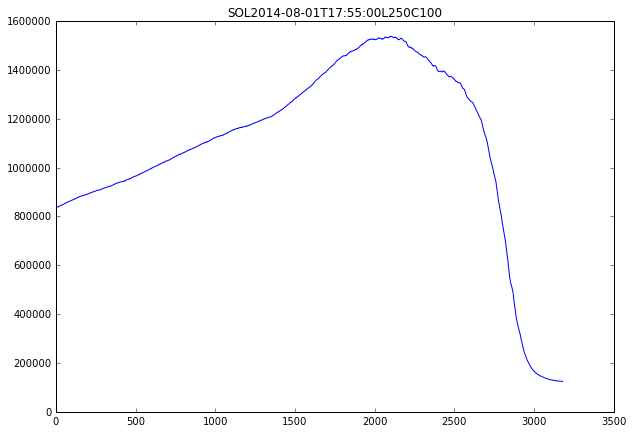

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-08-01T17:55:00L250C100
M5.9


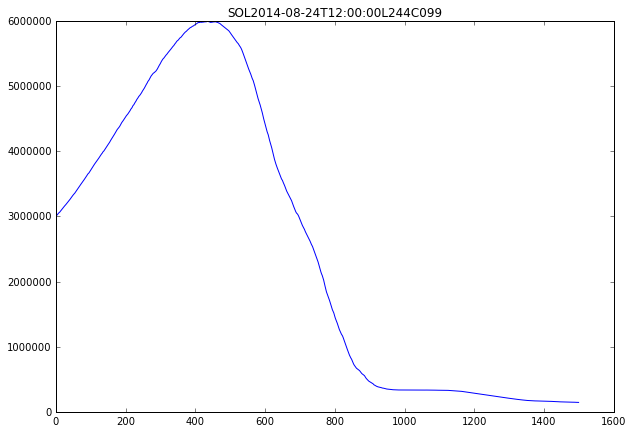

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-08-24T12:00:00L244C099
M2.0


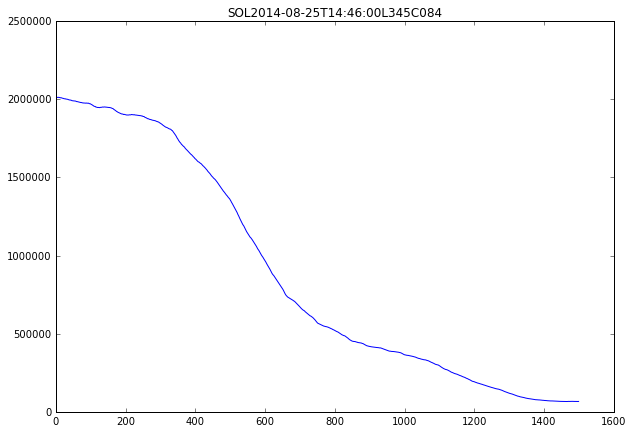

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M2.5


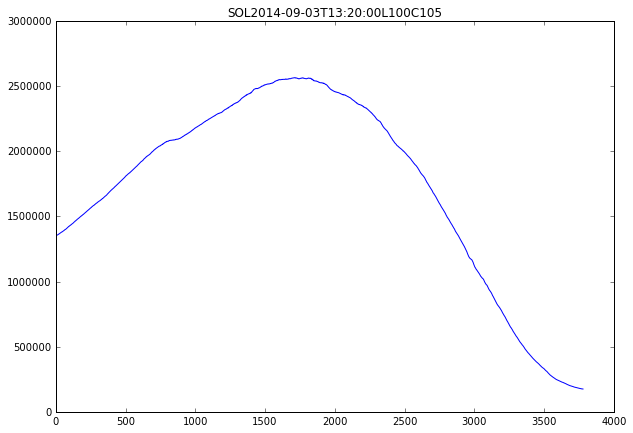

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-09-03T13:20:00L100C105
M1.1


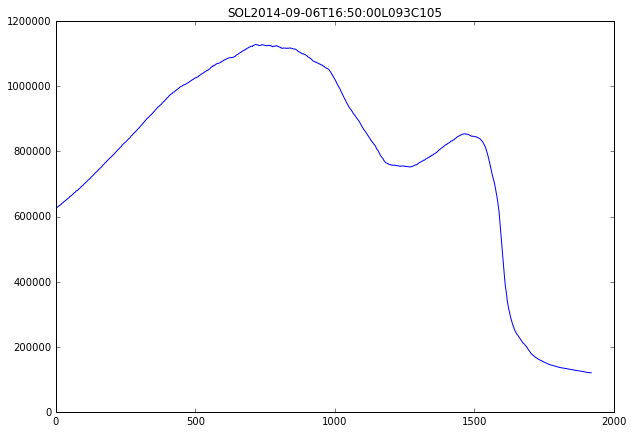

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-09-06T16:50:00L093C105
M4.5


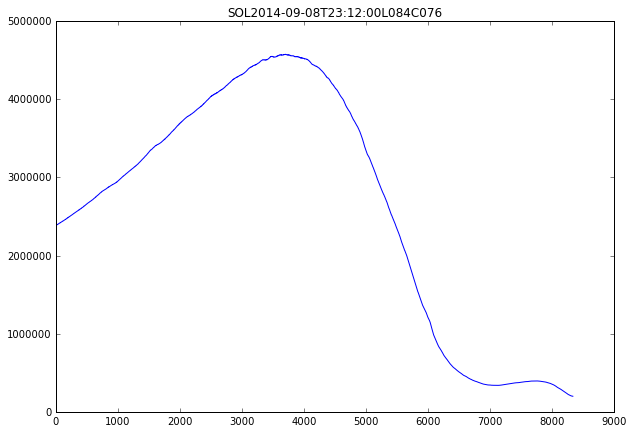

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-09-08T23:12:00L084C076
M1.4


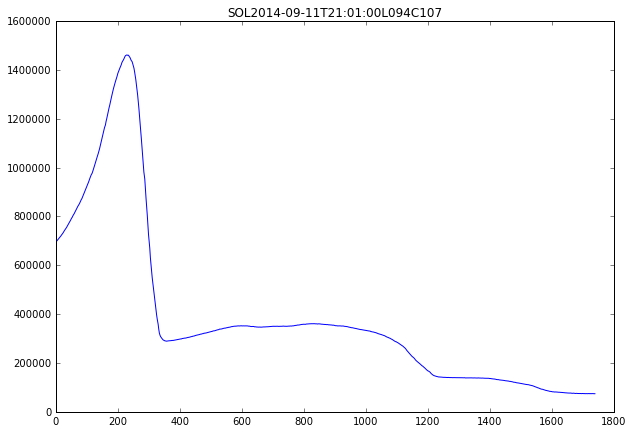

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-09-11T21:01:00L094C107
M1.4


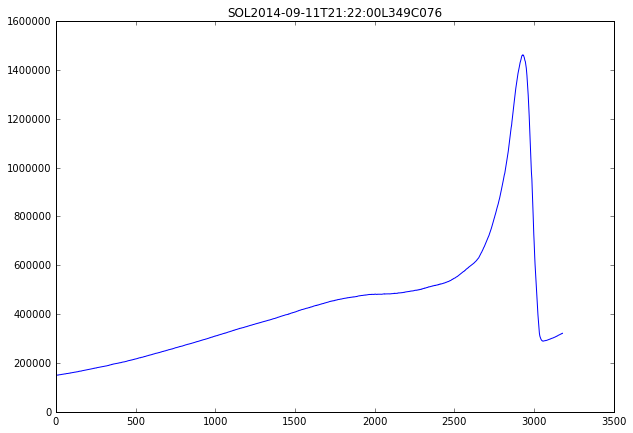

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-09-11T21:22:00L349C076
M1.5


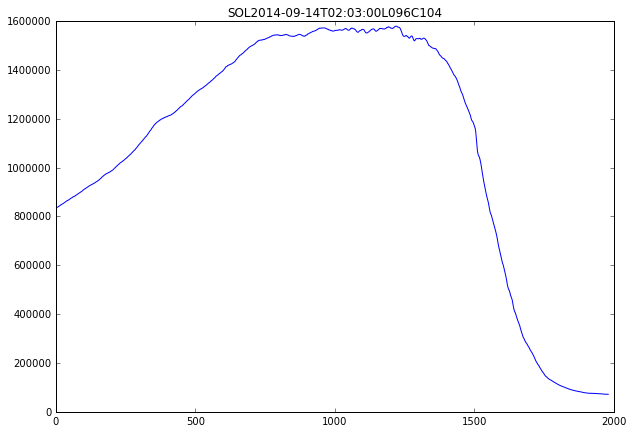

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-09-14T02:03:00L096C104
M2.3


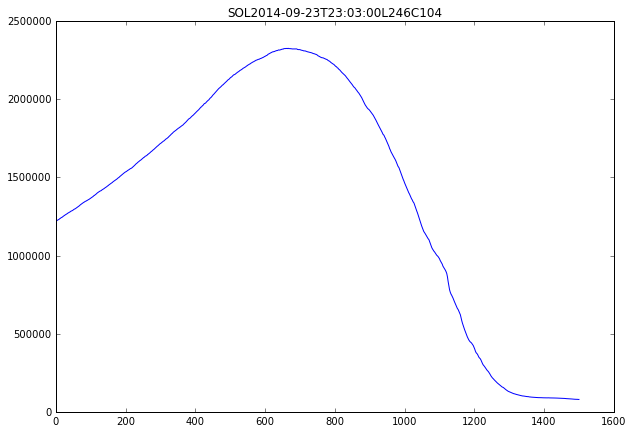

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-09-23T23:03:00L246C104
M1.1


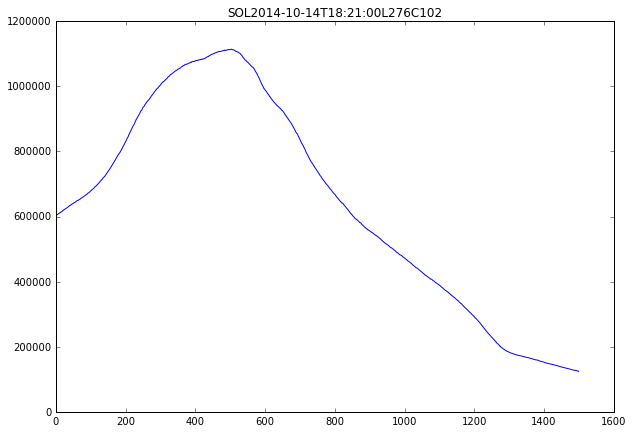

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-14T18:21:00L276C102
M2.3


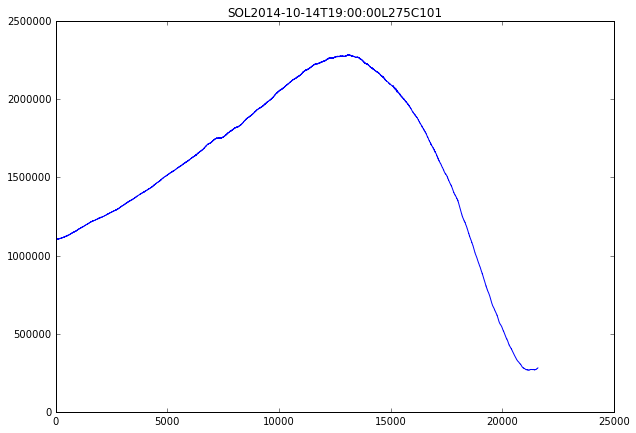

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-14T19:00:00L275C101
M2.2


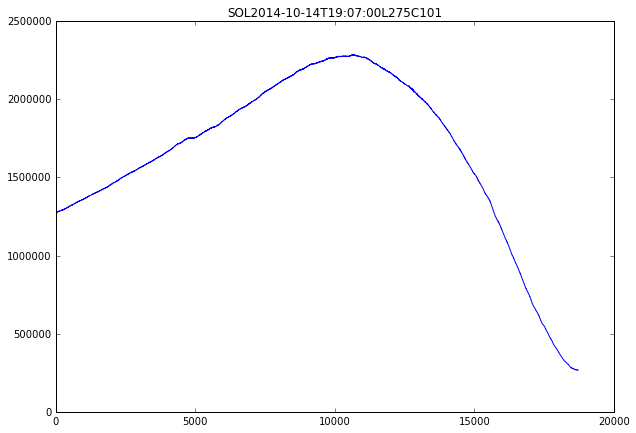

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-14T19:07:00L275C101
M1.6


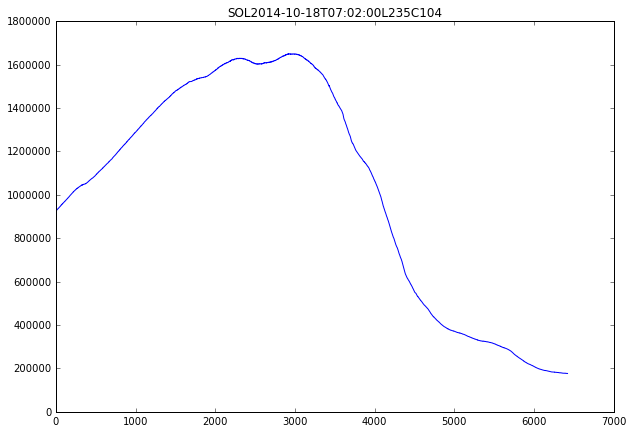

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-18T07:02:00L235C104
X1.1


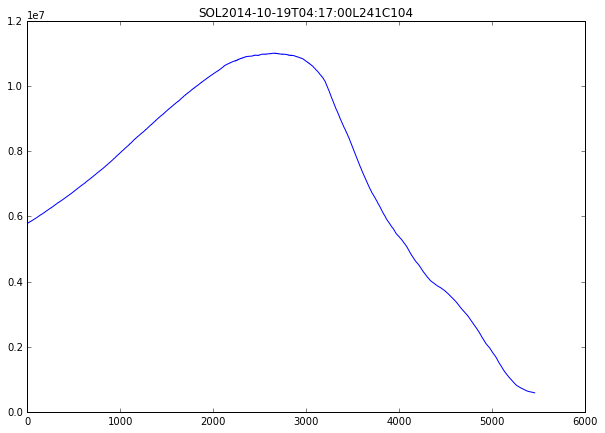

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-19T04:17:00L241C104
M4.5


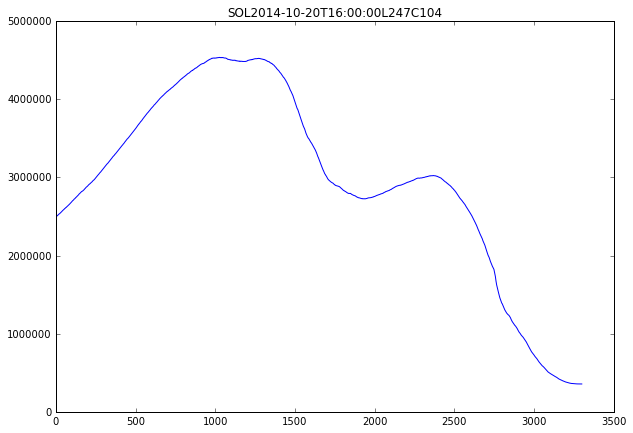

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-20T16:00:00L247C104
M1.2


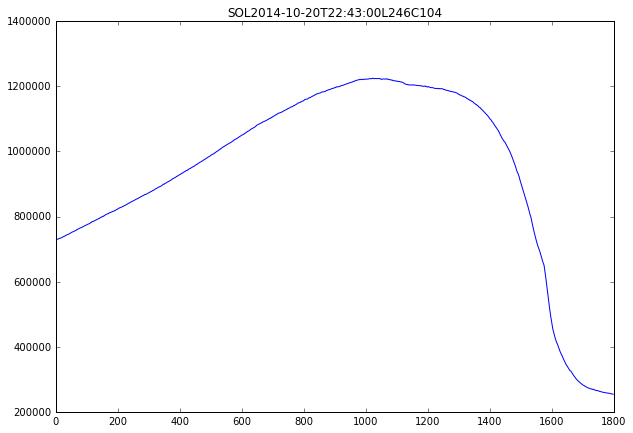

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-20T22:43:00L246C104
M8.7


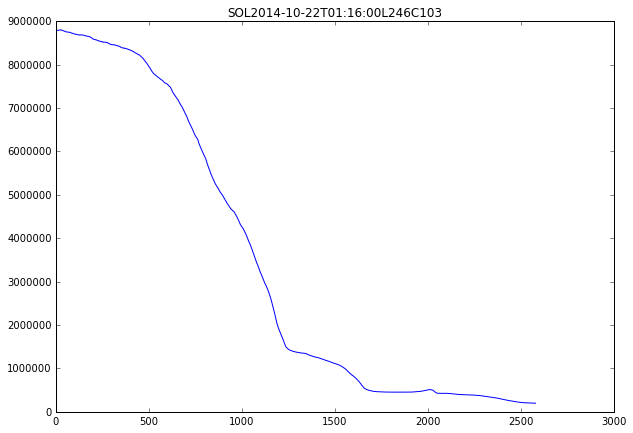

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
X1.6


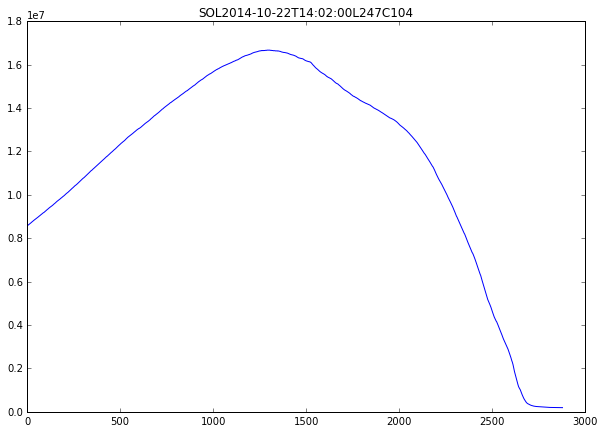

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-22T14:02:00L247C104
X3.1


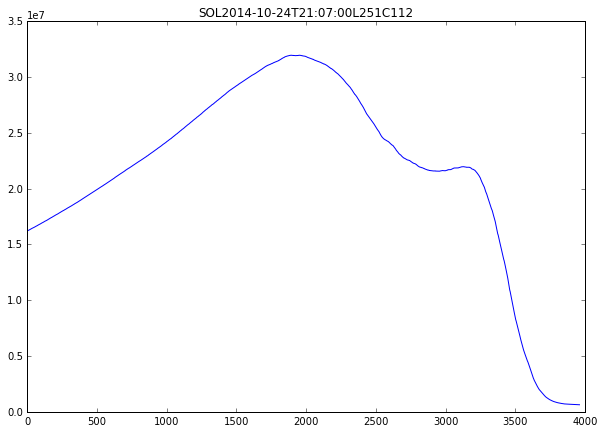

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-24T21:07:00L251C112
X2.0


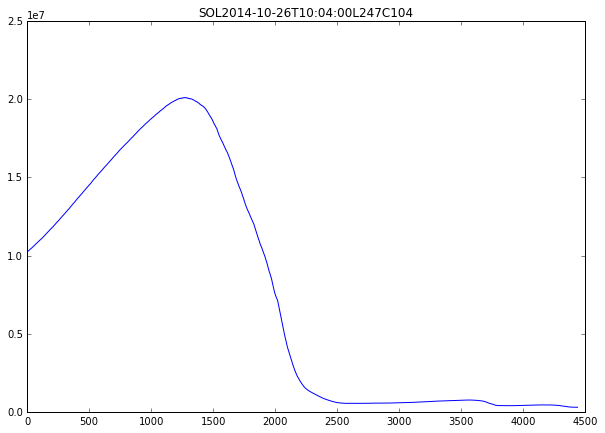

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-26T10:04:00L247C104
M2.4


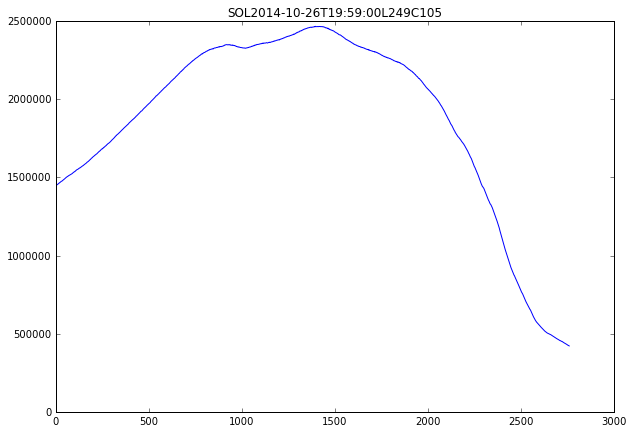

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-26T19:59:00L249C105
M7.1


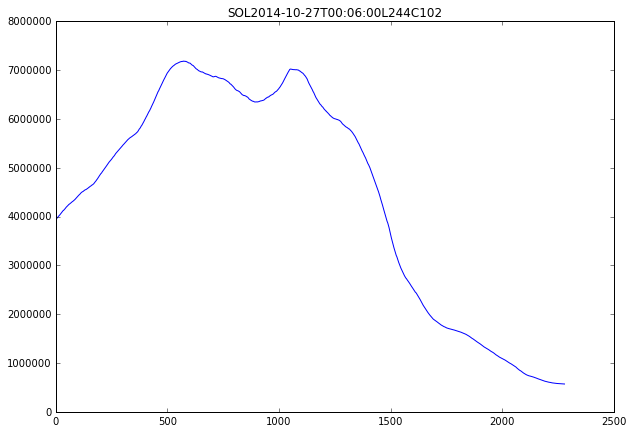

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-27T00:06:00L244C102
M1.0


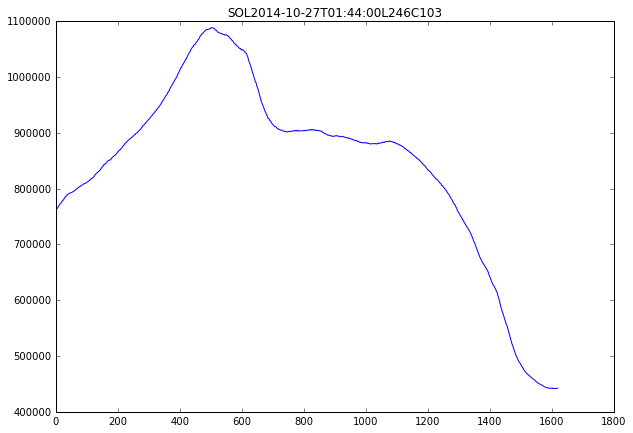

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-27T01:44:00L246C103
M6.7


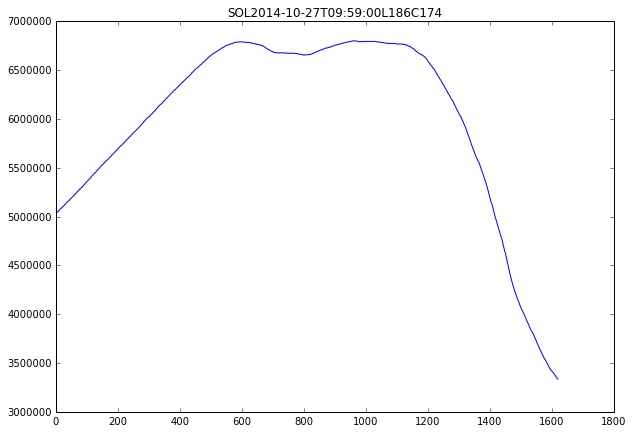

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-27T09:59:00L186C174
X2.0


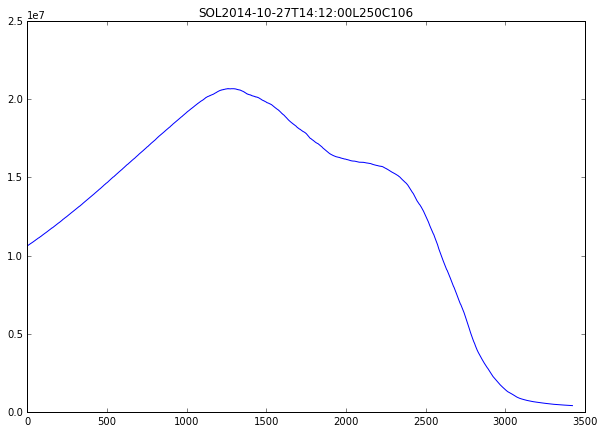

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-27T14:12:00L250C106
M3.4


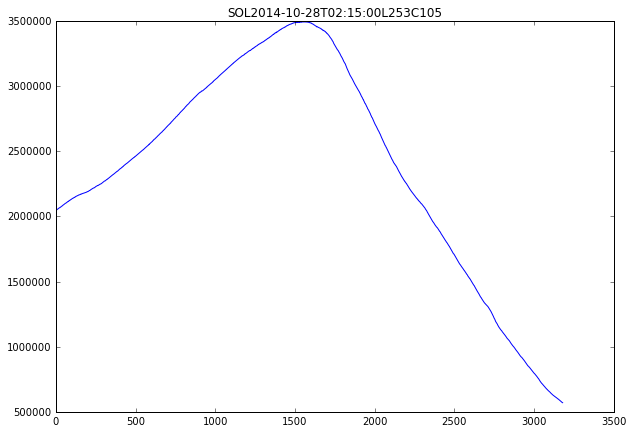

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-28T02:15:00L253C105
M1.6


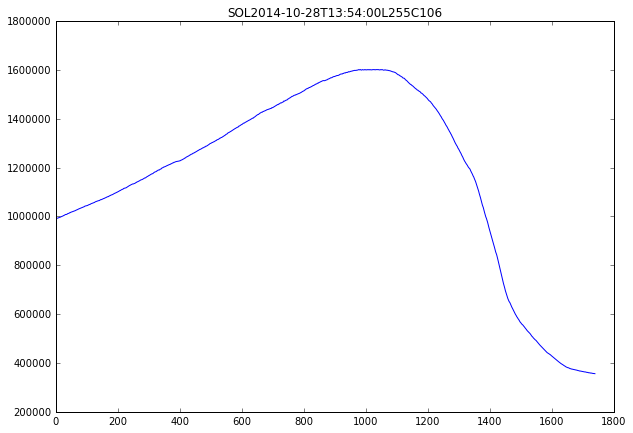

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-28T13:54:00L255C106
M1.6


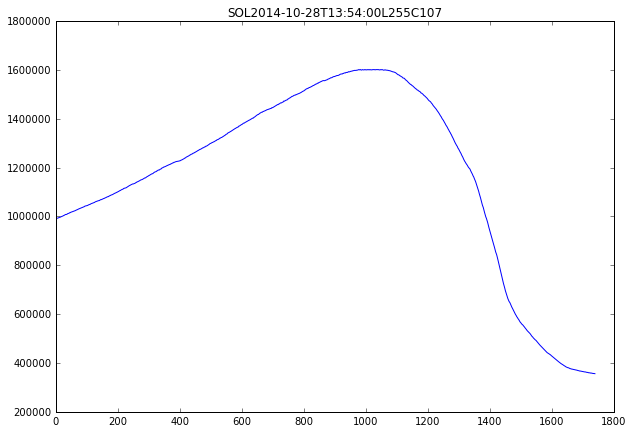

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-28T13:54:00L255C107
M1.0


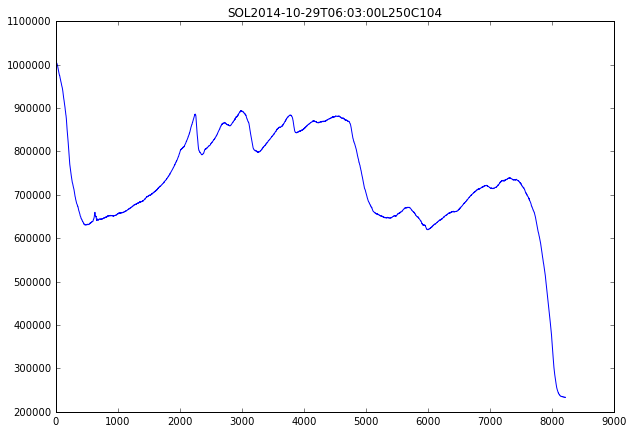

1-flare 
2-no flare 
3-duplicate 
Classify this event:2
M1.0


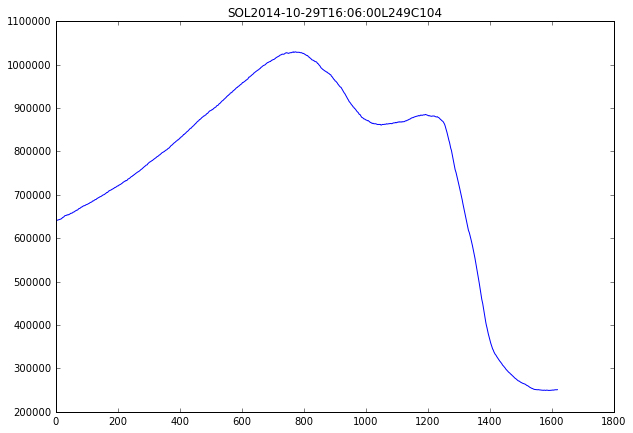

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-29T16:06:00L249C104
M3.5


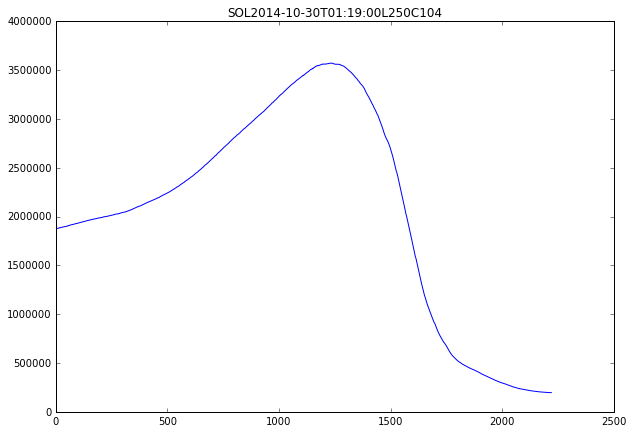

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-10-30T01:19:00L250C104
M2.2


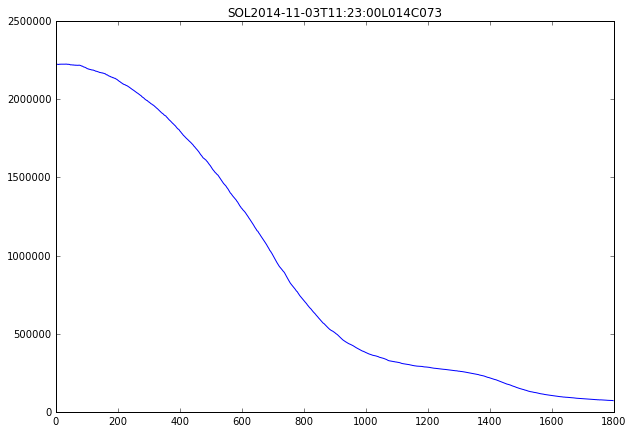

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M6.5


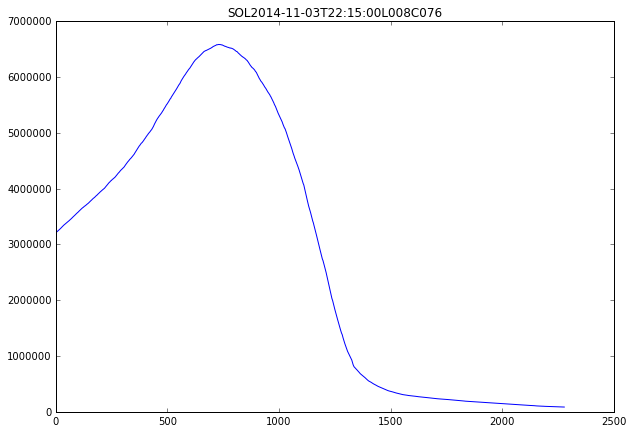

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-03T22:15:00L008C076
M2.6


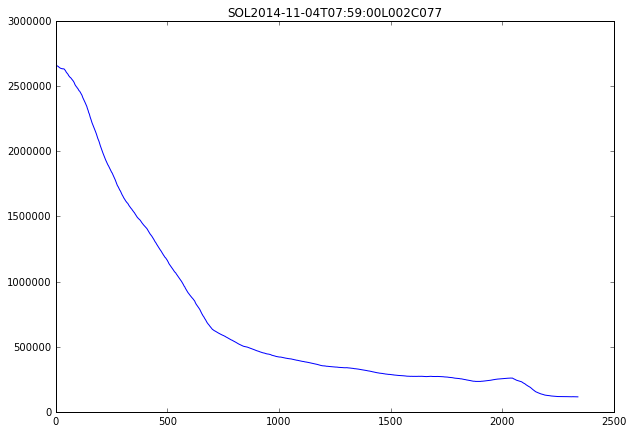

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M7.9


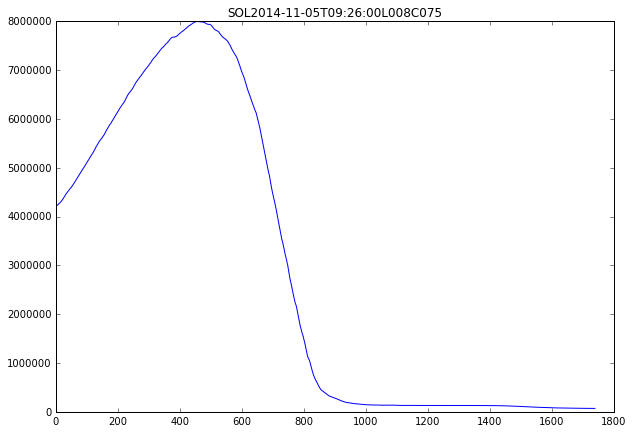

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-05T09:26:00L008C075
M3.0


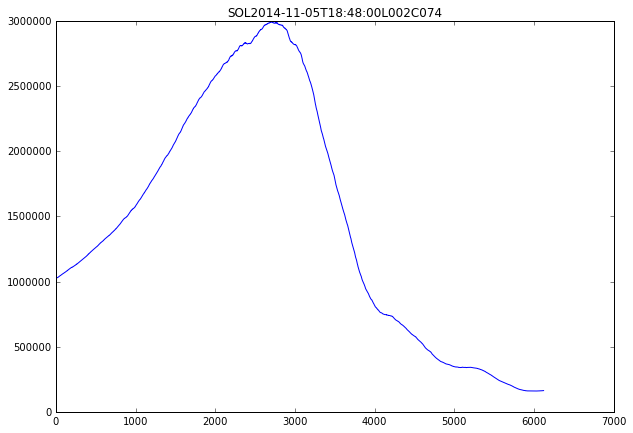

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-05T18:48:00L002C074
M2.9


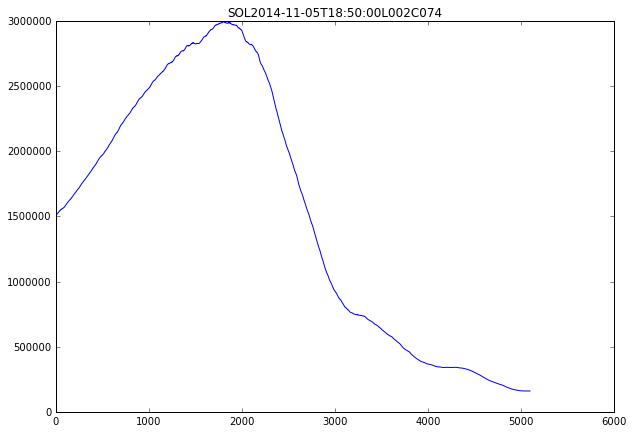

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-05T18:50:00L002C074
M3.2


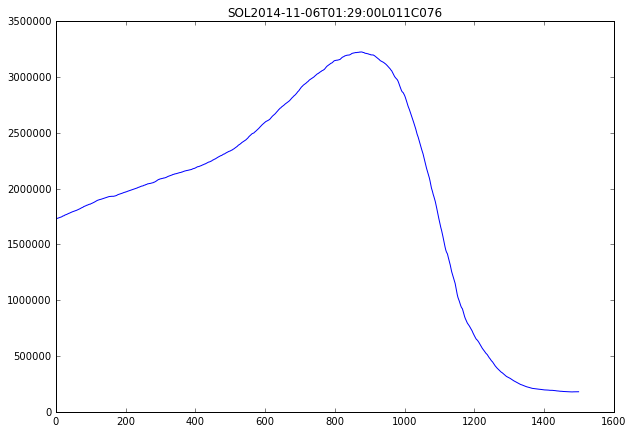

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-06T01:29:00L011C076
M5.4


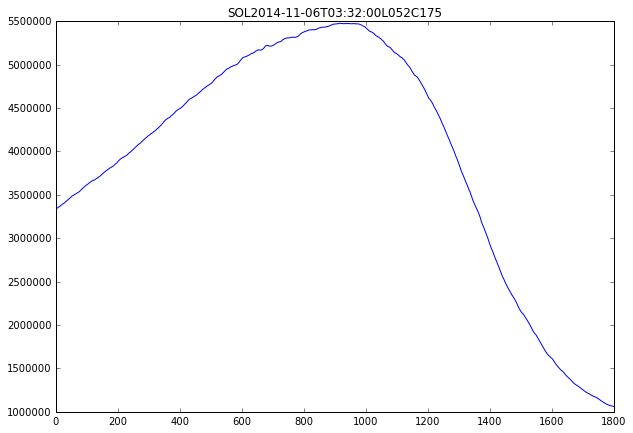

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-06T03:32:00L052C175
X1.6


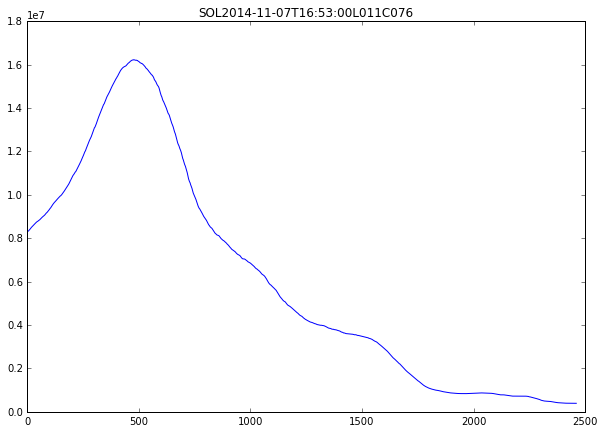

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-07T16:53:00L011C076
M3.2


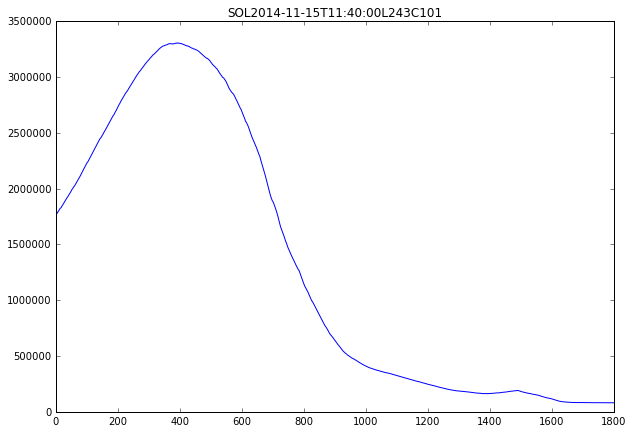

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-11-15T11:40:00L243C101
M1.8


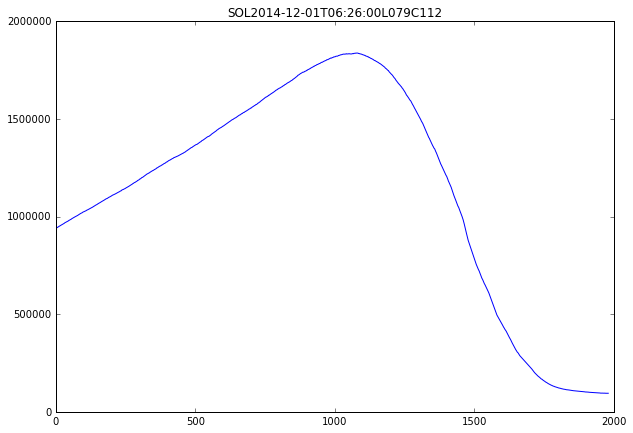

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-01T06:26:00L079C112
M6.1


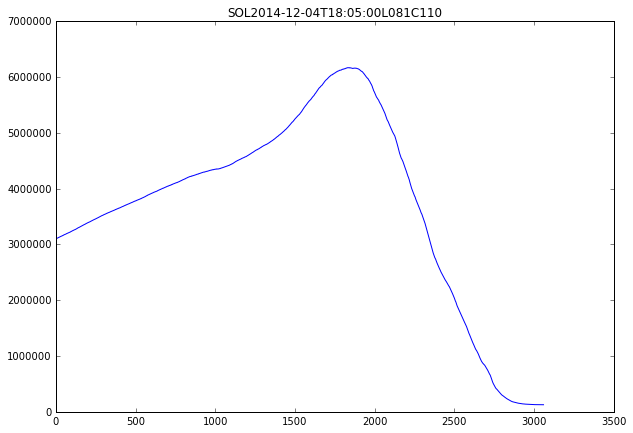

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-04T18:05:00L081C110
------
lc does not exist
SOL2014-12-05T11:33:00L082C113
------
------
lc does not exist
SOL2014-12-05T11:33:00L082C112
------
------
lc does not exist
SOL2014-12-05T11:33:00L081C111
------
M8.7


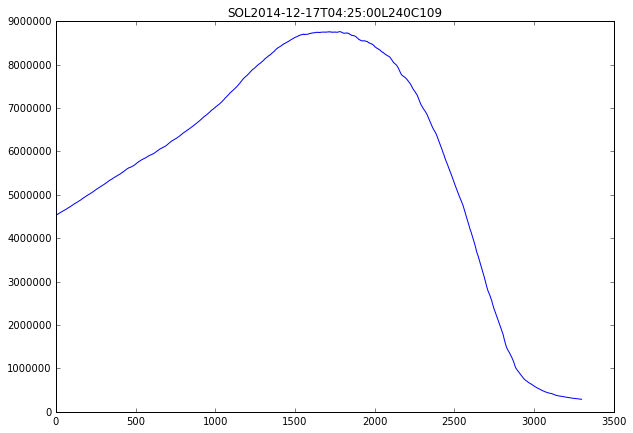

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-17T04:25:00L240C109
M8.7


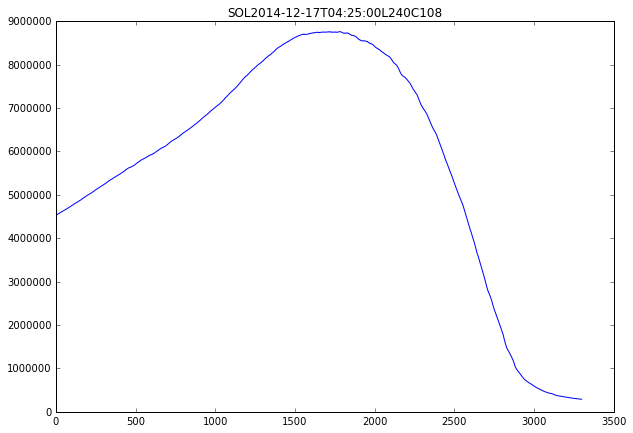

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-17T04:25:00L240C108
M8.7


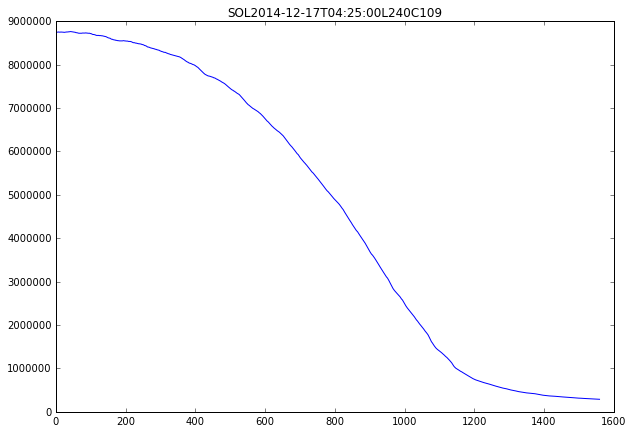

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M1.4


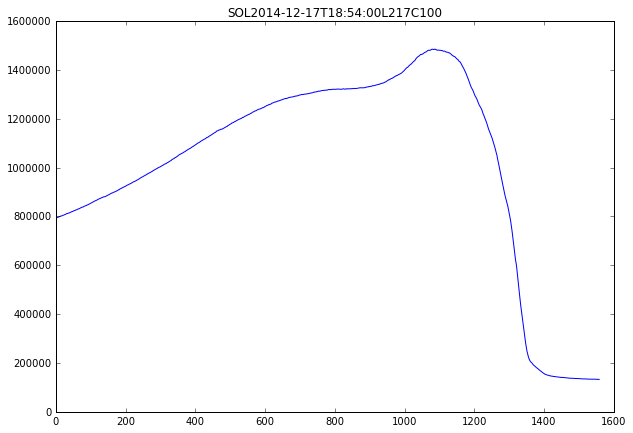

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-17T18:54:00L217C100
M6.9


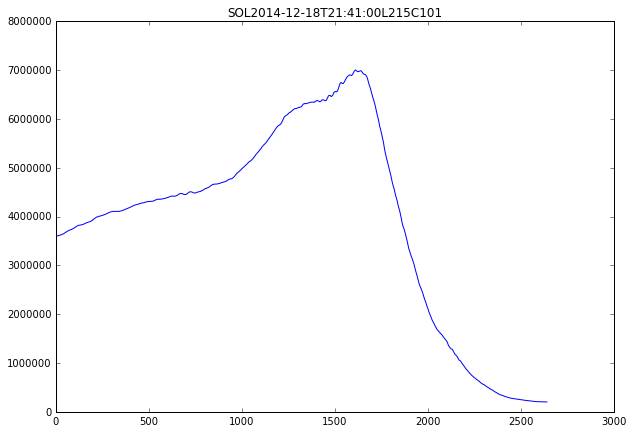

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-18T21:41:00L215C101
X1.8


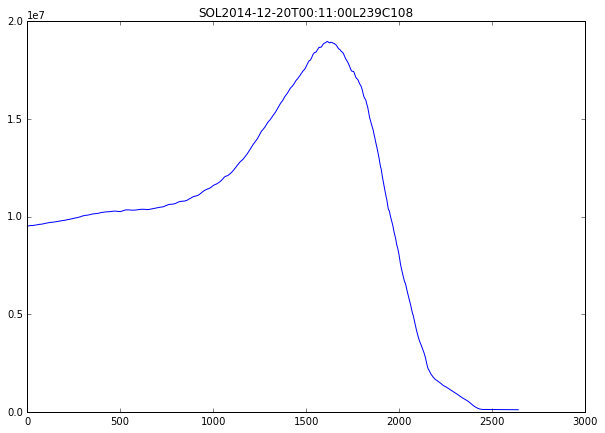

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-20T00:11:00L239C108
M1.0


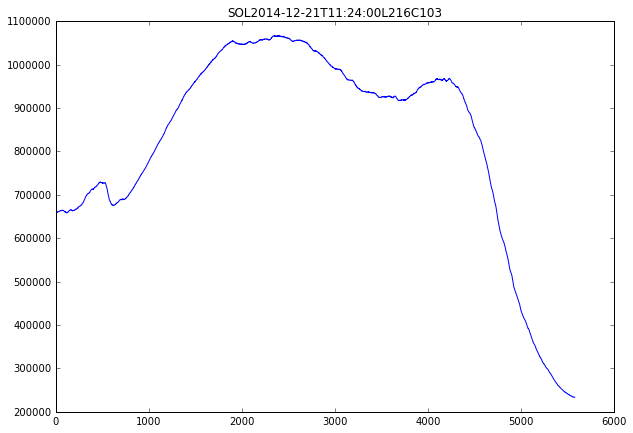

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-21T11:24:00L216C103
M1.0


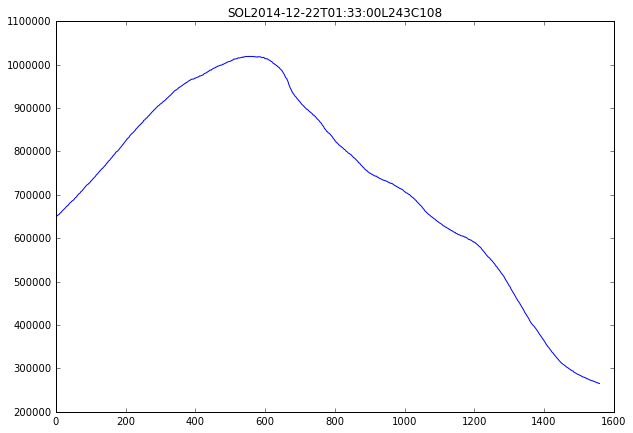

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2014-12-22T01:33:00L243C108
M1.3


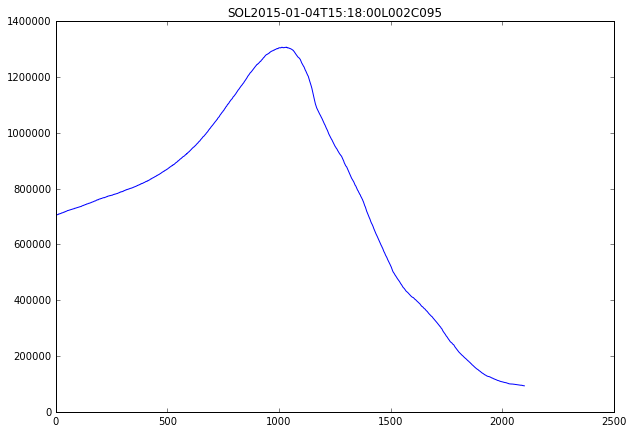

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-01-04T15:18:00L002C095
M5.6


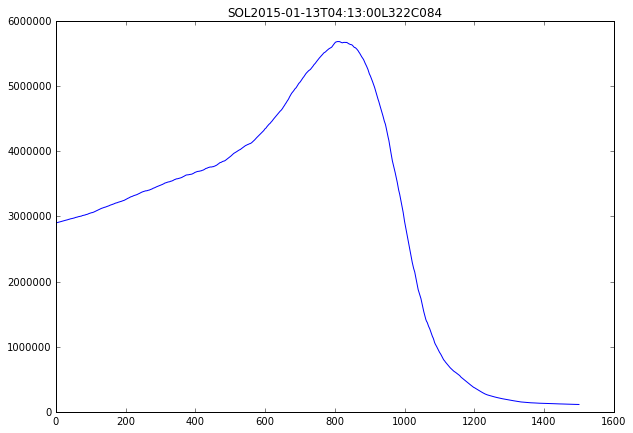

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-01-13T04:13:00L322C084
M2.2


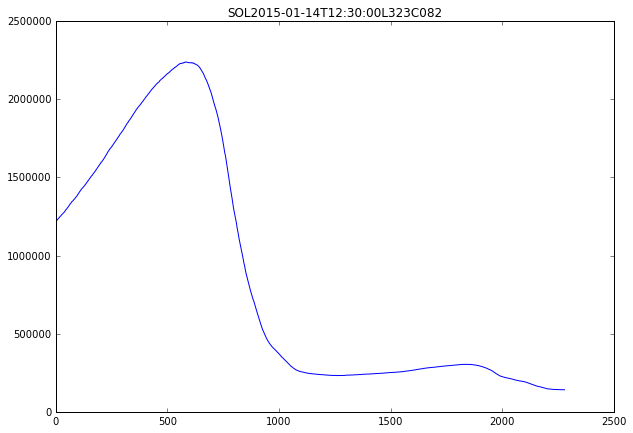

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-01-14T12:30:00L323C082
M1.7


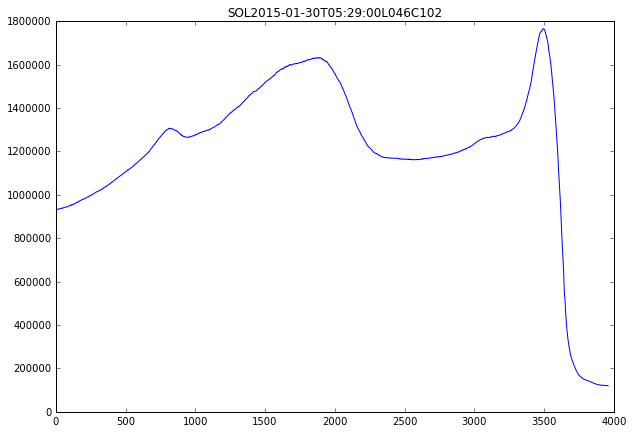

1-flare 
2-no flare 
3-duplicate 
Classify this event:2
M2.4


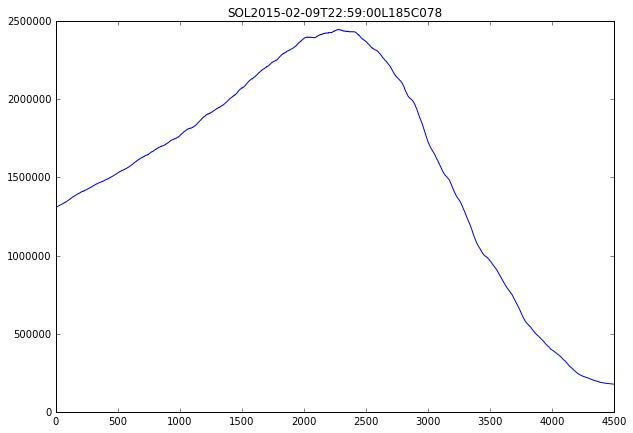

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-02-09T22:59:00L185C078
M1.2


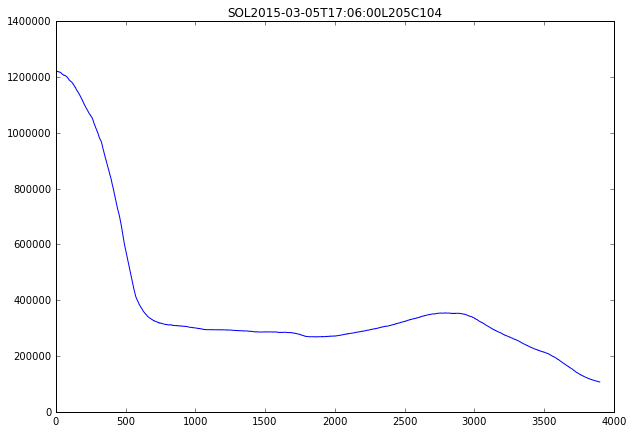

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M9.2


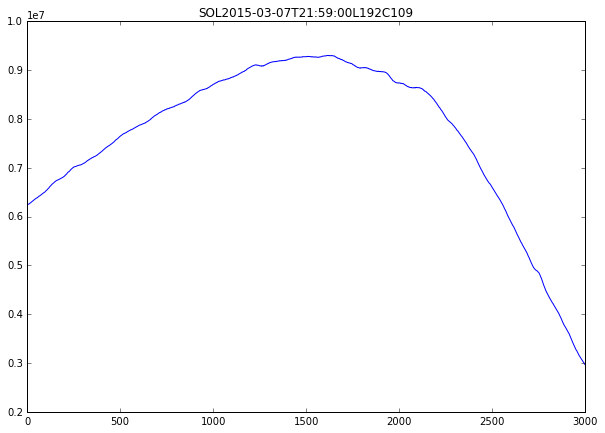

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-03-07T21:59:00L192C109
M1.8


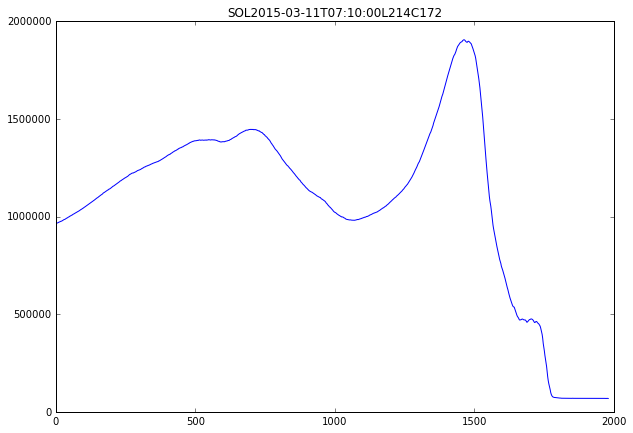

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-03-11T07:10:00L214C172
M1.2


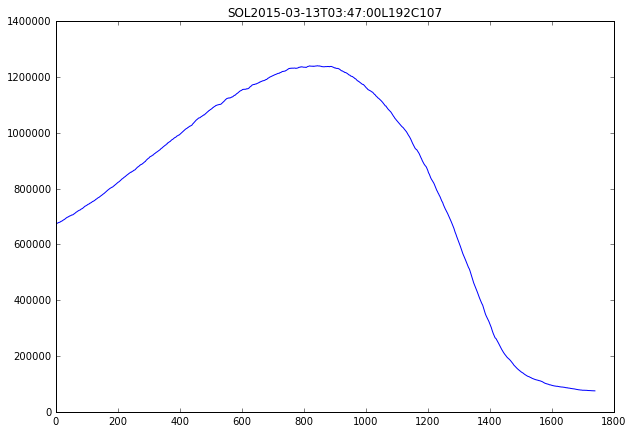

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-03-13T03:47:00L192C107
M1.2


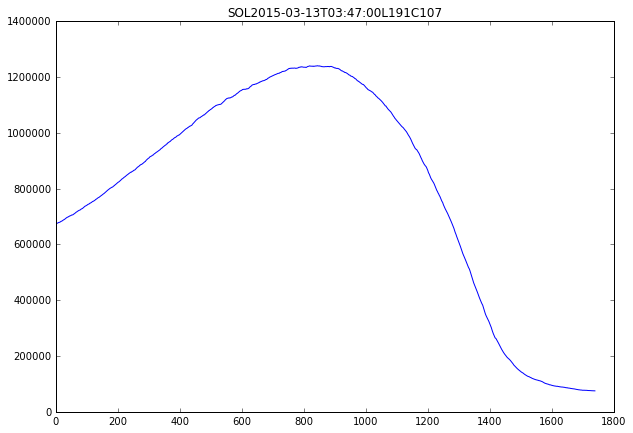

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-03-13T03:47:00L191C107
M1.3


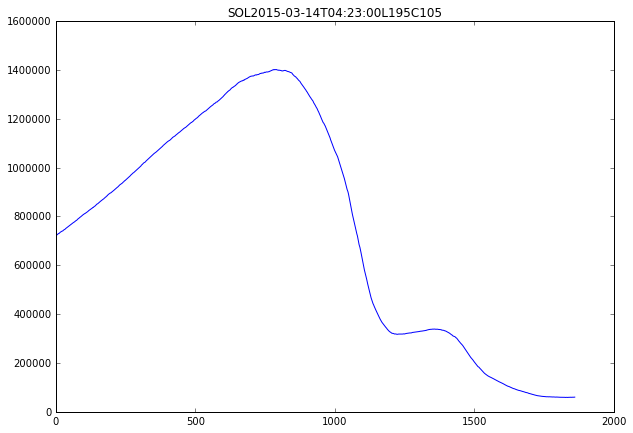

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-03-14T04:23:00L195C105
M1.2


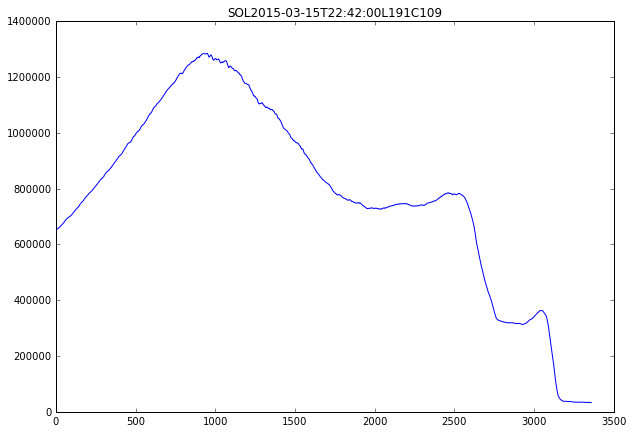

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-03-15T22:42:00L191C109
M1.0


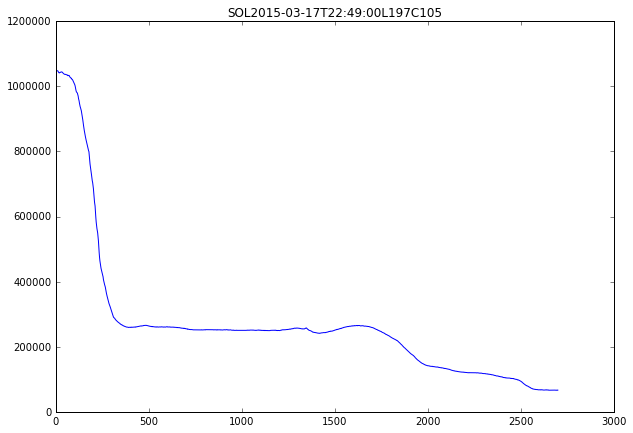

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M1.1


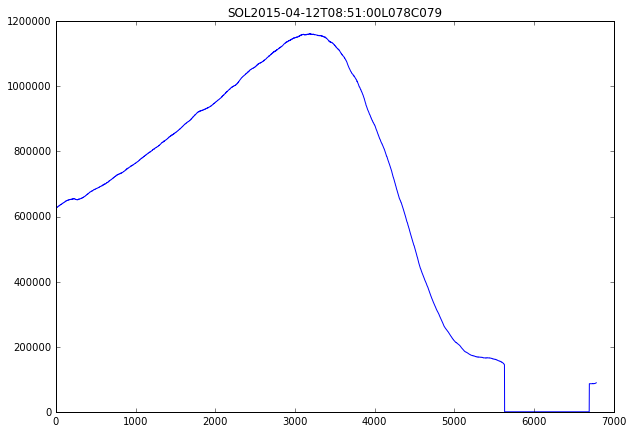

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-04-12T08:51:00L078C079
M2.2


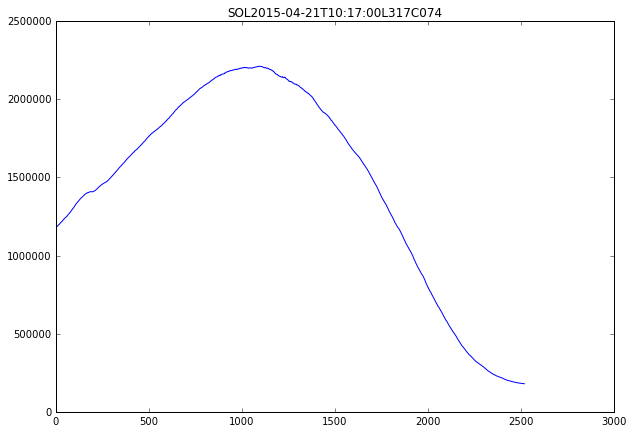

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-04-21T10:17:00L317C074
M4.0


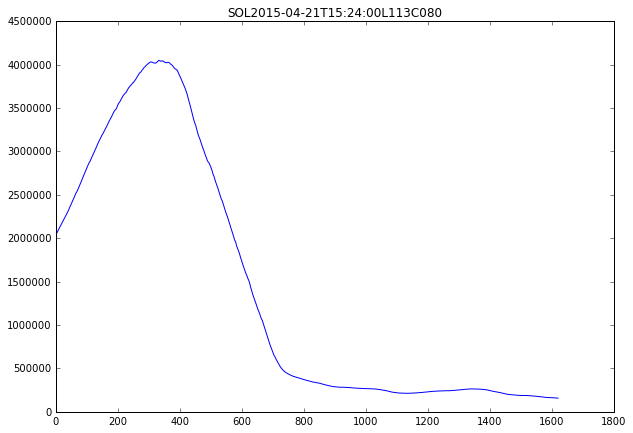

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-04-21T15:24:00L113C080
M1.1


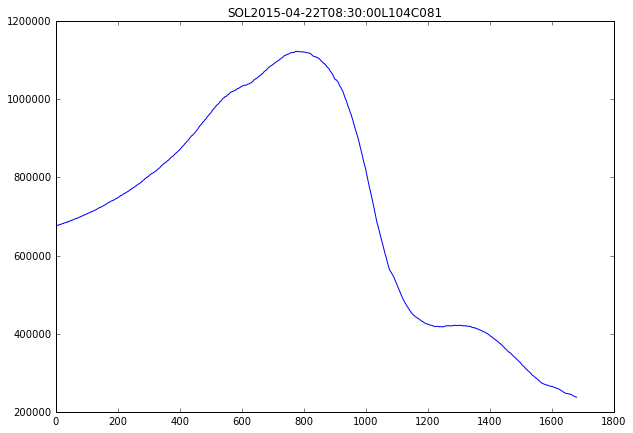

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-04-22T08:30:00L104C081
M1.1


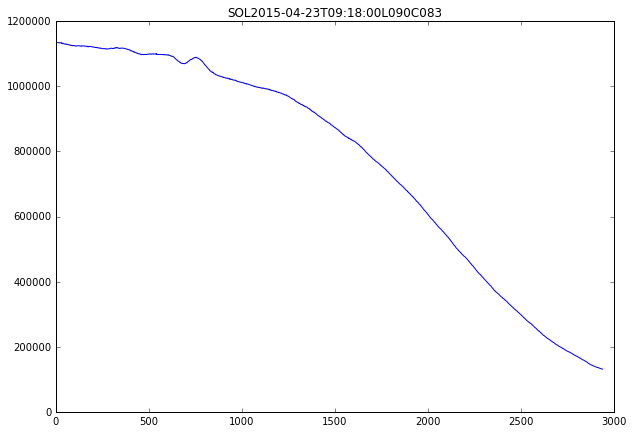

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M1.3


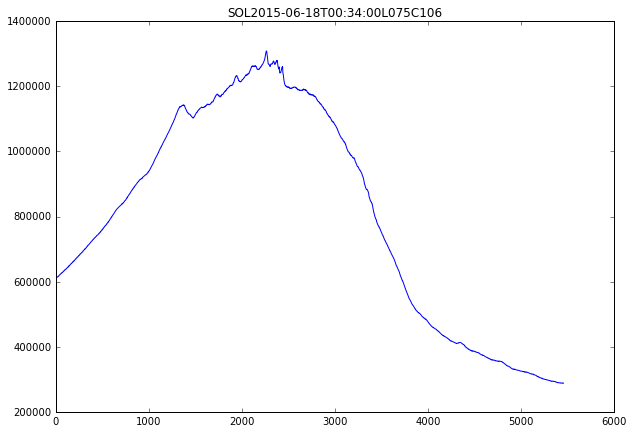

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-06-18T00:34:00L075C106
M3.1


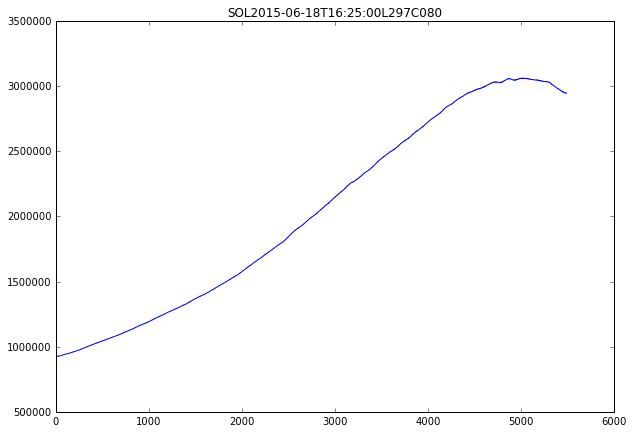

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-06-18T16:25:00L297C080
M3.0


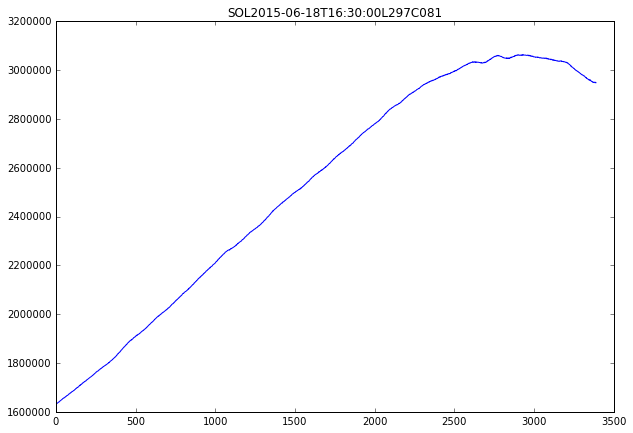

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-06-18T16:30:00L297C081
M1.0


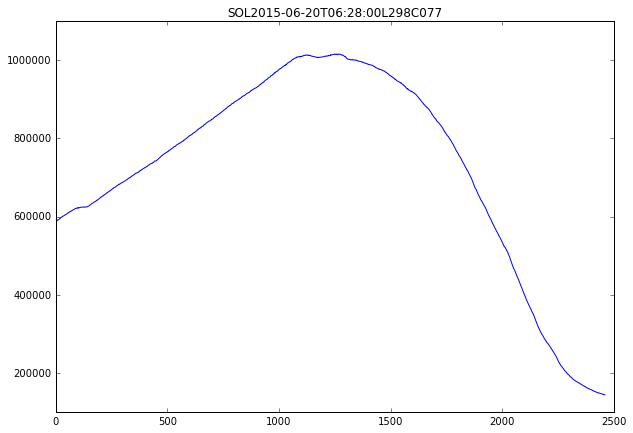

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-06-20T06:28:00L298C077
M2.0


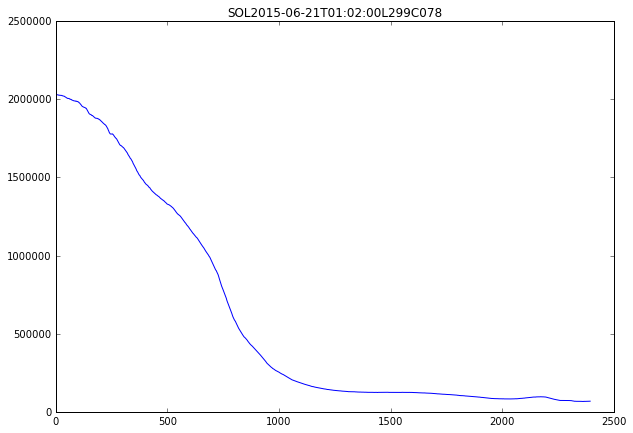

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M2.7


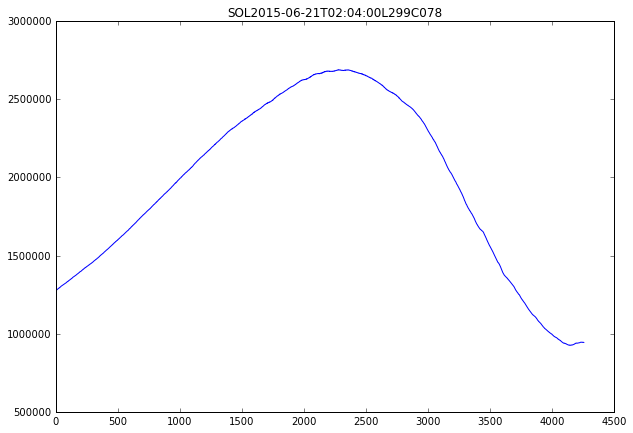

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-06-21T02:04:00L299C078
M6.5


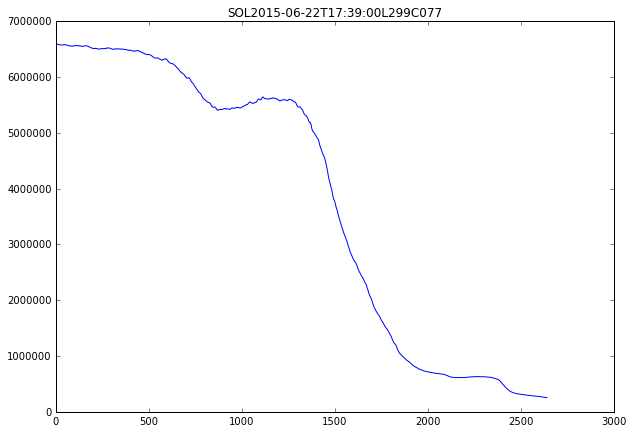

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M7.9


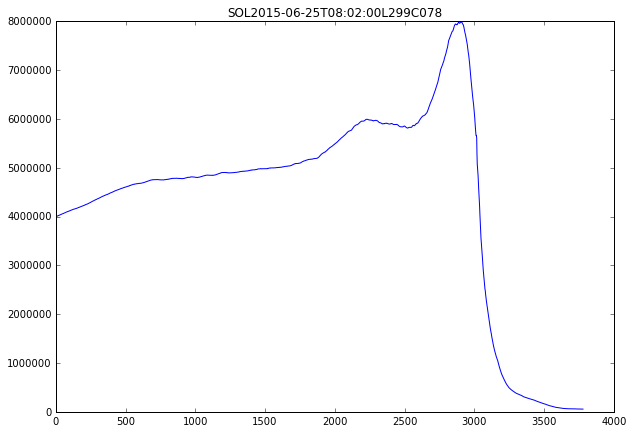

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-06-25T08:02:00L299C078
M1.2


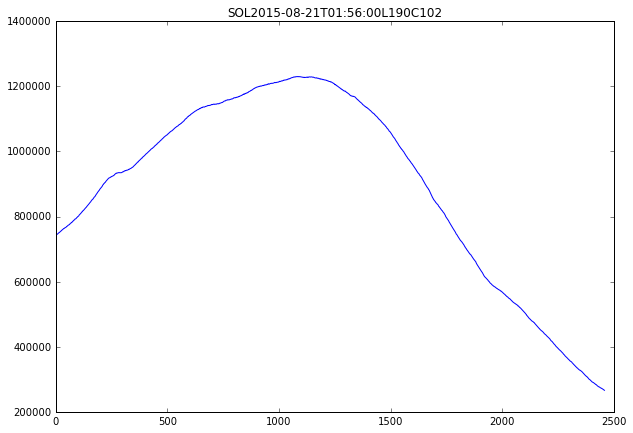

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-08-21T01:56:00L190C102
M1.4


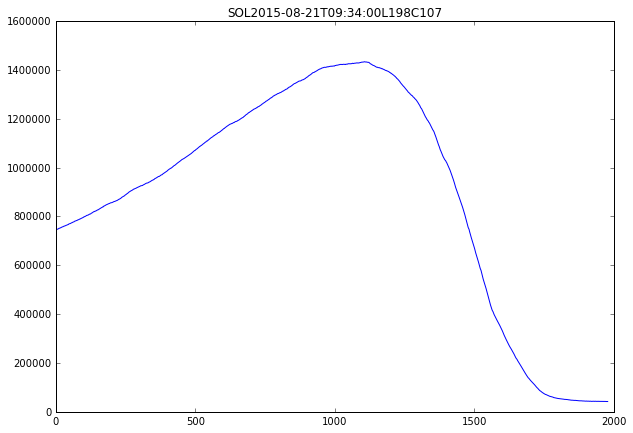

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-08-21T09:34:00L198C107
M1.1


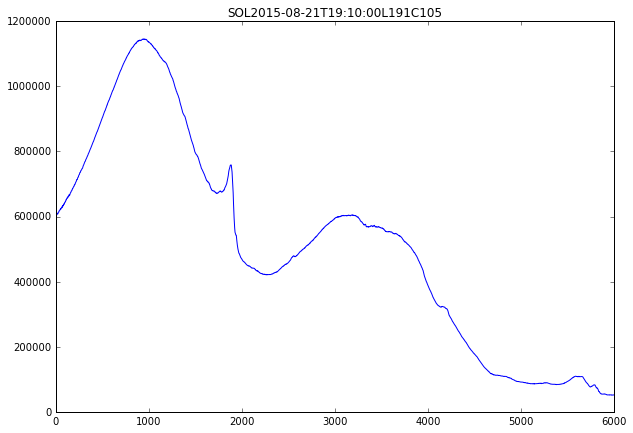

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-08-21T19:10:00L191C105
M2.9


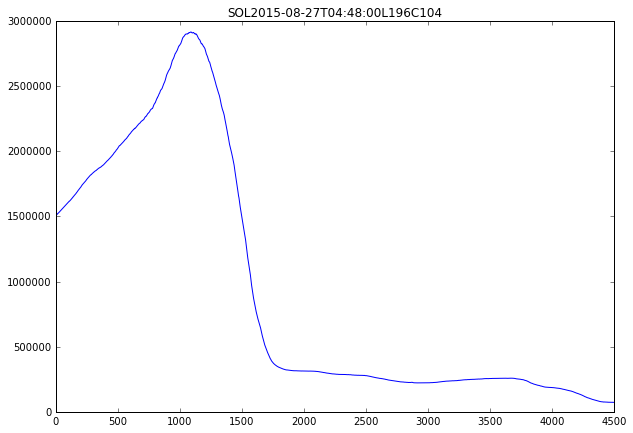

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-08-27T04:48:00L196C104
M1.4


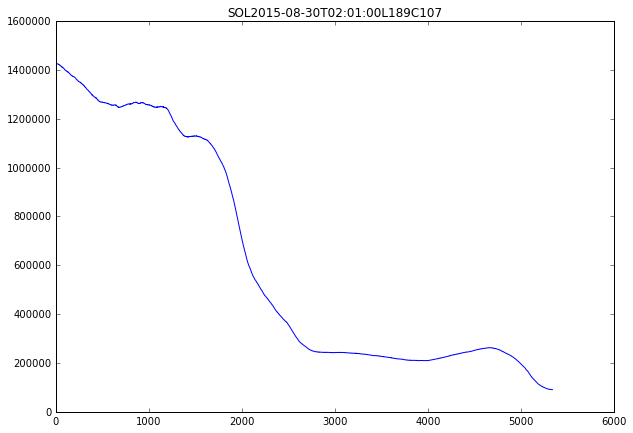

1-flare 
2-no flare 
3-duplicate 
Classify this event:5
M2.1


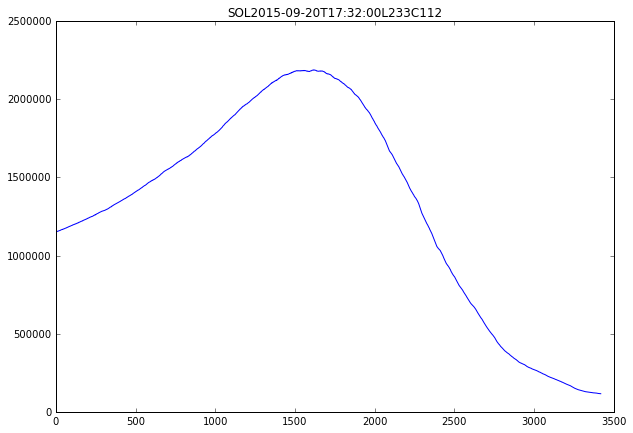

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-09-20T17:32:00L233C112
M1.9


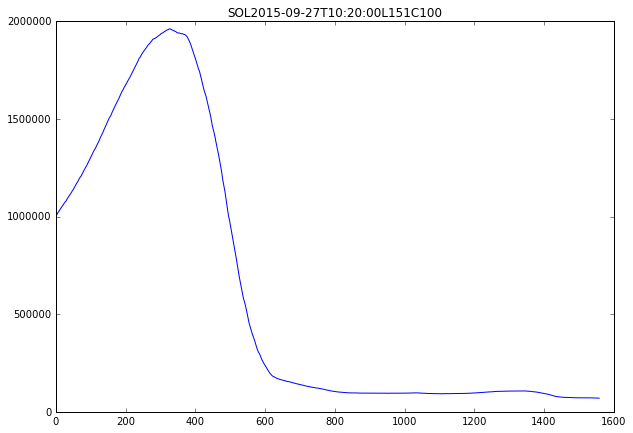

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-09-27T10:20:00L151C100
M1.1


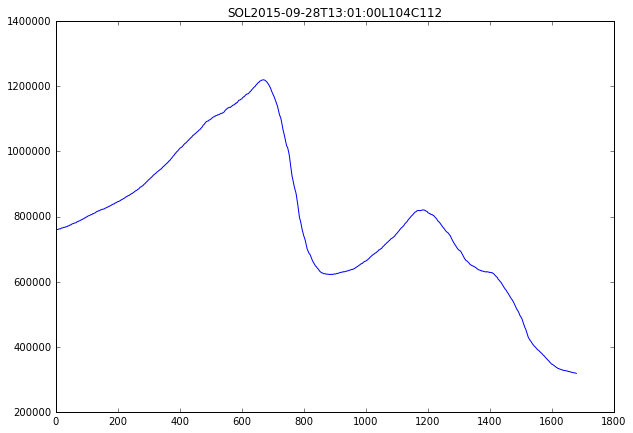

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-09-28T13:01:00L104C112
M1.1


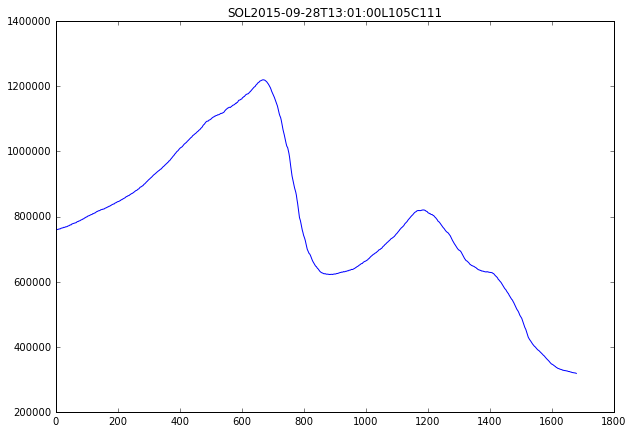

1-flare 
2-no flare 
3-duplicate 
Classify this event:3
M1.1


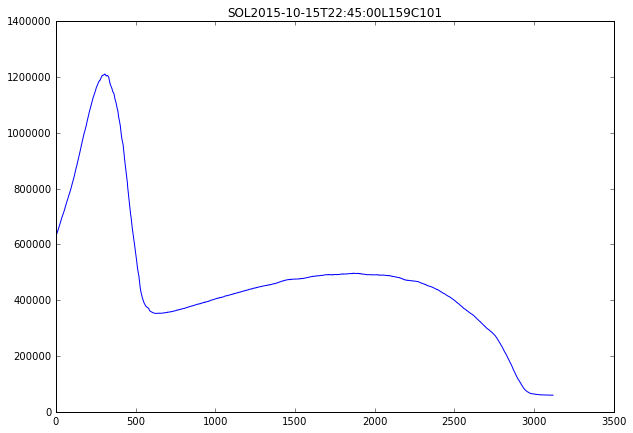

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-10-15T22:45:00L159C101
M3.7


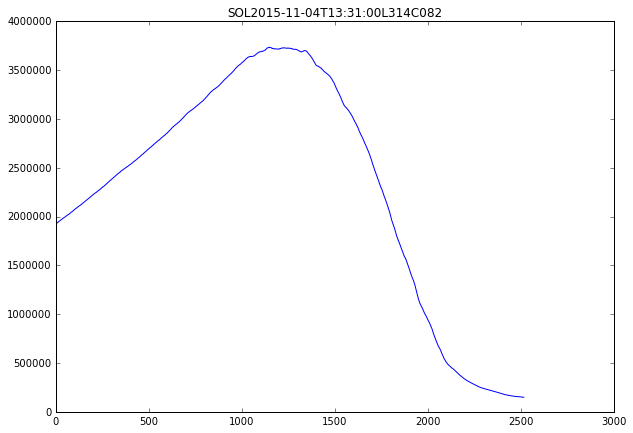

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-11-04T13:31:00L314C082
M3.9


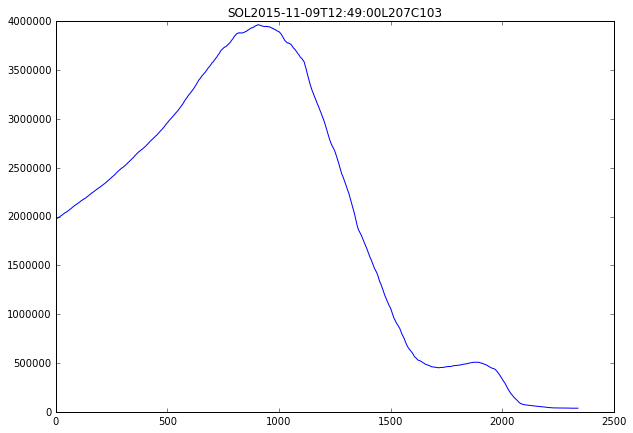

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-11-09T12:49:00L207C103
M1.6


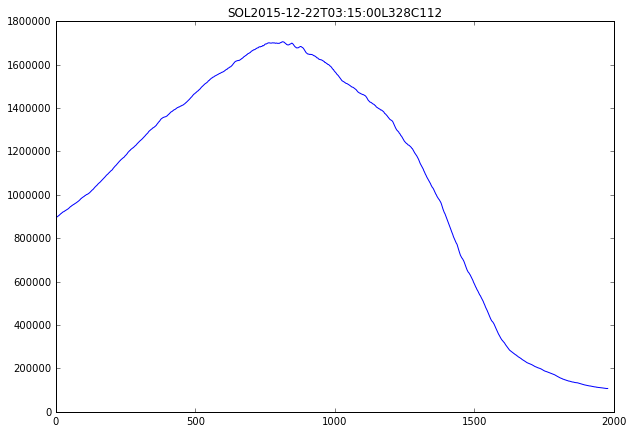

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-12-22T03:15:00L328C112
M4.7


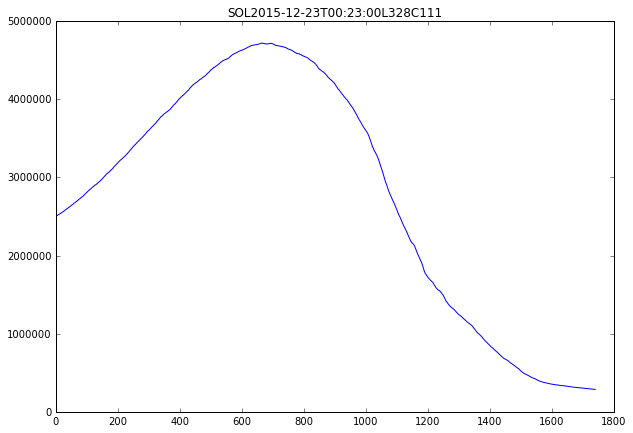

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2015-12-23T00:23:00L328C111
M2.4


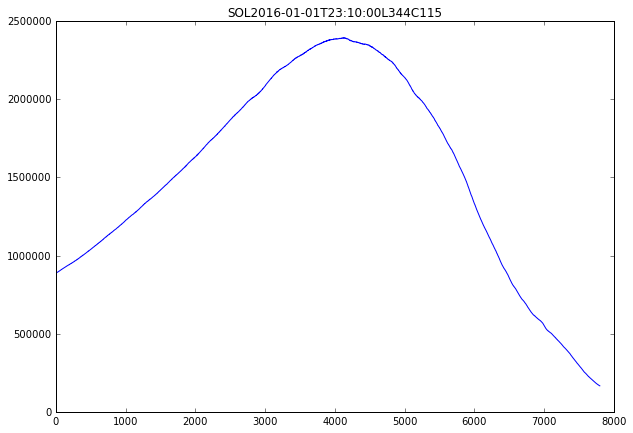

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2016-01-01T23:10:00L344C115
M1.1


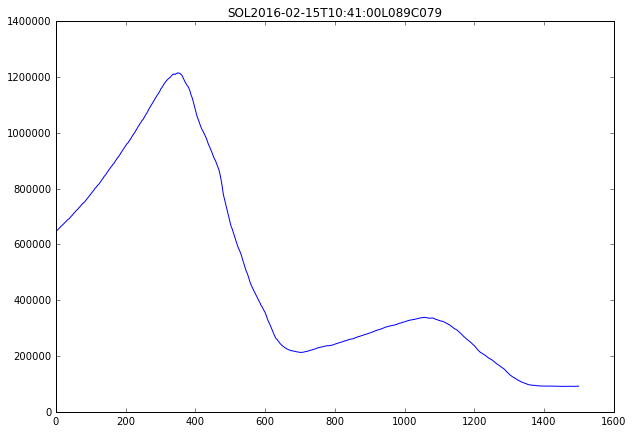

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2016-02-15T10:41:00L089C079
M6.7


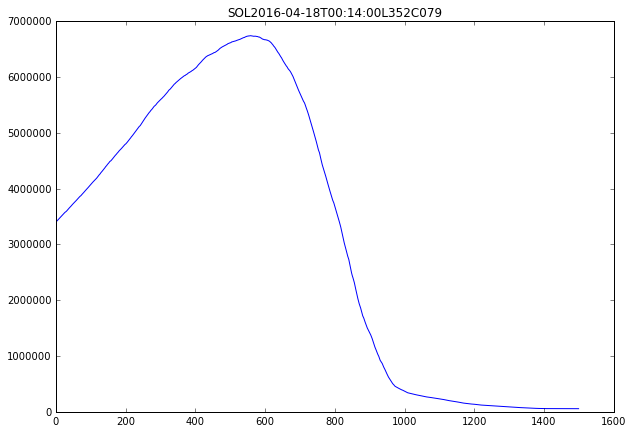

1-flare 
2-no flare 
3-duplicate 
Classify this event:1
SOL2016-04-18T00:14:00L352C079


In [37]:
dateparseT = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')

full = pd.read_csv('prepped_GOES3.csv', delimiter=',', header=0, 
                     parse_dates=['event_starttime', 'event_endtime'],date_parser=dateparseT)
full = full.ix[full['event_starttime']>=datetime.datetime(2011,3,1)]
duration = ((full['event_endtime'] - full['event_starttime'])*10**(-9))/(np.timedelta64(1, 'ns'))
full.loc[:,'duration_sec'] = duration
full = full.ix[full['duration_sec']>=1500]
full = full.ix[full['fl_peakflux_goes']>=10**6]
print full.shape[0]
none_list = [None for k in range(full.shape[0])]
full.loc[:, 'verdict'] = none_list
j=0

for start in full['event_starttime']:
    end = full['event_endtime'].values[j]
    lc = lightcurve_goes.ix[lightcurve_goes['date']>=start]
    lc = lc.ix[lc['date']<=end]
    if lc.shape[0]!=0:
        minutesX = (lc['date'].values[-1] - lc['date'])*10**(-9)/np.timedelta64(1, 'ns')
        lc['xrsb'] = lc['xrsb']*10**11
        print full['fl_goescls'].values[j]
        plt.figure(figsize = (10, 7))
        plt.title(full['SOL_standard'].values[j])
        plt.plot(minutesX, lc['xrsb'])
        plt.show()
        verdict = response_sequence()
        full['verdict'].values[j]  = verdict
        if verdict=='1': print full['SOL_standard'].values[j]
    if lc.shape[0]==0:
        print '------'
        print 'lc does not exist'
        print full['SOL_standard'].values[j]
        print '------'
    j+=1
    
full.to_csv('prepped_goes3_strong_events_classified.csv', index=False, date_format = '%Y-%m-%dT%X')

In [39]:
dateparseT = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')

full = pd.read_csv('prepped_goes3_strong_events_classified.csv', delimiter=',', header=0, 
                     parse_dates=['event_starttime', 'event_endtime'],date_parser=dateparseT)

full = full.ix[full['verdict']!=2]
full = full.ix[full['verdict']!=3]
j=0
none_list = [None for k in range(full.shape[0])]
full.loc[:,'revised_starttime'] = none_list
for start in full['event_starttime']:
    if full['verdict'].values[j] == 5:
        multiply = 1.5
    else: multiply=0.5
    full['revised_starttime'].values[j] = start - full['duration_sec'].values[j]*multiply*np.timedelta64(1, 's') 
    j+=1
        
full.to_csv('prepped_goes3_strong_events_classified_redone.csv', index=False, date_format = '%Y-%m-%dT%X')

In [52]:
dateparse3 = lambda x: pd.datetime.strptime(x, '%m-%d-%Y %H:%M:%S')
dateparse4 = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')

full = pd.read_csv('prepped_goes3_strong_events_classified_redone.csv', delimiter=',', header=0, 
                     parse_dates=['revised_starttime'],date_parser=dateparse4)
full.to_csv('prepped_goes3_strong_events_classified_redone.csv', index=False, date_format = '%Y-%m-%dT%X')

In [63]:
def add_lightcurves_for_all(events, lightcurve_goes, folder):
    len_events = events.shape[0]
    j = 0
    for elem in events['event_starttime']:
#         print '%d / % d' %(j+1, len_events)
        endtime = elem + events['duration_sec'].values[j]*20*np.timedelta64(1,'s')
        lightcurve_search = lightcurve_goes.ix[lightcurve_goes['date']>=elem]
        lightcurve_search = lightcurve_search.ix[lightcurve_search['date']<=endtime]

        if lightcurve_search.shape[0] == 0:
            print events['SOL_standard'].values[j]
                
        j+=1

In [61]:
dateparse4 = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')

full = pd.read_csv('prepped_GOES4.csv', delimiter=',', header=0, 
                     parse_dates=['event_starttime', 'event_endtime'],date_parser=dateparse4)

full.loc[:,'duration_sec'] = (full['event_endtime']-full['event_starttime'])*10**(-9)/np.timedelta64(1,'ns')

In [1]:
add_lightcurves_for_all(full, lightcurve_goes, 'goes_event_lcs2')

NameError: name 'add_lightcurves_for_all' is not defined

SOL2011-03-07T13:45:00L090C079


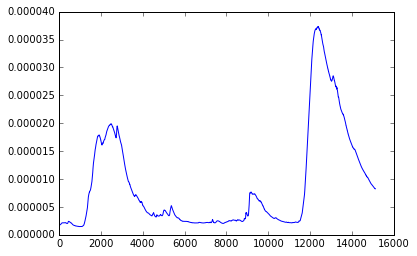

SOL2011-03-07T19:43:00L156C060


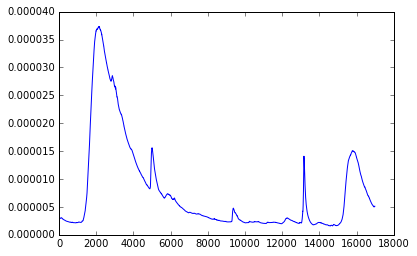

SOL2011-03-08T19:35:00L183C109


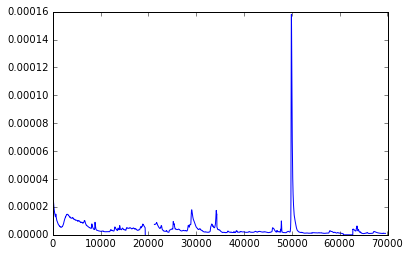

SOL2011-04-22T04:35:00L190C107


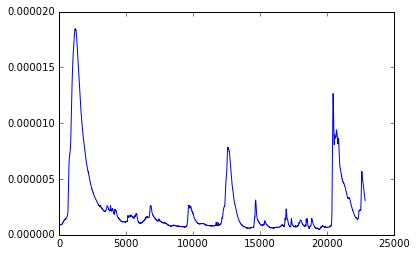

SOL2011-05-29T10:08:00L033C110


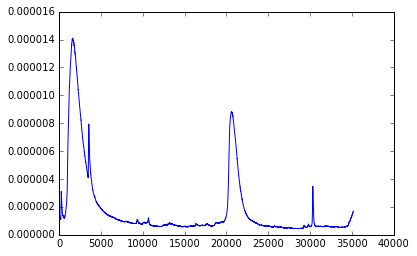

SOL2011-06-07T06:16:00L033C112


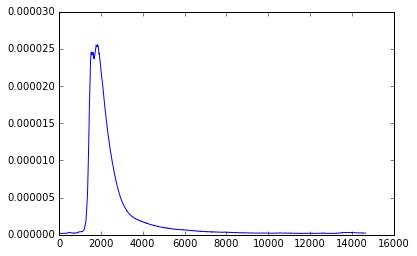

SOL2011-06-14T21:36:00L161C076


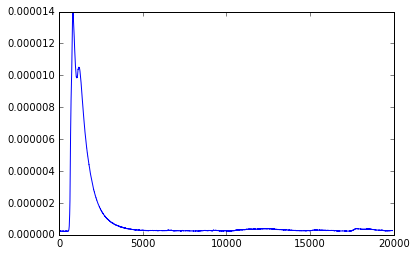

SOL2011-08-02T05:19:00L333C073


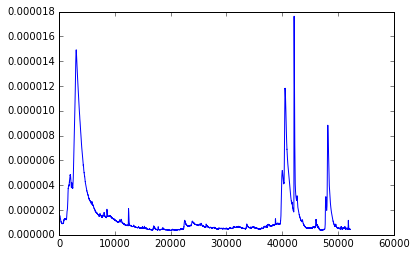

SOL2011-08-03T03:08:00L337C075


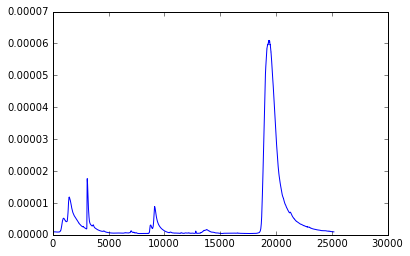

SOL2011-08-03T13:17:00L333C073


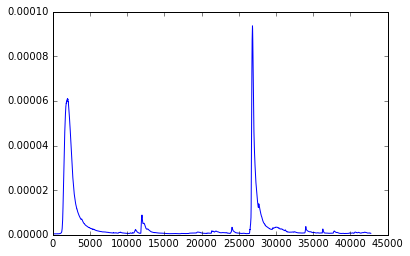

SOL2011-08-09T03:19:00L298C073


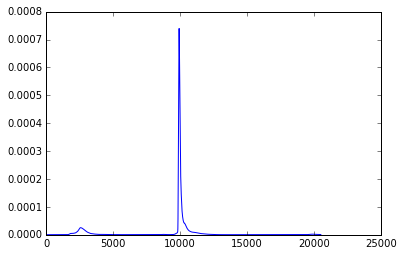

SOL2011-09-04T11:21:00L325C072


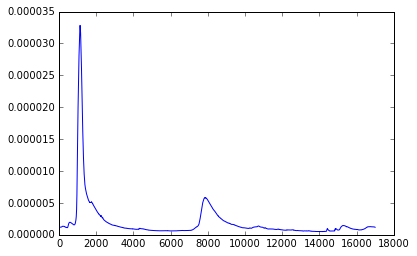

SOL2011-09-05T03:47:00L319C072


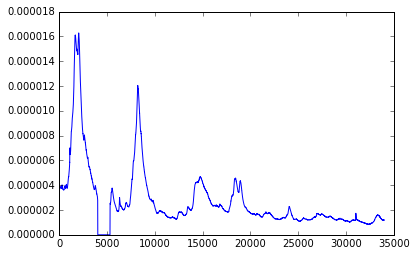

SOL2011-09-05T07:26:00L317C072


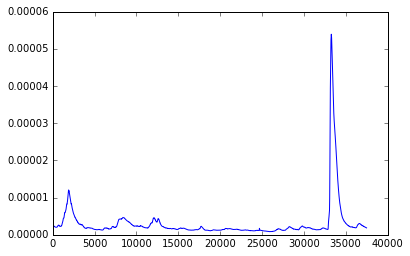

SOL2011-09-05T07:27:00L317C072


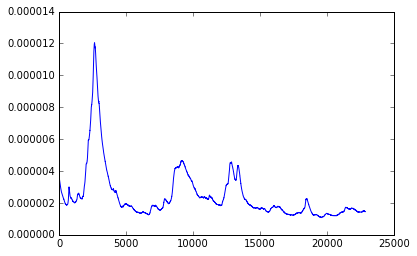

SOL2011-09-06T01:35:00L227C077


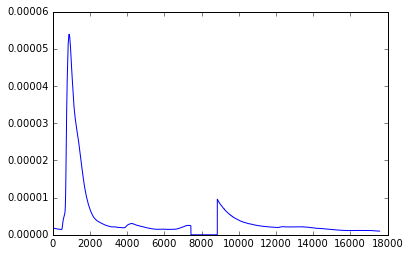

SOL2011-09-10T07:18:00L228C076


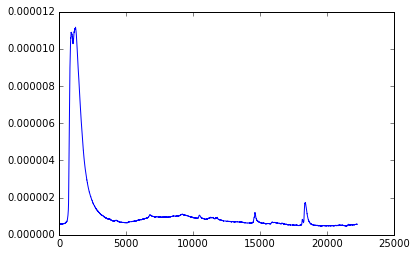

SOL2011-09-21T12:04:00L288C075


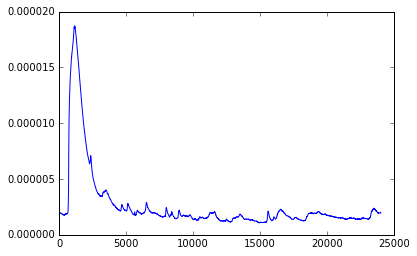

SOL2011-09-22T10:29:00L275C081


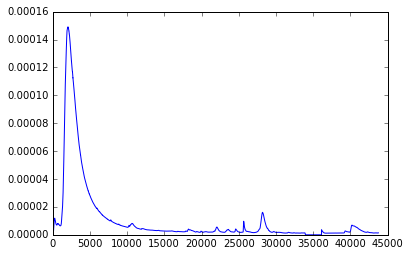

SOL2011-09-23T21:54:00L289C078


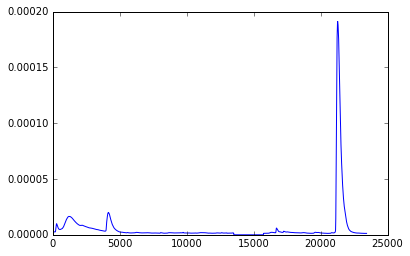

SOL2011-09-24T09:21:00L277C077


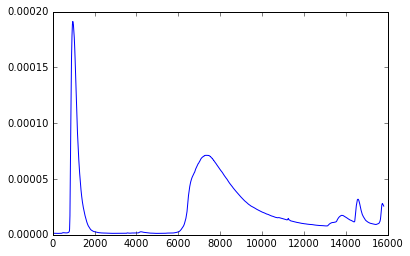

SOL2011-09-24T12:33:00L278C075


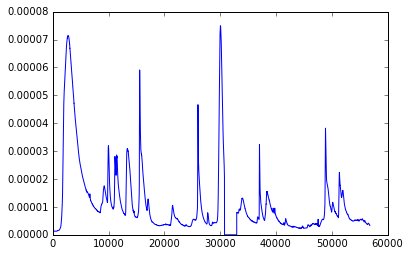

SOL2011-09-24T16:35:00L060C067


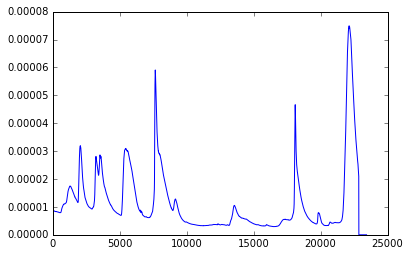

SOL2011-09-24T17:59:00L278C077


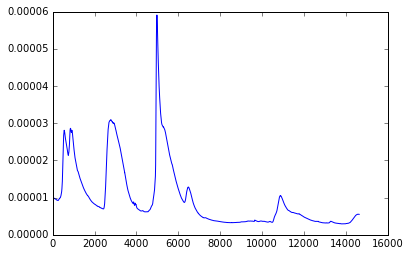

SOL2011-09-24T19:09:00L291C078


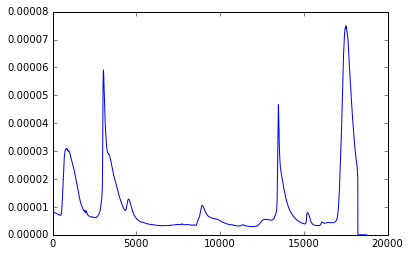

SOL2011-09-24T23:45:00L035C118


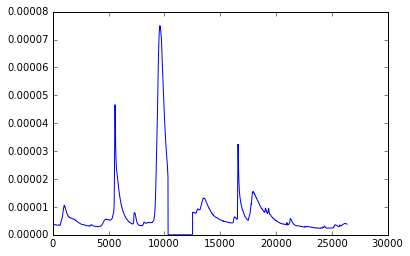

SOL2011-09-25T04:31:00L278C077


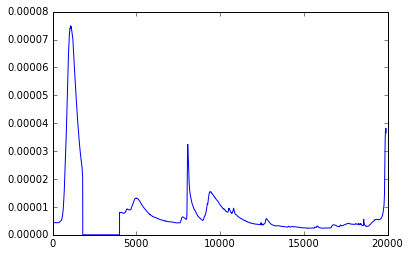

SOL2011-09-25T09:25:00L036C118


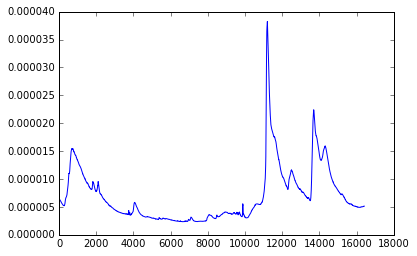

SOL2011-10-01T08:56:00L250C081


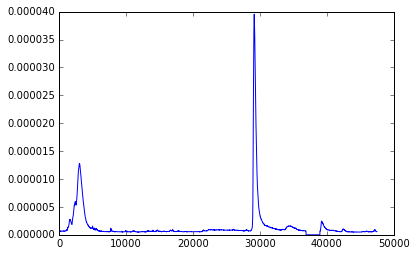

SOL2011-10-20T03:10:00L086C072


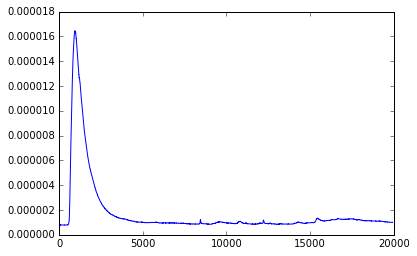

SOL2011-10-22T09:18:00L055C063


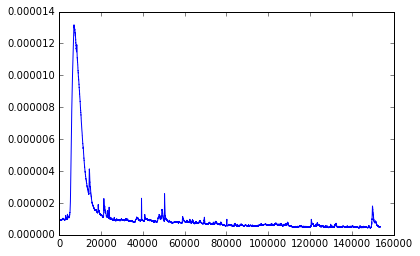

SOL2011-10-31T14:55:00L118C070


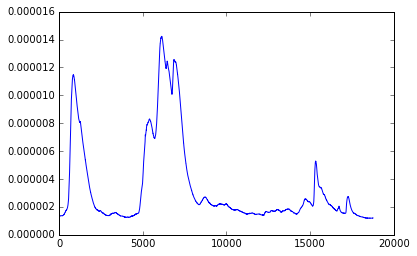

SOL2011-10-31T17:21:00L117C069


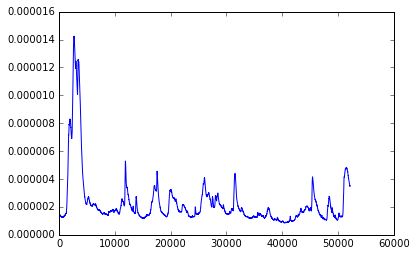

SOL2011-11-02T21:52:00L099C070


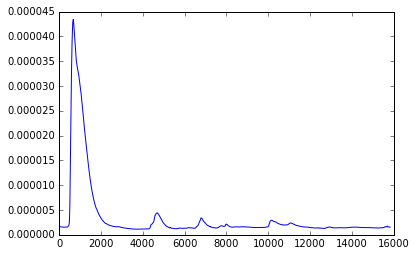

SOL2011-11-05T03:08:00L100C070


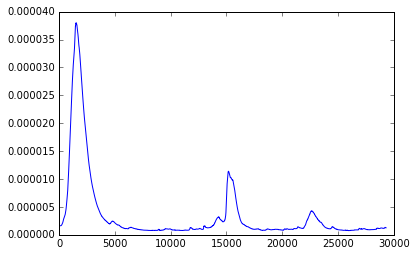

SOL2011-11-05T11:10:00L101C071


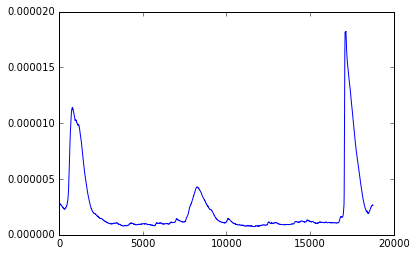

SOL2011-11-06T00:46:00L101C070


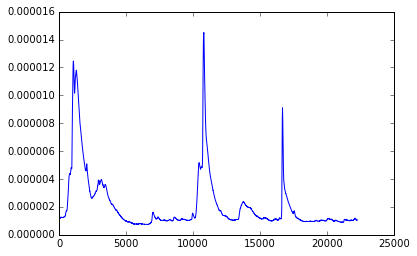

SOL2011-11-06T06:14:00L099C069


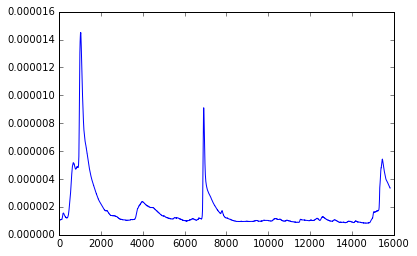

SOL2011-11-09T13:04:00L053C066


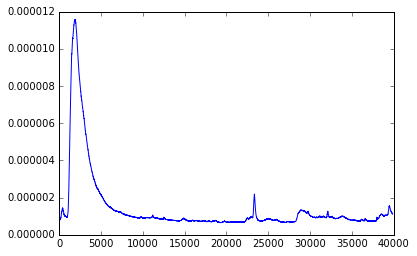

SOL2012-01-17T04:41:00L212C072


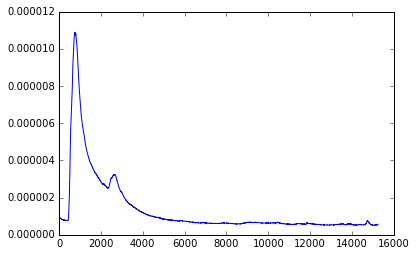

SOL2012-01-19T13:43:00L207C058


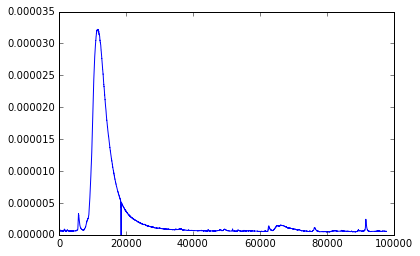

SOL2012-01-19T13:44:00L207C058


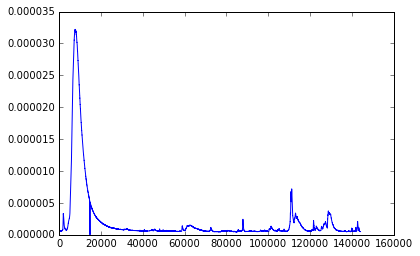

SOL2012-01-27T17:37:00L211C057


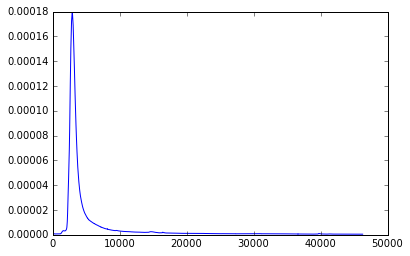

SOL2012-02-06T19:31:00L055C071


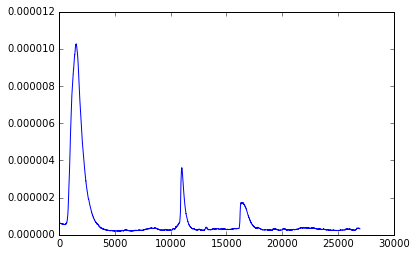

SOL2012-03-02T17:29:00L298C072


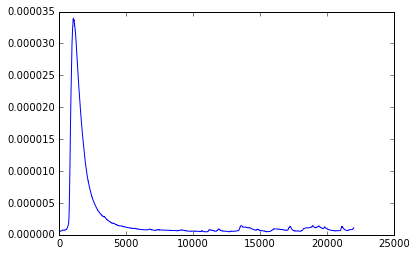

SOL2012-03-04T10:29:00L298C074


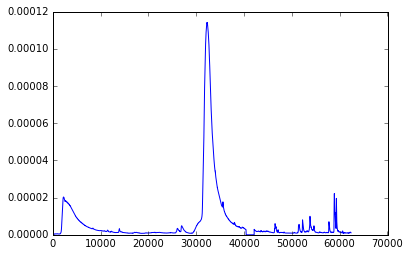

SOL2012-03-05T02:30:00L296C071


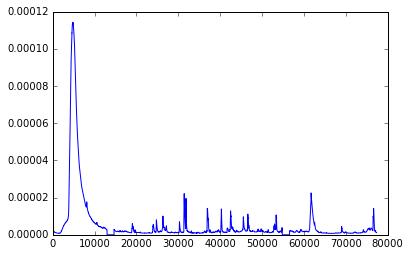

SOL2012-03-06T12:23:00L296C069


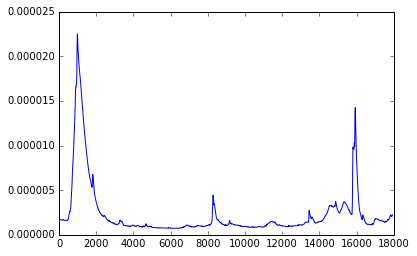

SOL2012-03-07T00:02:00L298C072


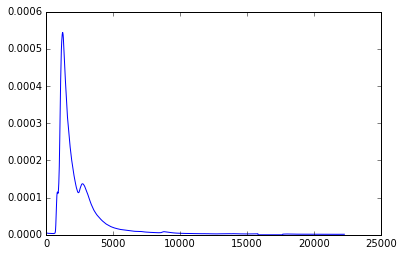

SOL2012-03-09T03:22:00L304C075


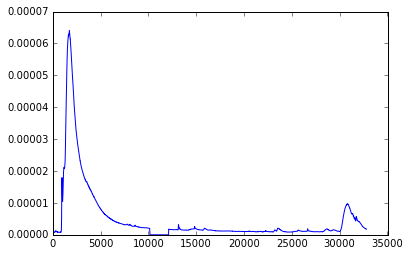

SOL2012-03-10T17:15:00L304C073


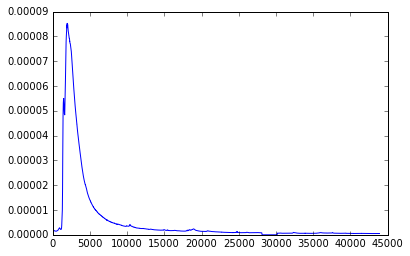

SOL2012-03-13T17:12:00L307C073


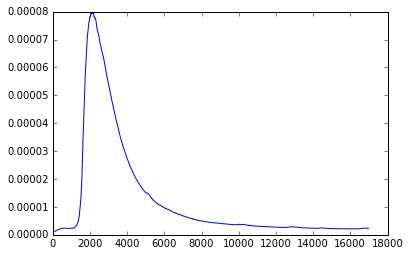

SOL2012-03-14T15:08:00L224C077


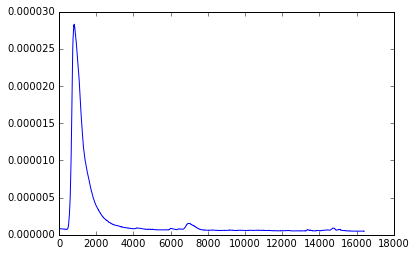

SOL2012-03-15T07:23:00L223C076


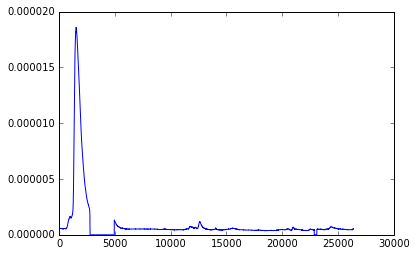

SOL2012-04-16T17:24:00L063C076


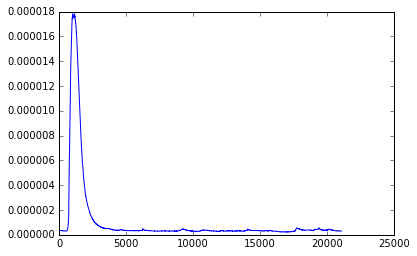

SOL2012-05-07T14:03:00L285C110


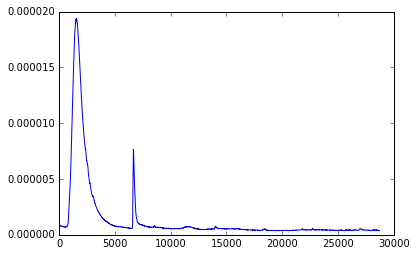

SOL2012-05-17T01:25:00L199C083


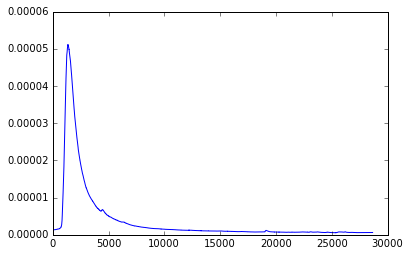

SOL2012-07-04T12:07:00L212C107


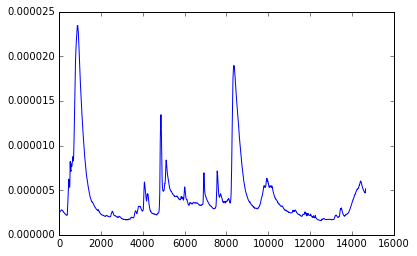

SOL2012-07-05T13:05:00L218C105


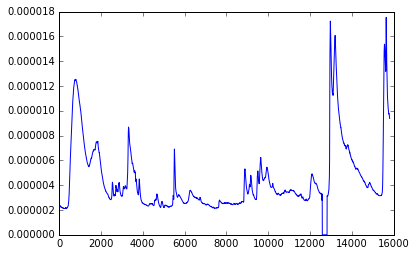

SOL2012-07-12T15:37:00L084C103


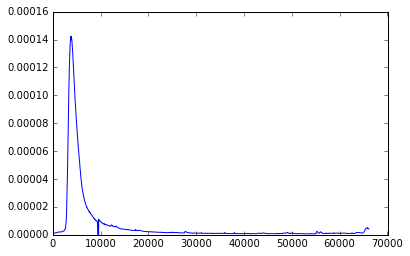

SOL2012-07-14T03:32:00L079C105


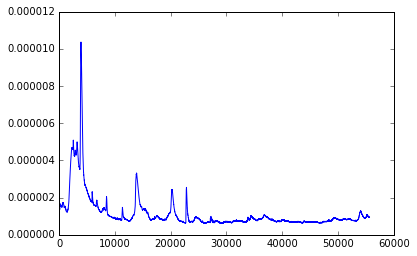

SOL2012-07-17T12:03:00L105C105


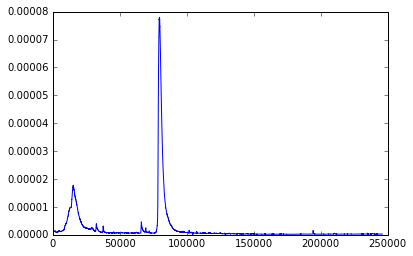

SOL2012-07-17T12:50:00L104C105


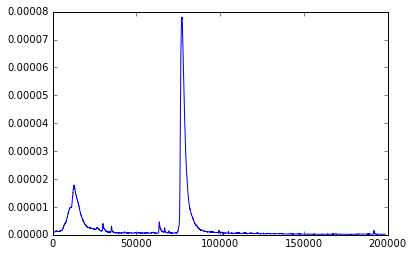

SOL2012-07-19T04:13:00L083C103


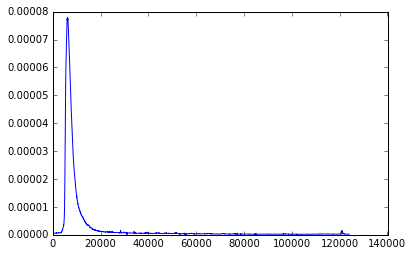

SOL2012-07-19T04:17:00L083C103


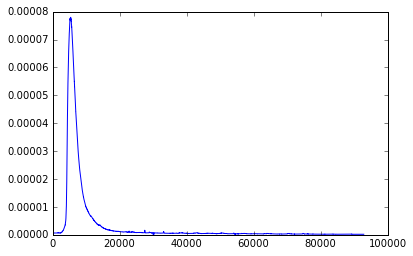

SOL2012-07-19T05:13:00L082C103


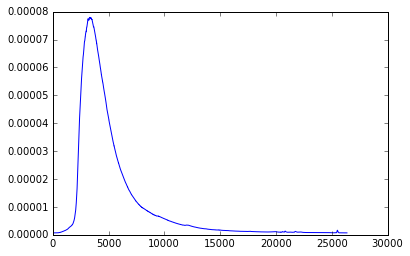

SOL2012-08-11T11:55:00L087C115


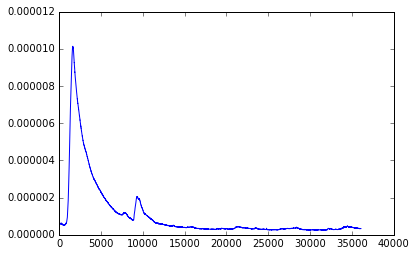

SOL2012-08-18T00:24:00L234C071


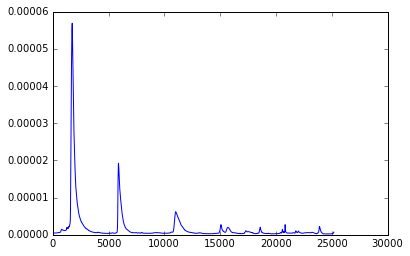

SOL2012-09-08T17:35:00L073C104


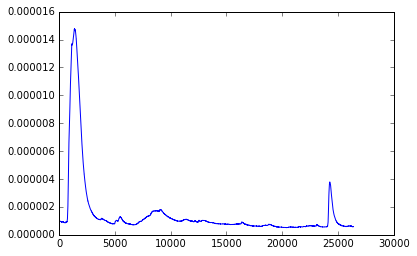

SOL2012-09-09T21:50:00L074C105


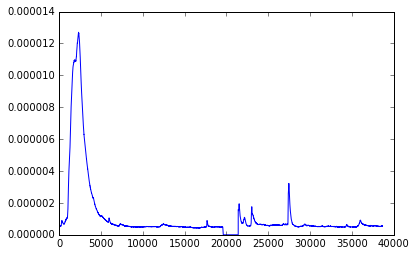

SOL2013-01-11T08:43:00L154C085


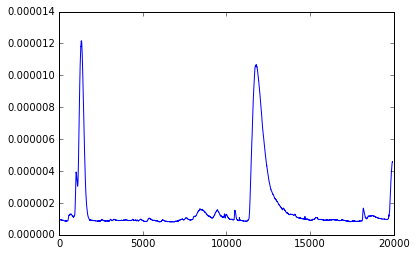

SOL2013-01-11T14:51:00L143C084


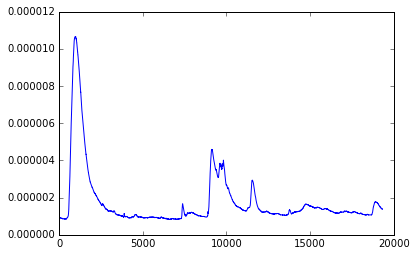

SOL2013-03-15T05:46:00L076C081


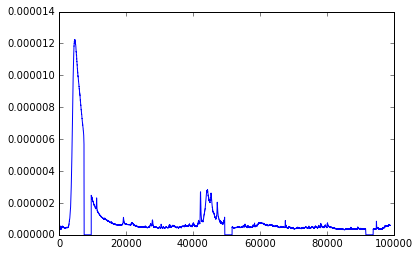

SOL2013-03-21T21:42:00L082C081


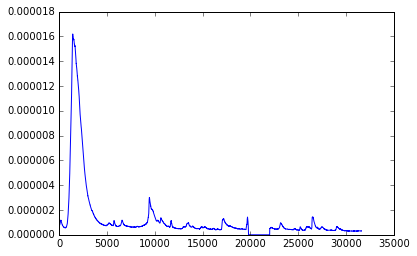

SOL2013-04-11T06:55:00L072C083


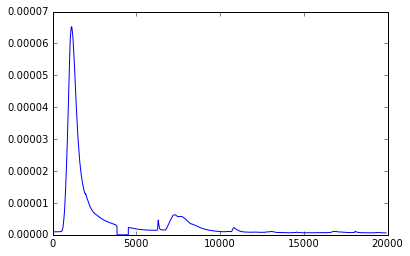

SOL2013-04-12T19:52:00L107C069


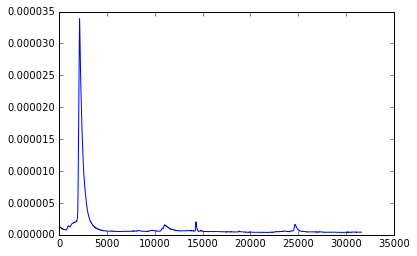

SOL2013-05-03T16:39:00L188C079


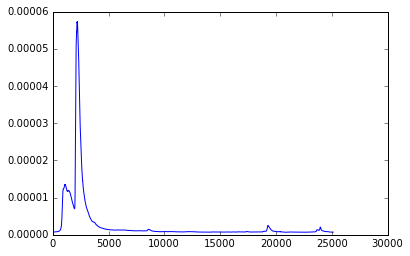

SOL2013-05-10T12:37:00L331C078


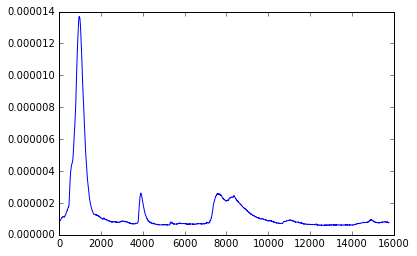

SOL2013-05-13T01:53:00L297C079


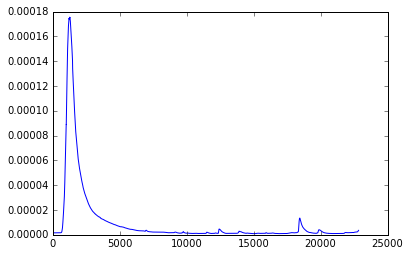

SOL2013-05-13T15:48:00L289C082


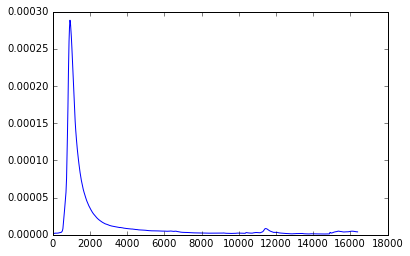

SOL2013-05-14T00:00:00L297C082


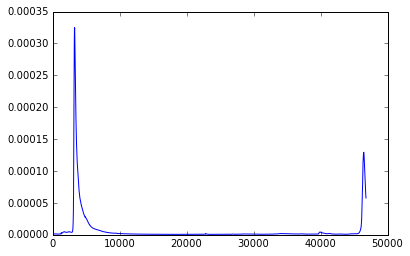

SOL2013-05-15T01:25:00L292C080


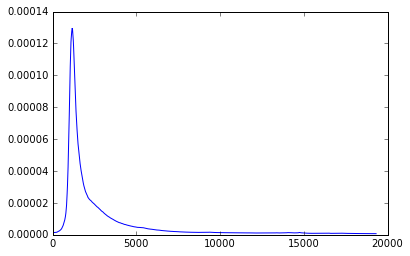

SOL2013-05-16T21:36:00L296C079


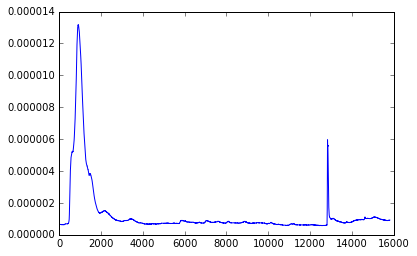

SOL2013-05-17T08:43:00L293C079


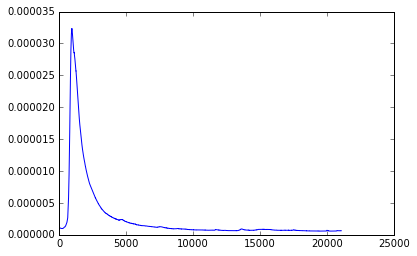

SOL2013-05-20T04:45:00L203C081


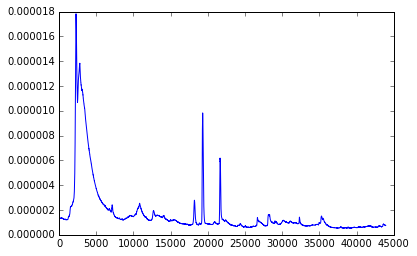

SOL2013-06-05T08:14:00L129C121


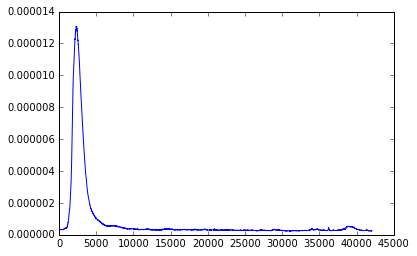

SOL2013-06-07T22:11:00L132C122


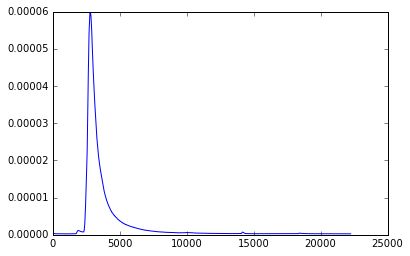

SOL2013-06-21T02:30:00L156C104


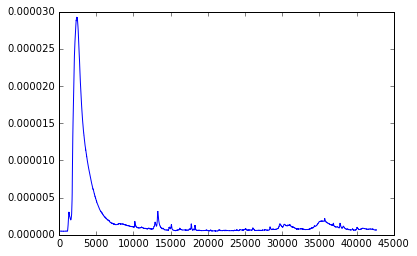

SOL2013-12-07T07:17:00L203C106


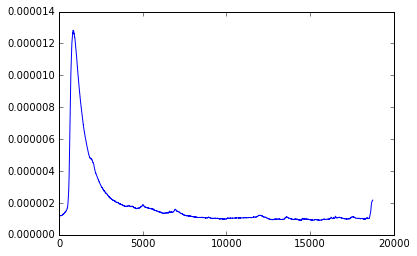

SOL2013-12-20T11:35:00L264C106


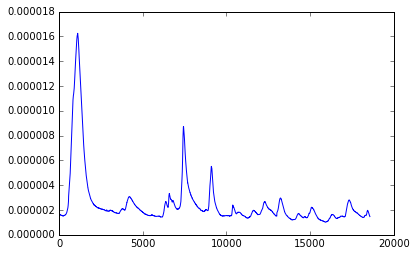

SOL2013-12-22T21:23:00L310C090


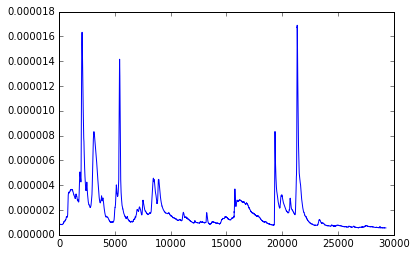

SOL2013-12-31T21:45:00L227C105


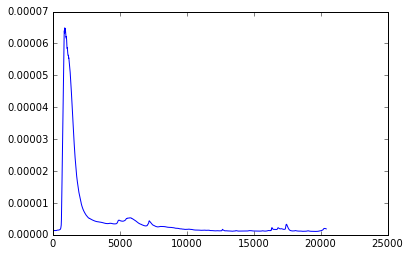

SOL2014-01-02T02:24:00L085C095


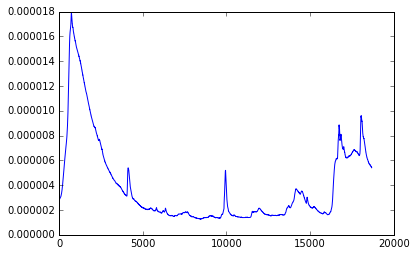

SOL2014-01-04T10:16:00L095C095


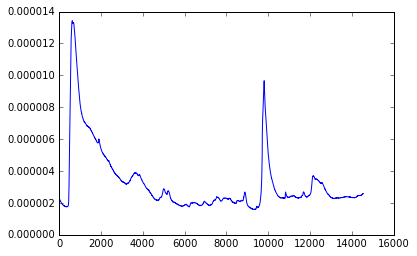

SOL2014-01-04T19:05:00L105C101


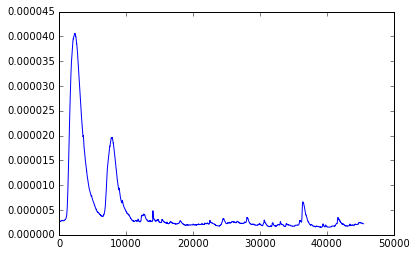

SOL2014-01-04T22:09:00L227C104


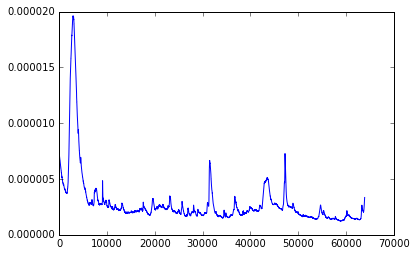

SOL2014-01-04T22:12:00L227C104


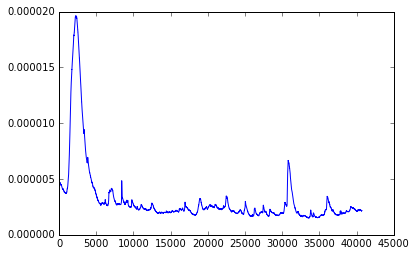

SOL2014-01-07T10:07:00L091C103


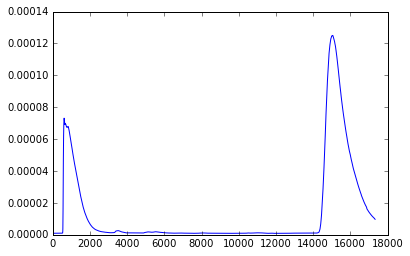

SOL2014-01-07T18:04:00L108C102


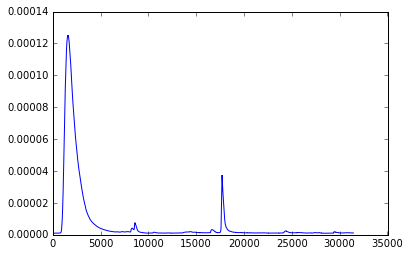

SOL2014-01-27T01:05:00L118C106


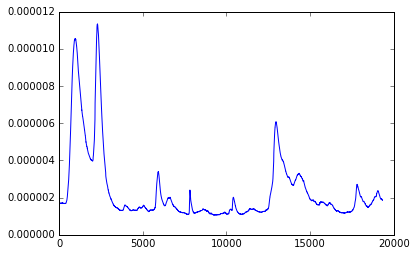

SOL2014-01-28T19:00:00L108C104


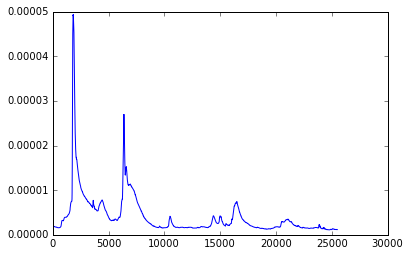

SOL2014-01-30T07:54:00L109C101


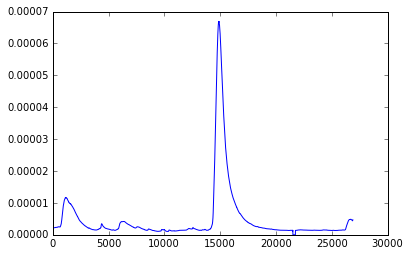

SOL2014-01-30T15:48:00L094C101


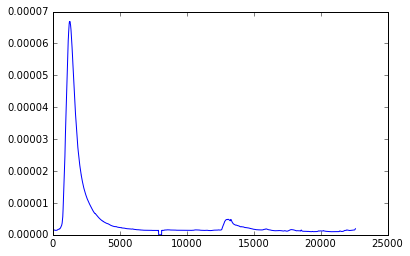

SOL2014-02-01T07:14:00L115C100


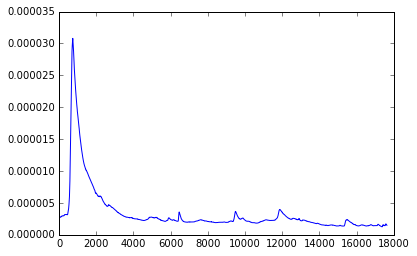

SOL2014-02-02T07:17:00L111C101


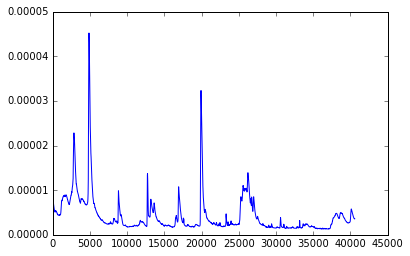

SOL2014-02-02T21:24:00L115C100


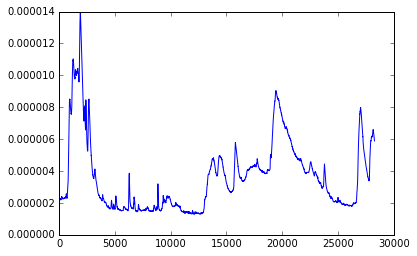

SOL2014-02-04T02:40:00L103C105


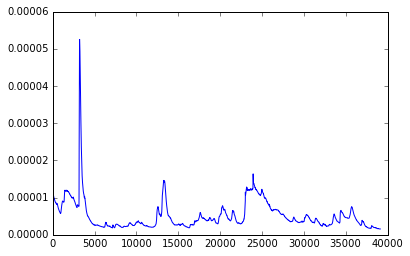

SOL2014-02-04T15:25:00L107C104


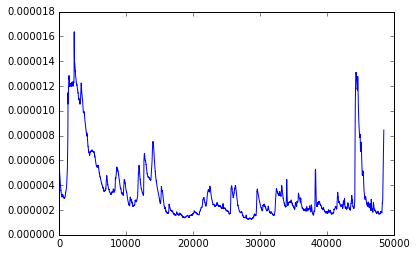

SOL2014-02-09T15:40:00L309C107


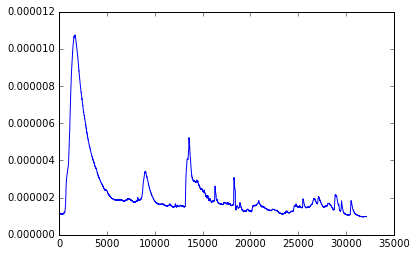

SOL2014-02-09T15:40:00L300C106


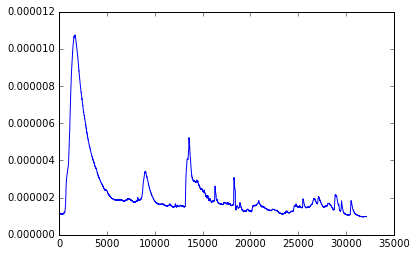

SOL2014-02-12T03:52:00L355C103


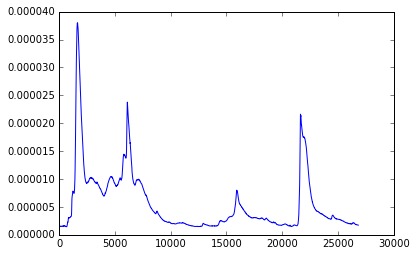

SOL2014-02-12T15:41:00L352C100


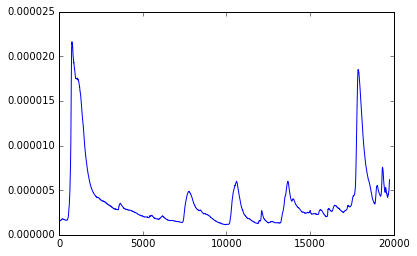

SOL2014-02-14T02:40:00L353C101


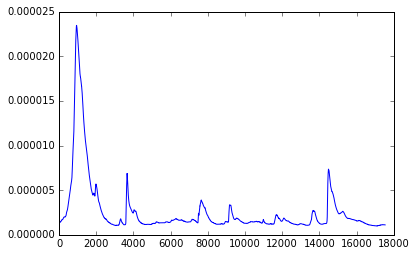

SOL2014-03-10T22:45:00L050C076


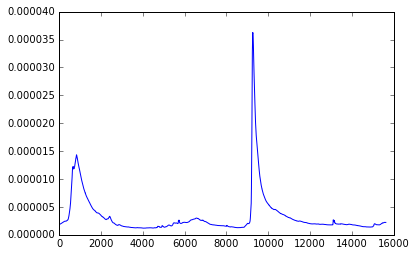

SOL2014-03-13T19:03:00L050C075


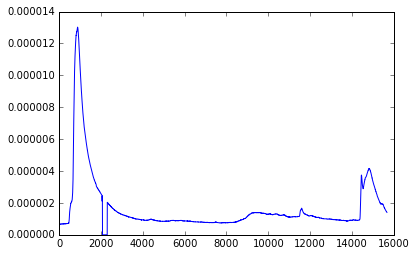

SOL2014-03-20T03:42:00L164C102


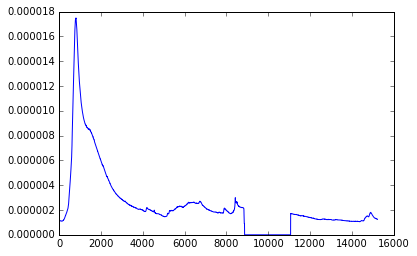

SOL2014-03-31T07:20:00L169C103


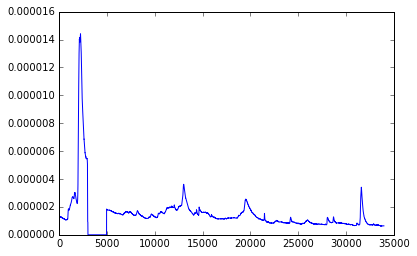

SOL2014-04-02T13:18:00L011C081


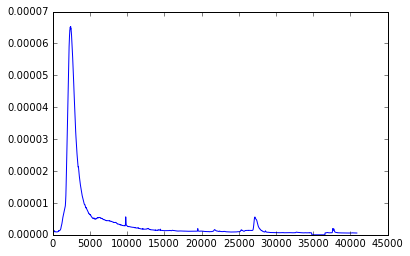

SOL2014-04-18T12:31:00L247C110


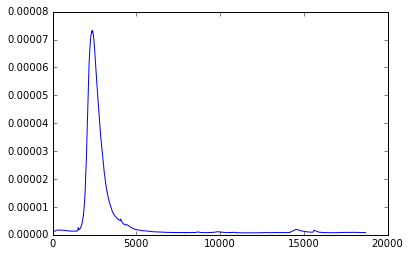

SOL2014-06-10T12:36:00L142C110


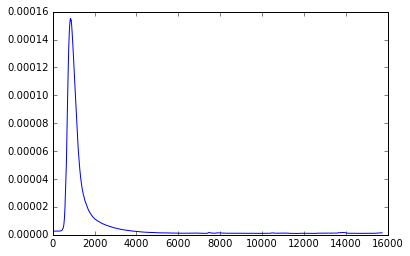

SOL2014-06-12T21:34:00L263C107


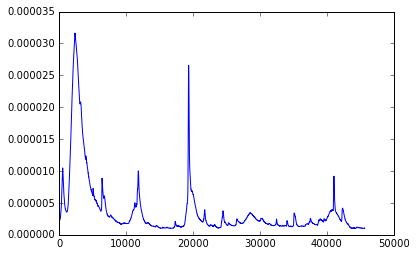

SOL2014-06-15T11:07:00L256C112


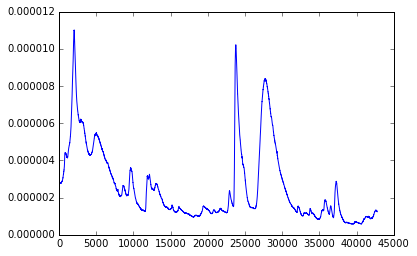

SOL2014-06-15T11:10:00L256C112


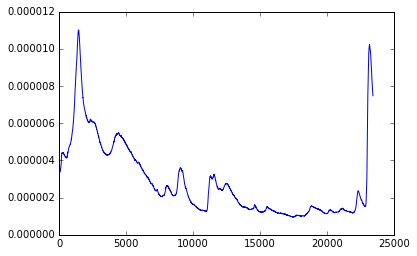

SOL2014-06-15T23:50:00L151C109


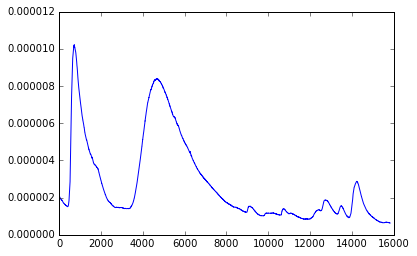

SOL2014-07-01T11:05:00L255C078


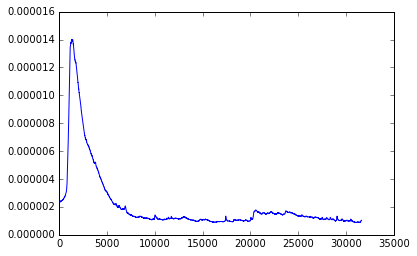

SOL2014-08-01T17:55:00L250C100


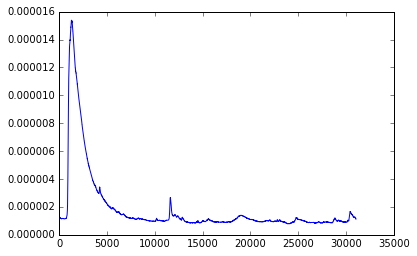

SOL2014-08-24T12:00:00L244C099


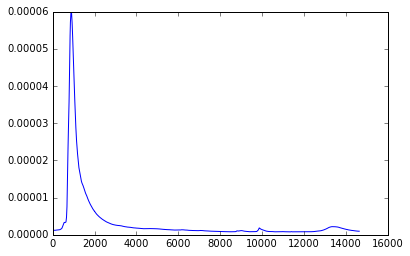

SOL2014-08-25T14:46:00L345C084


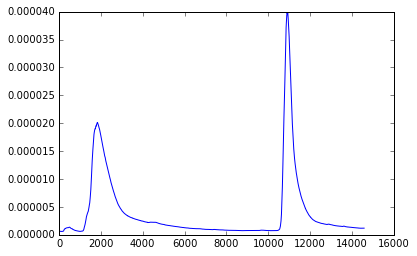

SOL2014-09-03T13:20:00L100C105


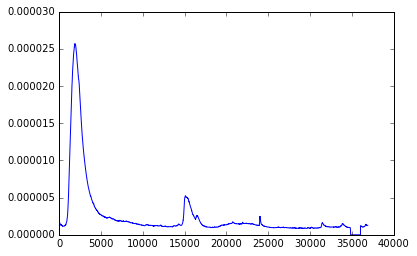

SOL2014-09-06T16:50:00L093C105


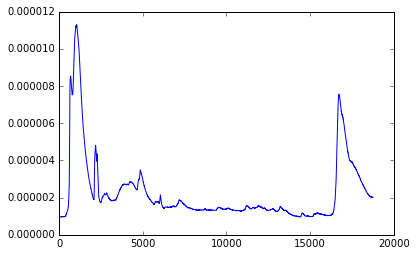

SOL2014-09-08T23:12:00L084C076


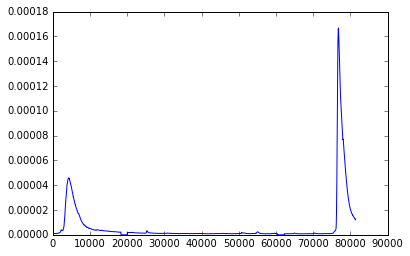

SOL2014-09-11T21:01:00L094C107


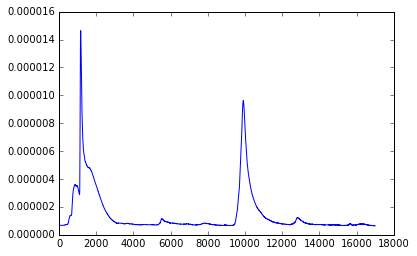

SOL2014-09-11T21:22:00L349C076


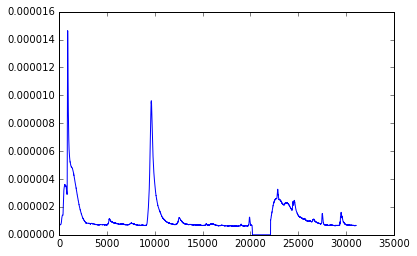

SOL2014-09-14T02:03:00L096C104


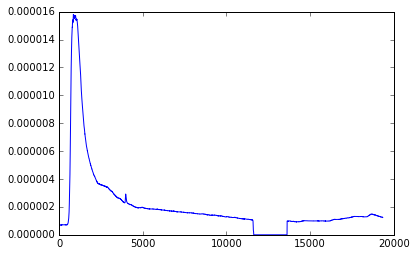

SOL2014-09-23T23:03:00L246C104


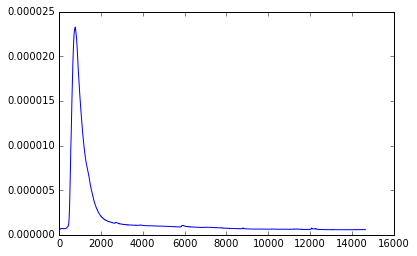

SOL2014-10-14T18:21:00L276C102


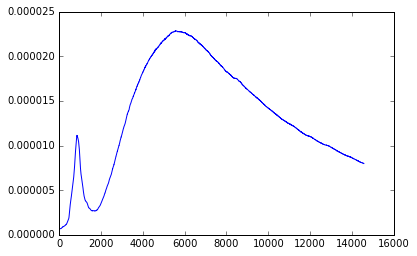

SOL2014-10-14T19:00:00L275C101


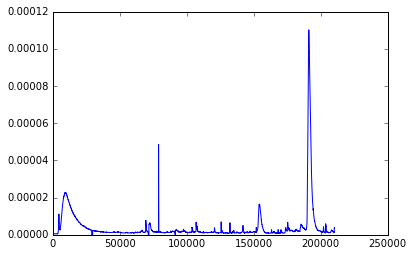

SOL2014-10-14T19:07:00L275C101


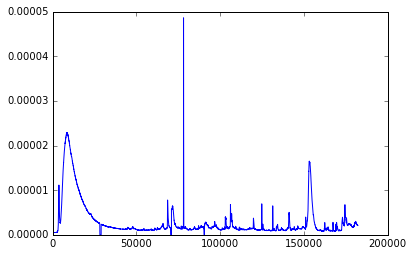

SOL2014-10-18T07:02:00L235C104


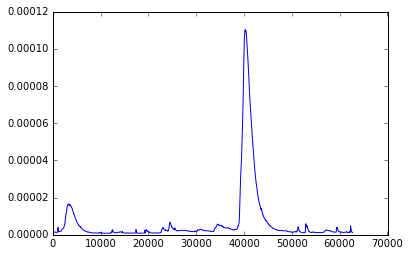

SOL2014-10-19T04:17:00L241C104


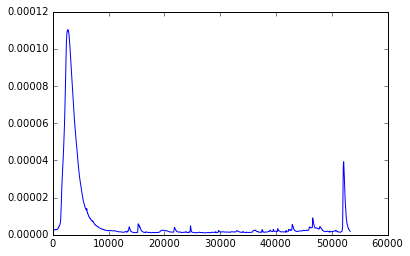

SOL2014-10-20T16:00:00L247C104


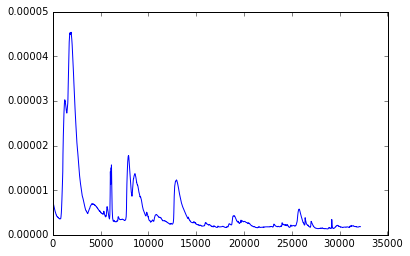

SOL2014-10-20T22:43:00L246C104


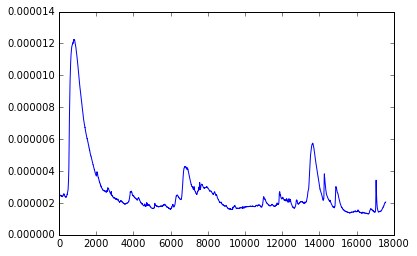

SOL2014-10-22T01:16:00L246C103


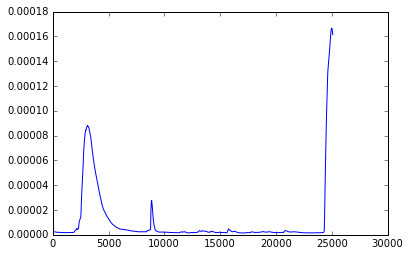

SOL2014-10-22T14:02:00L247C104


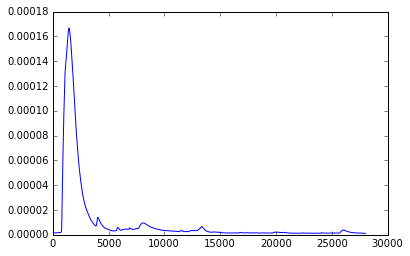

SOL2014-10-24T21:07:00L251C112


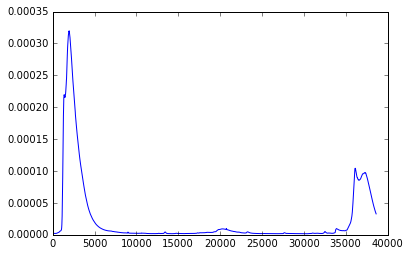

SOL2014-10-26T10:04:00L247C104


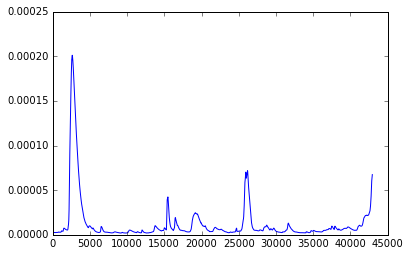

SOL2014-10-26T19:59:00L249C105


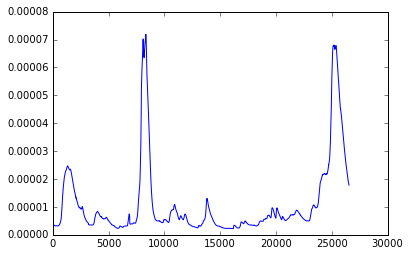

SOL2014-10-27T00:06:00L244C102


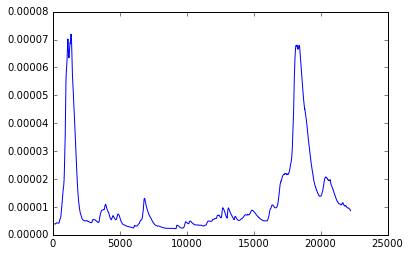

SOL2014-10-27T01:44:00L246C103


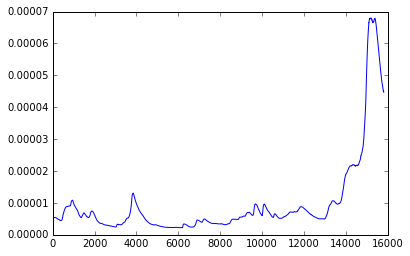

SOL2014-10-27T09:59:00L186C174


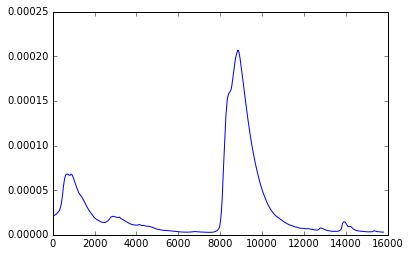

SOL2014-10-27T14:12:00L250C106


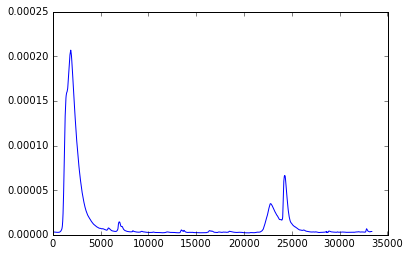

SOL2014-10-28T02:15:00L253C105


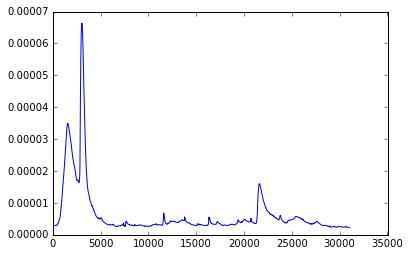

SOL2014-10-28T13:54:00L255C106


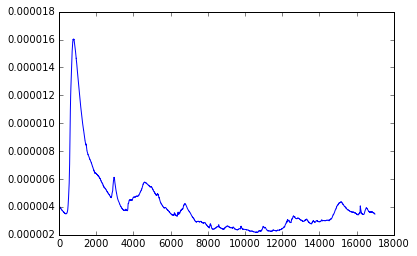

SOL2014-10-28T13:54:00L255C107


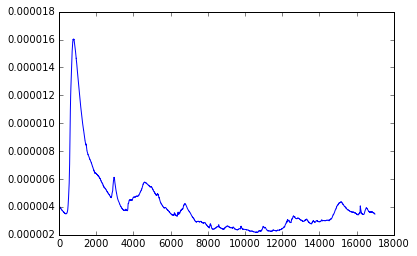

SOL2014-10-29T06:03:00L250C104


IOError: File goes_event_lcs/SOL2014-10-29T06:03:00L250C104.csv does not exist

In [50]:
dateparseT = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')

full = pd.read_csv('prepped_goes3_strong_events_classified.csv', delimiter=',', header=0, 
                     parse_dates=['event_starttime', 'event_endtime'],date_parser=dateparseT)

for sol in full['SOL_standard']:
    print sol
    fname = 'goes_event_lcs/'+sol+'.csv'
    lc = pd.read_csv(fname, delimiter = ',', header = 0, parse_dates=['date'],
                     date_parser=dateparse)
    plt.plot(lc['xrsb'])
    plt.show()

In [3]:
from sunpy.time import TimeRange


In [4]:
tr = TimeRange('2011/03/21', '2016/06/01')

In [12]:
dateparseT = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')


def group_by_day(fname, adjusted=False):
    if adjusted:
        datecol = ['adjusted_starttime']
    else:
        datecol = ['event_starttime']
    f = pd.read_csv(fname, delimiter=',',header=0, parse_dates=datecol,date_parser=dateparseT)
#     day = datetime.datetime(start_year, start_month, start_day)
#     end_time = datetime.datetime(end_year, end_month, end_day)
#     delta_day = datetime.timedelta(days=1)
#     day += delta_day
#     while day <= end_time:
#         day1 = day+delta_day
#         day_str_slash = day.strftime('%Y/%m/%d')
#         day1_str_slash = day1.strftime('%Y/%m/%d')
       
#         day += delta_day
    out = fname[:-4]+'_bydate.csv'
    f.to_csv(out, date_format = '%Y-%m-%d')

In [82]:
dateparseT = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S')


def group_by_month(fname, adjusted=False):
    if adjusted:
        datecol = ['adjusted_starttime']
    else:
        datecol = ['event_starttime']
    f = pd.read_csv(fname, delimiter=',',header=0, parse_dates=datecol,date_parser=dateparseT)
#     day = datetime.datetime(start_year, start_month, start_day)
#     end_time = datetime.datetime(end_year, end_month, end_day)
#     delta_day = datetime.timedelta(days=1)
#     day += delta_day
#     while day <= end_time:
#         day1 = day+delta_day
#         day_str_slash = day.strftime('%Y/%m/%d')
#         day1_str_slash = day1.strftime('%Y/%m/%d')
       
#         day += delta_day
    out = fname[:-4]+'_bymonth.csv'
    f.to_csv(out, date_format = '%Y-%m')

In [83]:
e = pd.read_csv('raw_ef1.csv', delimiter=',', header=0)
e = e.ix[e['event_probability']==1]
e.to_csv('raw_ef3.csv', index=False)

/usr/local/anaconda/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2723: DtypeWarning: Columns (82,120) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [173]:
group_by_month('noEF_7_times2_EF_friendly.csv')

In [97]:
dateparseD = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')

def event_count_by_date(fname,start_year, start_month, start_day,end_year, end_month, end_day, ar=False):
    numevents = []
    f = pd.read_csv(fname, delimiter=',',header=0, parse_dates=['event_starttime'],date_parser=dateparseD)
    day = datetime.datetime(start_year, start_month, start_day)
    end_time = datetime.datetime(end_year, end_month, end_day)
    delta_day = datetime.timedelta(days=1)
    days = []
    numday = []
    day += delta_day
    i =0
    while day <= end_time:
        event_search = f.ix[f['event_starttime']==day]
        if event_search.shape[0]==0:
            numevents.append(0)
        else: 
            if ar:
                numevents.append(f['ar_numspots'].sum)
                
            else: numevents.append(event_search.shape[0])
        days.append(day)
        numday.append(i)
        day += delta_day
        i+=1
    return numevents, days, numday

In [340]:
dateparseM = lambda x: pd.datetime.strptime(x, '%Y-%m')
years = [2011, 2012, 2013, 2014, 2015, 2016]
months = ['01','02','03','04','05','06','07','08','09','10','11','12']

def event_count_by_month(fname,start_year, start_month, start_day,end_year, end_month, end_day, ar=False, flare=False):
    numevents = []
    f = pd.read_csv(fname, delimiter=',',header=0)
#     f.loc[:,'month'] = (lambda x: x[3:10], f['SOL_standard'])
    days = []
    numday = []
    i =0
    for y in years:
        for m in months:
            day = str(y)+'-'+m
            event_search = f.ix[f['event_starttime']==day]
            if event_search.shape[0]==0:
                numevents.append(0)
            else: 
                if ar:
                    numevents.append(event_search['ar_numspots'].sum())
                elif flare: numevents.append(event_search['adjusted_peak'].sum())

                else: numevents.append(event_search.shape[0])
            days.append(day)
            numday.append(i)
            i+=1
    return numevents, days, numday

In [103]:
sol = 'SOL2011-03-01T01:12:45L159C063'
sol[3:10]

'2011-03'

In [49]:
def events_per_day(list_event_files, list_event_names, start_year, start_month, start_day,end_year, end_month, 
                   end_day):
    list_event_counts = []
    for i, fname in enumerate(list_event_files):
        counts = event_count_by_date(fname,start_year, start_month, start_day,end_year, end_month, end_day)
        if i == 0:
            list_event_counts.append(counts[1])
            list_event_counts.append(counts[2])
        list_event_counts.append(counts[0])
    dic = dict(zip(list_event_names,list_event_counts))
    event_counts = pd.DataFrame.from_dict(dic)
    event_counts.to_csv('events_per_day.csv', index=False, date_format = '%Y-%m-%d')
        

In [332]:
def events_per_month(list_event_files, list_event_names, start_year, start_month, start_day,end_year, end_month, 
                   end_day):
    list_event_counts = []
    for i, fname in enumerate(list_event_files):
        counts = event_count_by_month(fname,start_year, start_month, start_day,end_year, end_month, end_day, ar=False, 
                                      flare=False)
        if i == 0:
            list_event_counts.append(counts[1])
            list_event_counts.append(counts[2])
        if i== 4 or i==5 or i==0:
            counts = event_count_by_month(fname,start_year, start_month, start_day,end_year, end_month, end_day, ar=False, 
                                      flare=True)
        list_event_counts.append(counts[0])
    dic = dict(zip(list_event_names,list_event_counts))
    event_counts = pd.DataFrame.from_dict(dic)
    event_counts.to_csv('events_per_month.csv', index=False, date_format = '%Y-%m')

In [74]:
list_event_files = ['full_dataset7_bydate.csv','raw_ef1_bydate.csv','raw_er_bydate.csv',
                    'raw_sg_bydate.csv', 'EF_7_times2_bydate.csv','noEF_7_times2_bydate.csv', 'raw_ar_bydate.csv']
list_event_names = ['date', 'numday', 'GOES_flare', 'EF', 'er', 'sigmoid', 'EFIF', 'nonEFIF', 'AR']

events_per_day(list_event_files, list_event_names, 2011, 3, 1,2016, 6, 1)

In [341]:
list_event_files = ['full_dataset7_bymonth.csv','raw_ef1_bymonth.csv','raw_er_bymonth.csv',
                    'raw_sg_bymonth.csv', 'EF_7_bymonth.csv','noEF_7_times2_EF_friendly_bymonth.csv', 
                    'raw_ar_bymonth.csv']
list_event_names = ['date', 'numday', 'GOES_flare', 'EF', 'er', 'sigmoid', 'EFIF', 'nonEFIF', 'AR']

events_per_month(list_event_files, list_event_names, 2011, 3, 1,2016, 6, 1)

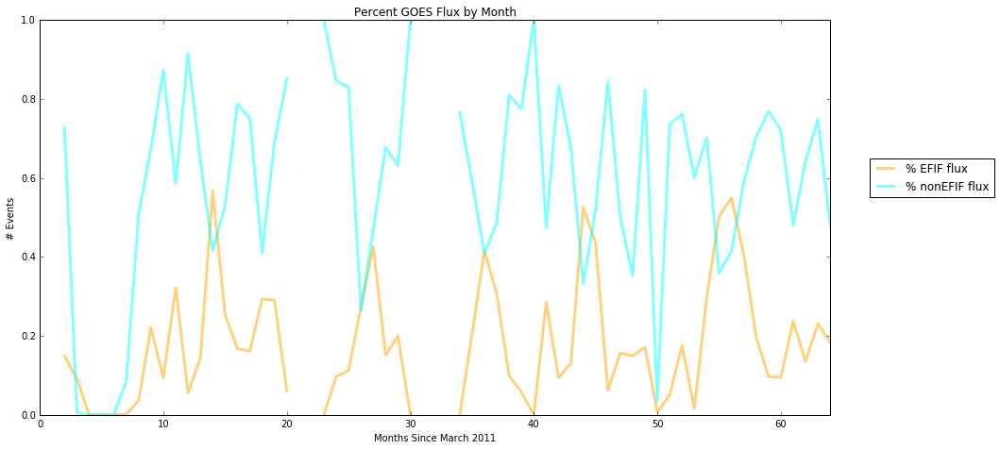

0.150203323177


0.6427531398708912

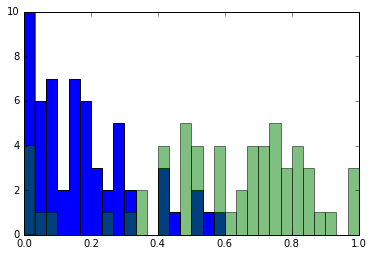

In [354]:
dateparseD = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')
f = pd.read_csv('events_per_month.csv', header=0, delimiter=',', parse_dates=['date'],date_parser=dateparseM)
plt.figure(figsize = (15, 7.5))
# plt.scatter(f['numday'],f['EFIF'], alpha=0.5, s=1)
# plt.plot(f['numday'],f['EF']/4, alpha=0.5, color='g',lw=3, label='EF/4')
# plt.plot(f['numday'],f['AR'], alpha=0.5, color='black')
# plt.plot(f['numday'],f['GOES_flare'], alpha=0.5, color='blue', lw=3, label='GOES Flare')
# plt.plot(f['numday'],f['er'], alpha=0.5, c='red')
# plt.plot(f['numday'],f['sigmoid'], c='purple', alpha=0.5)
# plt.plot(f['numday'],f['nonEFIF']/f['GOES_flare'], alpha=0.75, color='orange', lw=3, label = 'Non-EFIF')
plt.plot(f['numday'],f['EFIF']/f['GOES_flare'], alpha=0.5, color='orange', lw=3, label='% EFIF flux')
plt.plot(f['numday'],f['nonEFIF']/f['GOES_flare'], alpha=0.5, color='cyan', lw=3, label='% nonEFIF flux')
# plt.scatter(f['numday'],f['EF'], alpha=0.5, color='g')
# plt.scatter(f['numday'],f['AR'], alpha=0.5, color='black')
# plt.scatter(f['numday'],f['GOES_flare'], alpha=0.5, color='blue')
# plt.scatter(f['numday'],f['er'], alpha=0.5, c='red')
# plt.scatter(f['numday'],f['sigmoid'], c='purple', alpha=0.5)
# plt.scatter(f['numday'],f['nonEFIF'], alpha=0.75, color='orange')
# plt.scatter(f['numday'],f['EFIF'], alpha=0.5, color='cyan')
plt.xlim(0,64)
plt.ylim(0,1)
plt.title('Percent GOES Flux by Month')
plt.xlabel('Months Since March 2011')
plt.ylabel('# Events')
fNameSave = 'solareventspermonth.png'
plt.legend(bbox_to_anchor=(1.05, .65), loc=2, borderaxespad=0.)
plt.savefig(fNameSave, bbox_inches = 'tight', pad_inches = 0.1)
plt.show()

plt.hist(f['EFIF']/f['GOES_flare'], bins =30, range=(0,1))
plt.hist(f['nonEFIF']/f['GOES_flare'], bins =30, range=(0,1), alpha=0.5)
print (f['EFIF']/f['GOES_flare']).median()
(f['nonEFIF']/f['GOES_flare']).median()

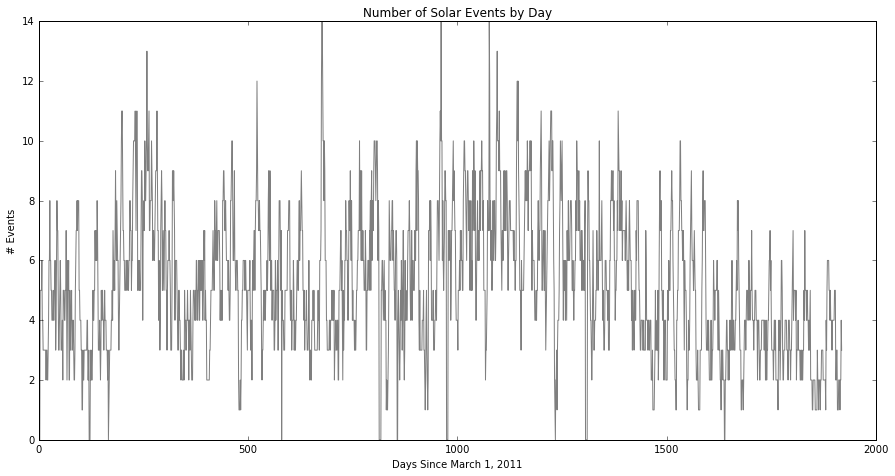

In [192]:
dateparseD = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')
f = pd.read_csv('events_per_day.csv', header=0, delimiter=',', parse_dates=['date'],date_parser=dateparseD)
plt.figure(figsize = (15, 7.5))
# plt.plot(f['numday'],f['EF'], alpha=0.5, color='g')
plt.plot(f['numday'],f['AR'], alpha=0.5, color='black')
# plt.plot(f['numday'],f['GOES_flare'], alpha=0.5, color='blue')
# plt.plot(f['numday'],f['er'], alpha=0.5, c='red')
# plt.plot(f['numday'],f['sigmoid'], c='purple', alpha=0.5)

# plt.plot(f['numday'],f['nonEFIF'], alpha=0.75, color='black')
# plt.plot(f['numday'],f['EFIF'], alpha=0.9, color='r')
# plt.scatter(f['numday'],f['EF'], alpha=0.5, color='g')
# plt.scatter(f['numday'],f['AR'], alpha=0.5, color='black')
# plt.scatter(f['numday'],f['GOES_flare'], alpha=0.5, color='blue')
# plt.scatter(f['numday'],f['er'], alpha=0.5, c='red')
# plt.scatter(f['numday'],f['sigmoid'], c='purple', alpha=0.5)
# plt.scatter(f['numday'],f['nonEFIF'], alpha=0.75, color='orange')
# plt.scatter(f['numday'],f['EFIF'], alpha=0.5, color='cyan')
plt.xlim(0,2000)
# plt.yscale('log')
# plt.ylim(0,1)
plt.title('Number of Solar Events by Day')
plt.xlabel('Days Since March 1, 2011')
plt.ylabel('# Events')
